In [1]:
import subprocess
packages = ['numpy', 'pandas', 'matplotlib', 'cartopy', 'xarray']
for package in packages:
    try:
        __import__(package)
        print(f'{package} is already installed.')
    except ImportError:
        print(f'{package} not found. Installing {package}...')
        subprocess.run(['pip', 'install', package])
        print(f'{package} installed successfully.')

numpy is already installed.
pandas is already installed.
matplotlib is already installed.
cartopy is already installed.
xarray is already installed.


In [2]:
import numpy as np
import pandas as pd
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
import matplotlib.pyplot as plt

In [3]:
pr_ssp126 = xr.open_dataset('data\pr\pr_ssp126_r1i1p1f1_gn_day_MRI.nc')
pr_ssp245 = xr.open_dataset('data\pr\pr_ssp245_r1i1p1f1_gn_day_MRI.nc')
pr_ssp370 = xr.open_dataset('data\pr\pr_ssp370_r1i1p1f1_gn_day_MRI.nc')
pr_ssp585 = xr.open_dataset('data\pr\pr_ssp585_r1i1p1f1_gn_day_MRI.nc')

In [4]:
snw_ssp126 = xr.open_dataset('data\snw\snw_ssp126_r1i1p1f1_gn_day_MRI.nc')
snw_ssp245 = xr.open_dataset('data\snw\snw_ssp245_r1i1p1f1_gn_day_MRI.nc')
snw_ssp370 = xr.open_dataset('data\snw\snw_ssp370_r1i1p1f1_gn_day_MRI.nc')
snw_ssp585 = xr.open_dataset('data\snw\snw_ssp585_r1i1p1f1_gn_day_MRI.nc')

In [5]:
pr_ssp126['lon'] = (pr_ssp126['lon'] - 180)
pr_ssp245['lon'] = (pr_ssp245['lon'] - 180)
pr_ssp370['lon'] = (pr_ssp370['lon'] - 180)
pr_ssp585['lon'] = (pr_ssp585['lon'] - 180)

In [6]:
snw_ssp126['lon'] = (snw_ssp126['lon'] - 180)
snw_ssp245['lon'] = (snw_ssp245['lon'] - 180)
snw_ssp370['lon'] = (snw_ssp370['lon'] - 180)
snw_ssp585['lon'] = (snw_ssp585['lon'] - 180)

In [7]:
pr_ssp126 = pr_ssp126.sel(lon = (pr_ssp126.lon < -85) & (pr_ssp126.lon > -100), lat = (pr_ssp126.lat < 50) & (pr_ssp126.lat > 35))
pr_ssp245 = pr_ssp245.sel(lon = (pr_ssp245.lon < -85) & (pr_ssp245.lon > -100), lat = (pr_ssp245.lat < 50) & (pr_ssp245.lat > 35))
pr_ssp370 = pr_ssp370.sel(lon = (pr_ssp370.lon < -85) & (pr_ssp370.lon > -100), lat = (pr_ssp370.lat < 50) & (pr_ssp370.lat > 35))
pr_ssp585 = pr_ssp585.sel(lon = (pr_ssp585.lon < -85) & (pr_ssp585.lon > -100), lat = (pr_ssp585.lat < 50) & (pr_ssp585.lat > 35))

In [8]:
snw_ssp126 = snw_ssp126.sel(lon = (snw_ssp126.lon < -85) & (snw_ssp126.lon > -100), lat = (snw_ssp126.lat < 50) & (snw_ssp126.lat > 35))
snw_ssp245 = snw_ssp245.sel(lon = (snw_ssp245.lon < -85) & (snw_ssp245.lon > -100), lat = (snw_ssp245.lat < 50) & (snw_ssp245.lat > 35))
snw_ssp370 = snw_ssp370.sel(lon = (snw_ssp370.lon < -85) & (snw_ssp370.lon > -100), lat = (snw_ssp370.lat < 50) & (snw_ssp370.lat > 35))
snw_ssp585 = snw_ssp585.sel(lon = (snw_ssp585.lon < -85) & (snw_ssp585.lon > -100), lat = (snw_ssp585.lat < 50) & (snw_ssp585.lat > 35))

In [9]:
river_shp = shpreader.Reader('data\missisippi river\missisippi river.shp')
rivers = list(river_shp.geometries())

In [10]:
baseline_year = 2015
years = np.arange(2016, 2101)

In [11]:
average_yearly_pr_126 = pr_ssp126.mean(['lat', 'lon']).groupby('time.year').mean()
average_yearly_pr_245 = pr_ssp245.mean(['lat', 'lon']).groupby('time.year').mean()
average_yearly_pr_370 = pr_ssp370.mean(['lat', 'lon']).groupby('time.year').mean()
average_yearly_pr_585 = pr_ssp585.mean(['lat', 'lon']).groupby('time.year').mean()

In [12]:
average_yearly_snw_126 = snw_ssp126.mean(['lat', 'lon']).groupby('time.year').mean()
average_yearly_snw_245 = snw_ssp245.mean(['lat', 'lon']).groupby('time.year').mean()
average_yearly_snw_370 = snw_ssp370.mean(['lat', 'lon']).groupby('time.year').mean()
average_yearly_snw_585 = snw_ssp585.mean(['lat', 'lon']).groupby('time.year').mean()

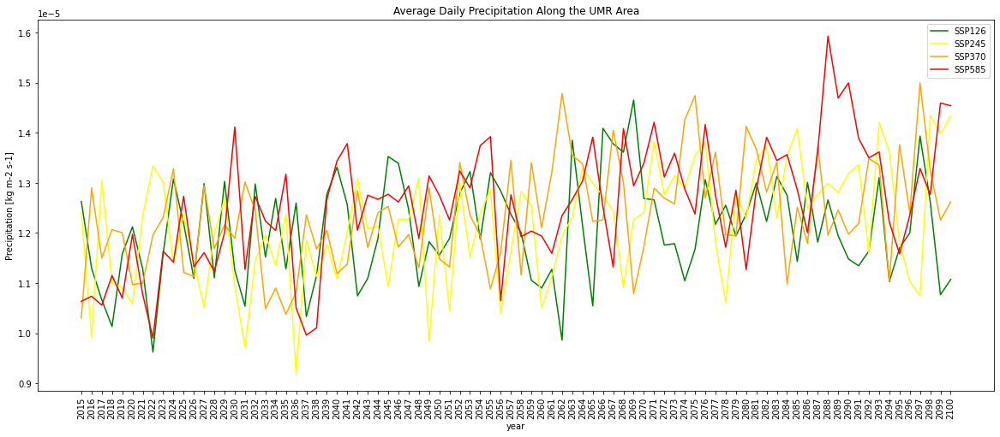

In [13]:
plt.figure(figsize=(20, 8))
plt.plot(average_yearly_pr_126['pr'], color = 'green', label = 'SSP126')
plt.plot(average_yearly_pr_245['pr'], color = 'yellow', label = 'SSP245')
plt.plot(average_yearly_pr_370['pr'], color = 'orange', label = 'SSP370')
plt.plot(average_yearly_pr_585['pr'], color = 'red', label = 'SSP585')
plt.title('Average Daily Precipitation Along the UMR Area')
plt.xlabel('year')
plt.ylabel('Precipitation [kg m-2 s-1]')
plt.xticks(np.arange(0, 86, 1), np.arange(2015, 2101, 1), rotation = 90)
plt.legend()

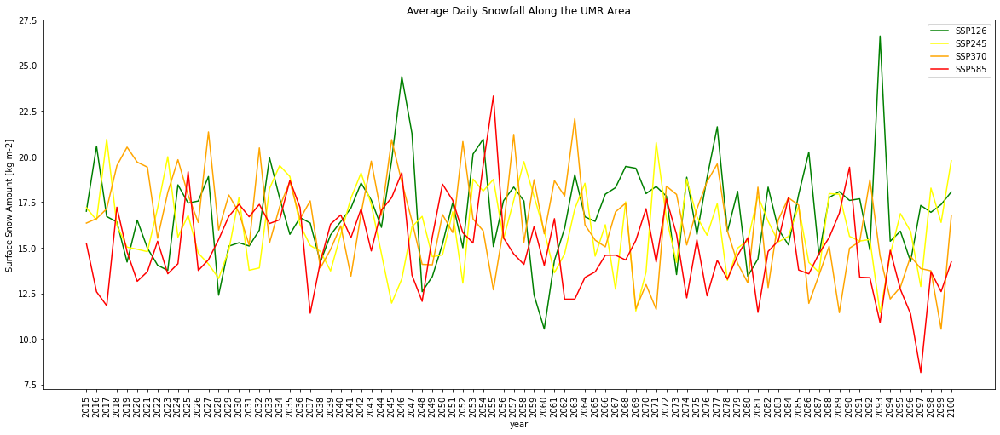

In [14]:
plt.figure(figsize=(20, 8))
plt.plot(average_yearly_snw_126['snw'], color = 'green', label = 'SSP126')
plt.plot(average_yearly_snw_245['snw'], color = 'yellow', label = 'SSP245')
plt.plot(average_yearly_snw_370['snw'], color = 'orange', label = 'SSP370')
plt.plot(average_yearly_snw_585['snw'], color = 'red', label = 'SSP585')
plt.title('Average Daily Snowfall Along the UMR Area')
plt.xlabel('year')
plt.ylabel('Surface Snow Amount [kg m-2]')
plt.xticks(np.arange(0, 86, 1), np.arange(2015, 2101, 1), rotation = 90)
plt.legend()

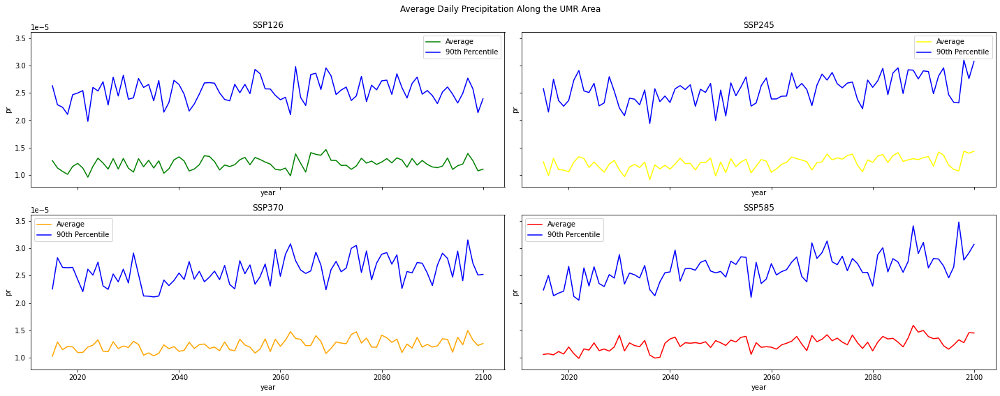

In [15]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (20, 8), sharex = True, sharey = True)
average_yearly_pr_126['pr'].plot(ax = ax1, color = 'green', label = 'Average')
pr_ssp126.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax1, color = 'blue', label = '90th Percentile')
average_yearly_pr_245['pr'].plot(ax = ax2, color = 'yellow', label = 'Average')
pr_ssp245.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax2, color = 'blue', label = '90th Percentile')
average_yearly_pr_370['pr'].plot(ax = ax3, color = 'orange', label = 'Average')
pr_ssp370.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax3, color = 'blue', label = '90th Percentile')
average_yearly_pr_585['pr'].plot(ax = ax4, color = 'red', label = 'Average')
pr_ssp585.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax4, color = 'blue', label = '90th Percentile')
plt.suptitle('Average Daily Precipitation Along the UMR Area')
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.tight_layout()
plt.draw()

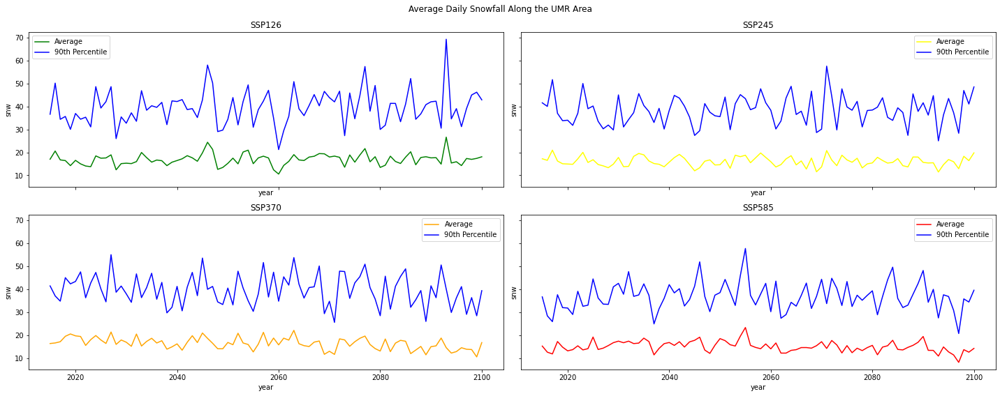

In [16]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (20, 8), sharex = True, sharey = True)
average_yearly_snw_126['snw'].plot(ax = ax1, color = 'green', label = 'Average')
snw_ssp126.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax1, color = 'blue', label = '90th Percentile')
average_yearly_snw_245['snw'].plot(ax = ax2, color = 'yellow', label = 'Average')
snw_ssp245.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax2, color = 'blue', label = '90th Percentile')
average_yearly_snw_370['snw'].plot(ax = ax3, color = 'orange', label = 'Average')
snw_ssp370.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax3, color = 'blue', label = '90th Percentile')
average_yearly_snw_585['snw'].plot(ax = ax4, color = 'red', label = 'Average')
snw_ssp585.mean(['lat', 'lon']).groupby('time.year').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax4, color = 'blue', label = '90th Percentile')
plt.suptitle('Average Daily Snowfall Along the UMR Area')
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.tight_layout()
plt.draw()

In [17]:
baseline_data_pr_126 = average_yearly_pr_126.sel(year = baseline_year)
other_data_pr_126 = average_yearly_pr_126.sel(year = slice(baseline_year + 1, None))

baseline_data_pr_245 = average_yearly_pr_245.sel(year = baseline_year)
other_data_pr_245 = average_yearly_pr_245.sel(year = slice(baseline_year + 1, None))

baseline_data_pr_370 = average_yearly_pr_370.sel(year = baseline_year)
other_data_pr_370 = average_yearly_pr_370.sel(year = slice(baseline_year + 1, None))

baseline_data_pr_585 = average_yearly_pr_585.sel(year = baseline_year)
other_data_pr_585 = average_yearly_pr_585.sel(year = slice(baseline_year + 1, None))

In [18]:
baseline_data_snw_126 = average_yearly_snw_126.sel(year = baseline_year)
other_data_snw_126 = average_yearly_snw_126.sel(year = slice(baseline_year + 1, None))

baseline_data_snw_245 = average_yearly_snw_245.sel(year = baseline_year)
other_data_snw_245 = average_yearly_snw_245.sel(year = slice(baseline_year + 1, None))

baseline_data_snw_370 = average_yearly_snw_370.sel(year = baseline_year)
other_data_snw_370 = average_yearly_snw_370.sel(year = slice(baseline_year + 1, None))

baseline_data_snw_585 = average_yearly_snw_585.sel(year = baseline_year)
other_data_snw_585 = average_yearly_snw_585.sel(year = slice(baseline_year + 1, None))

In [19]:
differences_pr_126 = [other_data_pr_126.sel(year = year) - baseline_data_pr_126 for year in years]
differences_pr_126 = xr.concat(differences_pr_126, dim = 'time')

differences_pr_245 = [other_data_pr_245.sel(year = year) - baseline_data_pr_245 for year in years]
differences_pr_245 = xr.concat(differences_pr_245, dim = 'time')

differences_pr_370 = [other_data_pr_370.sel(year = year) - baseline_data_pr_370 for year in years]
differences_pr_370 = xr.concat(differences_pr_370, dim = 'time')

differences_pr_585 = [other_data_pr_585.sel(year = year) - baseline_data_pr_585 for year in years]
differences_pr_585 = xr.concat(differences_pr_585, dim = 'time')

In [20]:
differences_snw_126 = [other_data_snw_126.sel(year = year) - baseline_data_snw_126 for year in years]
differences_snw_126 = xr.concat(differences_snw_126, dim = 'time')

differences_snw_245 = [other_data_snw_245.sel(year = year) - baseline_data_snw_245 for year in years]
differences_snw_245 = xr.concat(differences_snw_245, dim = 'time')

differences_snw_370 = [other_data_snw_370.sel(year = year) - baseline_data_snw_370 for year in years]
differences_snw_370 = xr.concat(differences_snw_370, dim = 'time')

differences_snw_585 = [other_data_snw_585.sel(year = year) - baseline_data_snw_585 for year in years]
differences_snw_585 = xr.concat(differences_snw_585, dim = 'time')

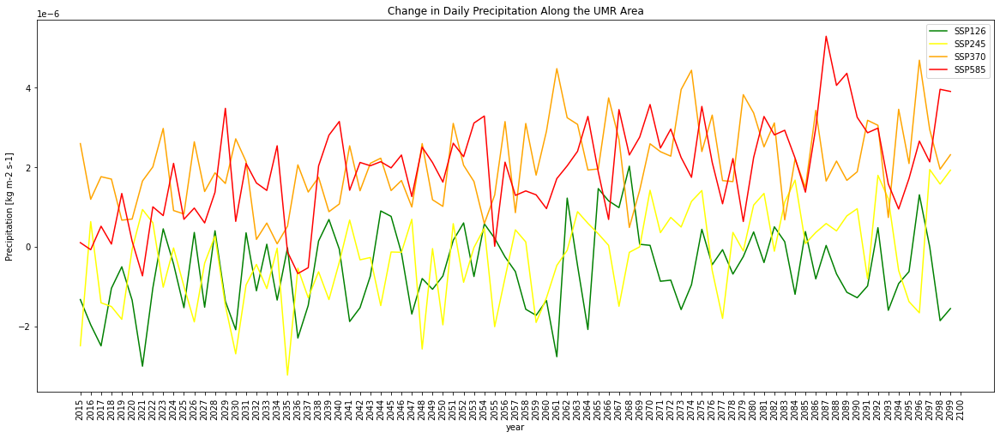

In [21]:
plt.figure(figsize=(20, 8))
plt.plot(np.array(differences_pr_126['pr']), color = 'green', label = 'SSP126')
plt.plot(np.array(differences_pr_245['pr']), color = 'yellow', label = 'SSP245')
plt.plot(np.array(differences_pr_370['pr']), color = 'orange', label = 'SSP370')
plt.plot(np.array(differences_pr_585['pr']), color = 'red', label = 'SSP585')
plt.title('Change in Daily Precipitation Along the UMR Area')
plt.xlabel('year')
plt.ylabel('Precipitation [kg m-2 s-1]')
plt.xticks(np.arange(0, 86, 1), np.arange(2015, 2101, 1), rotation = 90)
plt.legend()

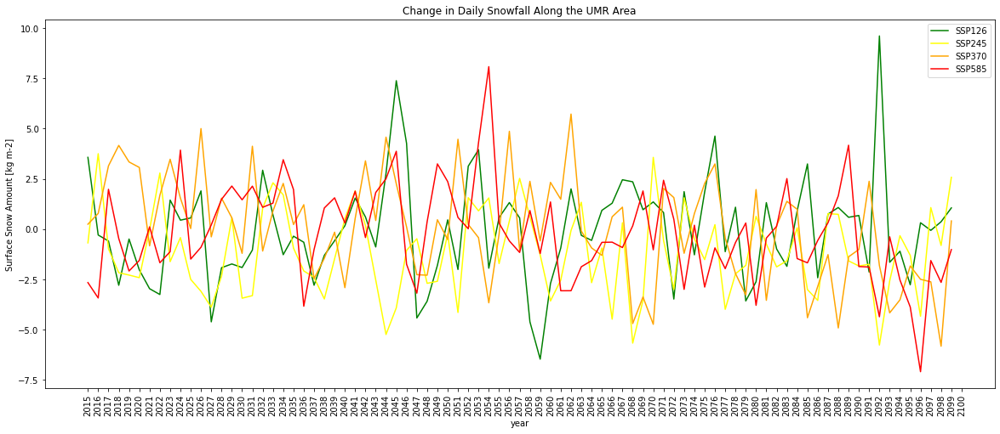

In [22]:
plt.figure(figsize=(20, 8))
plt.plot(np.array(differences_snw_126['snw']), color = 'green', label = 'SSP126')
plt.plot(np.array(differences_snw_245['snw']), color = 'yellow', label = 'SSP245')
plt.plot(np.array(differences_snw_370['snw']), color = 'orange', label = 'SSP370')
plt.plot(np.array(differences_snw_585['snw']), color = 'red', label = 'SSP585')
plt.title('Change in Daily Snowfall Along the UMR Area')
plt.xlabel('year')
plt.ylabel('Surface Snow Amount [kg m-2]')
plt.xticks(np.arange(0, 86, 1), np.arange(2015, 2101, 1), rotation = 90)
plt.legend()

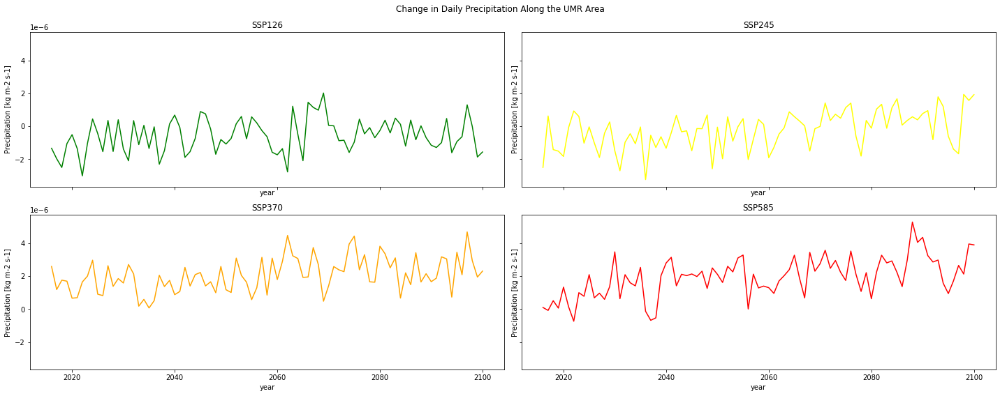

In [23]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (20, 8), sharex = True, sharey = True)
ax1.plot(years, np.array(differences_pr_126['pr']), color = 'green')
ax2.plot(years, np.array(differences_pr_245['pr']), color = 'yellow')
ax3.plot(years, np.array(differences_pr_370['pr']), color = 'orange')
ax4.plot(years, np.array(differences_pr_585['pr']), color = 'red')
plt.suptitle('Change in Daily Precipitation Along the UMR Area')
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.set_xlabel('year')
ax2.set_xlabel('year')
ax3.set_xlabel('year')
ax4.set_xlabel('year')
ax1.set_ylabel('Precipitation [kg m-2 s-1]')
ax2.set_ylabel('Precipitation [kg m-2 s-1]')
ax3.set_ylabel('Precipitation [kg m-2 s-1]')
ax4.set_ylabel('Precipitation [kg m-2 s-1]')
plt.tight_layout()
plt.draw()

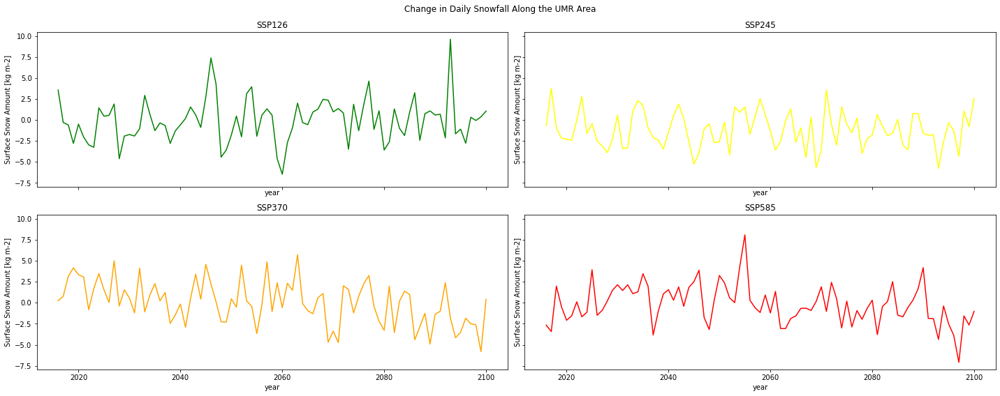

In [24]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (20, 8), sharex = True, sharey = True)
ax1.plot(years, np.array(differences_snw_126['snw']), color = 'green')
ax2.plot(years, np.array(differences_snw_245['snw']), color = 'yellow')
ax3.plot(years, np.array(differences_snw_370['snw']), color = 'orange')
ax4.plot(years, np.array(differences_snw_585['snw']), color = 'red')
plt.suptitle('Change in Daily Snowfall Along the UMR Area')
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.set_xlabel('year')
ax2.set_xlabel('year')
ax3.set_xlabel('year')
ax4.set_xlabel('year')
ax1.set_ylabel('Surface Snow Amount [kg m-2]')
ax2.set_ylabel('Surface Snow Amount [kg m-2]')
ax3.set_ylabel('Surface Snow Amount [kg m-2]')
ax4.set_ylabel('Surface Snow Amount [kg m-2]')
plt.tight_layout()
plt.draw()

In [25]:
average_yearly_pr_126_s = pr_ssp126.groupby('time.year').mean()
average_yearly_pr_245_s = pr_ssp245.groupby('time.year').mean()
average_yearly_pr_370_s = pr_ssp370.groupby('time.year').mean()
average_yearly_pr_585_s = pr_ssp585.groupby('time.year').mean()

In [26]:
average_yearly_snw_126_s = snw_ssp126.groupby('time.year').mean()
average_yearly_snw_245_s = snw_ssp245.groupby('time.year').mean()
average_yearly_snw_370_s = snw_ssp370.groupby('time.year').mean()
average_yearly_snw_585_s = snw_ssp585.groupby('time.year').mean()

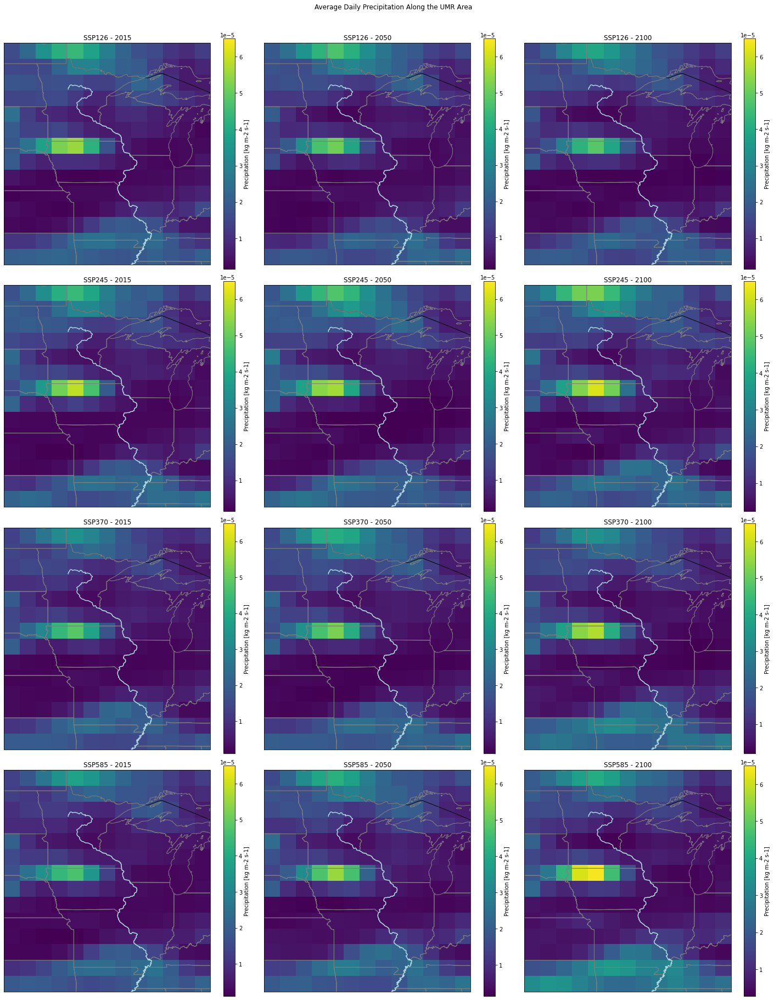

In [27]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, figsize = (20, 25), subplot_kw = {'projection': ccrs.PlateCarree()}, sharex = True, sharey = True)
average_yearly_pr_126_s['pr'].sel(year = 2015).plot.pcolormesh(vmax = 6.5E-5, ax = ax1, transform = ccrs.PlateCarree())
average_yearly_pr_126_s['pr'].sel(year = 2050).plot.pcolormesh(vmax = 6.5E-5, ax = ax2, transform = ccrs.PlateCarree())
average_yearly_pr_126_s['pr'].sel(year = 2100).plot.pcolormesh(vmax = 6.5E-5, ax = ax3, transform = ccrs.PlateCarree())
average_yearly_pr_245_s['pr'].sel(year = 2015).plot.pcolormesh(vmax = 6.5E-5, ax = ax4, transform = ccrs.PlateCarree())
average_yearly_pr_245_s['pr'].sel(year = 2050).plot.pcolormesh(vmax = 6.5E-5, ax = ax5, transform = ccrs.PlateCarree())
average_yearly_pr_245_s['pr'].sel(year = 2100).plot.pcolormesh(vmax = 6.5E-5, ax = ax6, transform = ccrs.PlateCarree())
average_yearly_pr_370_s['pr'].sel(year = 2015).plot.pcolormesh(vmax = 6.5E-5, ax = ax7, transform = ccrs.PlateCarree())
average_yearly_pr_370_s['pr'].sel(year = 2050).plot.pcolormesh(vmax = 6.5E-5, ax = ax8, transform = ccrs.PlateCarree())
average_yearly_pr_370_s['pr'].sel(year = 2100).plot.pcolormesh(vmax = 6.5E-5, ax = ax9, transform = ccrs.PlateCarree())
average_yearly_pr_585_s['pr'].sel(year = 2015).plot.pcolormesh(vmax = 6.5E-5, ax = ax10, transform = ccrs.PlateCarree())
average_yearly_pr_585_s['pr'].sel(year = 2050).plot.pcolormesh(vmax = 6.5E-5, ax = ax11, transform = ccrs.PlateCarree())
average_yearly_pr_585_s['pr'].sel(year = 2100).plot.pcolormesh(vmax = 6.5E-5, ax = ax12, transform = ccrs.PlateCarree())
plt.suptitle('Average Daily Precipitation Along the UMR Area', y = 1.01)
ax1.set_title('SSP126 - 2015')
ax2.set_title('SSP126 - 2050')
ax3.set_title('SSP126 - 2100')
ax4.set_title('SSP245 - 2015')
ax5.set_title('SSP245 - 2050')
ax6.set_title('SSP245 - 2100')
ax7.set_title('SSP370 - 2015')
ax8.set_title('SSP370 - 2050')
ax9.set_title('SSP370 - 2100')
ax10.set_title('SSP585 - 2015')
ax11.set_title('SSP585 - 2050')
ax12.set_title('SSP585 - 2100')
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(cfeature.BORDERS)
ax1.add_feature(cfeature.STATES, edgecolor = 'grey')
ax1.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax2.add_feature(cfeature.COASTLINE)
ax2.add_feature(cfeature.BORDERS)
ax2.add_feature(cfeature.STATES, edgecolor = 'grey')
ax2.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax3.add_feature(cfeature.COASTLINE)
ax3.add_feature(cfeature.BORDERS)
ax3.add_feature(cfeature.STATES, edgecolor = 'grey')
ax3.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax4.add_feature(cfeature.COASTLINE)
ax4.add_feature(cfeature.BORDERS)
ax4.add_feature(cfeature.STATES, edgecolor = 'grey')
ax4.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax5.add_feature(cfeature.COASTLINE)
ax5.add_feature(cfeature.BORDERS)
ax5.add_feature(cfeature.STATES, edgecolor = 'grey')
ax5.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS)
ax6.add_feature(cfeature.STATES, edgecolor = 'grey')
ax6.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax7.add_feature(cfeature.COASTLINE)
ax7.add_feature(cfeature.BORDERS)
ax7.add_feature(cfeature.STATES, edgecolor = 'grey')
ax7.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax8.add_feature(cfeature.COASTLINE)
ax8.add_feature(cfeature.BORDERS)
ax8.add_feature(cfeature.STATES, edgecolor = 'grey')
ax8.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax9.add_feature(cfeature.COASTLINE)
ax9.add_feature(cfeature.BORDERS)
ax9.add_feature(cfeature.STATES, edgecolor = 'grey')
ax9.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax10.add_feature(cfeature.COASTLINE)
ax10.add_feature(cfeature.BORDERS)
ax10.add_feature(cfeature.STATES, edgecolor = 'grey')
ax10.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax11.add_feature(cfeature.COASTLINE)
ax11.add_feature(cfeature.BORDERS)
ax11.add_feature(cfeature.STATES, edgecolor = 'grey')
ax11.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax12.add_feature(cfeature.COASTLINE)
ax12.add_feature(cfeature.BORDERS)
ax12.add_feature(cfeature.STATES, edgecolor = 'grey')
ax12.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
plt.tight_layout()
plt.draw()

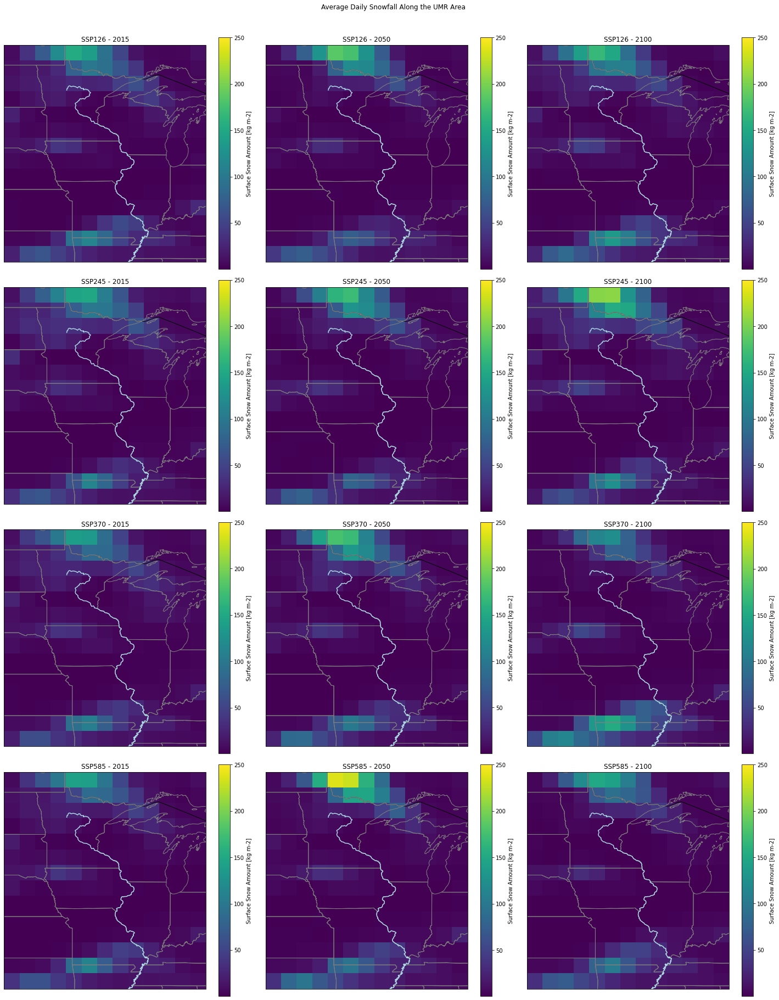

In [28]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, figsize = (20, 25), subplot_kw = {'projection': ccrs.PlateCarree()}, sharex = True, sharey = True)
average_yearly_snw_126_s['snw'].sel(year = 2015).plot.pcolormesh(vmax = 250, ax = ax1, transform = ccrs.PlateCarree())
average_yearly_snw_126_s['snw'].sel(year = 2050).plot.pcolormesh(vmax = 250, ax = ax2, transform = ccrs.PlateCarree())
average_yearly_snw_126_s['snw'].sel(year = 2100).plot.pcolormesh(vmax = 250, ax = ax3, transform = ccrs.PlateCarree())
average_yearly_snw_245_s['snw'].sel(year = 2015).plot.pcolormesh(vmax = 250, ax = ax4, transform = ccrs.PlateCarree())
average_yearly_snw_245_s['snw'].sel(year = 2050).plot.pcolormesh(vmax = 250, ax = ax5, transform = ccrs.PlateCarree())
average_yearly_snw_245_s['snw'].sel(year = 2100).plot.pcolormesh(vmax = 250, ax = ax6, transform = ccrs.PlateCarree())
average_yearly_snw_370_s['snw'].sel(year = 2015).plot.pcolormesh(vmax = 250, ax = ax7, transform = ccrs.PlateCarree())
average_yearly_snw_370_s['snw'].sel(year = 2050).plot.pcolormesh(vmax = 250, ax = ax8, transform = ccrs.PlateCarree())
average_yearly_snw_370_s['snw'].sel(year = 2100).plot.pcolormesh(vmax = 250, ax = ax9, transform = ccrs.PlateCarree())
average_yearly_snw_585_s['snw'].sel(year = 2015).plot.pcolormesh(vmax = 250, ax = ax10, transform = ccrs.PlateCarree())
average_yearly_snw_585_s['snw'].sel(year = 2050).plot.pcolormesh(vmax = 250, ax = ax11, transform = ccrs.PlateCarree())
average_yearly_snw_585_s['snw'].sel(year = 2100).plot.pcolormesh(vmax = 250, ax = ax12, transform = ccrs.PlateCarree())
plt.suptitle('Average Daily Snowfall Along the UMR Area', y = 1.01)
ax1.set_title('SSP126 - 2015')
ax2.set_title('SSP126 - 2050')
ax3.set_title('SSP126 - 2100')
ax4.set_title('SSP245 - 2015')
ax5.set_title('SSP245 - 2050')
ax6.set_title('SSP245 - 2100')
ax7.set_title('SSP370 - 2015')
ax8.set_title('SSP370 - 2050')
ax9.set_title('SSP370 - 2100')
ax10.set_title('SSP585 - 2015')
ax11.set_title('SSP585 - 2050')
ax12.set_title('SSP585 - 2100')
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(cfeature.BORDERS)
ax1.add_feature(cfeature.STATES, edgecolor = 'grey')
ax1.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax2.add_feature(cfeature.COASTLINE)
ax2.add_feature(cfeature.BORDERS)
ax2.add_feature(cfeature.STATES, edgecolor = 'grey')
ax2.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax3.add_feature(cfeature.COASTLINE)
ax3.add_feature(cfeature.BORDERS)
ax3.add_feature(cfeature.STATES, edgecolor = 'grey')
ax3.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax4.add_feature(cfeature.COASTLINE)
ax4.add_feature(cfeature.BORDERS)
ax4.add_feature(cfeature.STATES, edgecolor = 'grey')
ax4.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax5.add_feature(cfeature.COASTLINE)
ax5.add_feature(cfeature.BORDERS)
ax5.add_feature(cfeature.STATES, edgecolor = 'grey')
ax5.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS)
ax6.add_feature(cfeature.STATES, edgecolor = 'grey')
ax6.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax7.add_feature(cfeature.COASTLINE)
ax7.add_feature(cfeature.BORDERS)
ax7.add_feature(cfeature.STATES, edgecolor = 'grey')
ax7.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax8.add_feature(cfeature.COASTLINE)
ax8.add_feature(cfeature.BORDERS)
ax8.add_feature(cfeature.STATES, edgecolor = 'grey')
ax8.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax9.add_feature(cfeature.COASTLINE)
ax9.add_feature(cfeature.BORDERS)
ax9.add_feature(cfeature.STATES, edgecolor = 'grey')
ax9.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax10.add_feature(cfeature.COASTLINE)
ax10.add_feature(cfeature.BORDERS)
ax10.add_feature(cfeature.STATES, edgecolor = 'grey')
ax10.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax11.add_feature(cfeature.COASTLINE)
ax11.add_feature(cfeature.BORDERS)
ax11.add_feature(cfeature.STATES, edgecolor = 'grey')
ax11.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax12.add_feature(cfeature.COASTLINE)
ax12.add_feature(cfeature.BORDERS)
ax12.add_feature(cfeature.STATES, edgecolor = 'grey')
ax12.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
plt.tight_layout()
plt.draw()

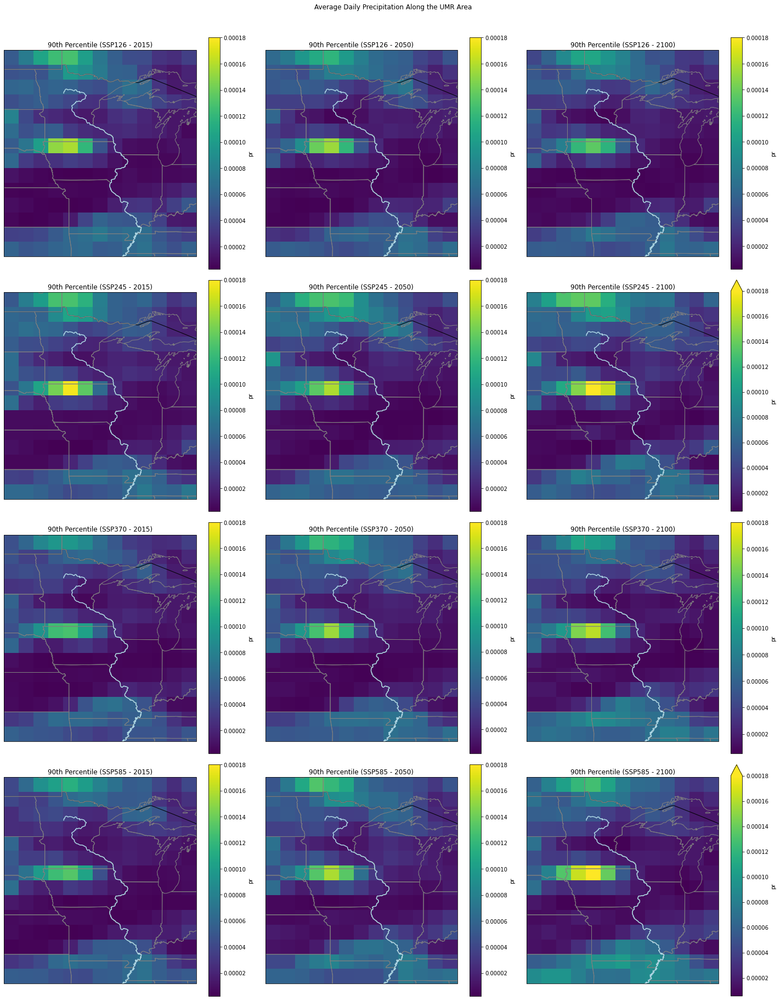

In [29]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, figsize = (20, 25), subplot_kw = {'projection': ccrs.PlateCarree()}, sharex = True, sharey = True)
pr_ssp126['pr'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax1, transform = ccrs.PlateCarree())
pr_ssp126['pr'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax2, transform = ccrs.PlateCarree())
pr_ssp126['pr'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax3, transform = ccrs.PlateCarree())
pr_ssp245['pr'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax4, transform = ccrs.PlateCarree())
pr_ssp245['pr'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax5, transform = ccrs.PlateCarree())
pr_ssp245['pr'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax6, transform = ccrs.PlateCarree())
pr_ssp370['pr'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax7, transform = ccrs.PlateCarree())
pr_ssp370['pr'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax8, transform = ccrs.PlateCarree())
pr_ssp370['pr'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax9, transform = ccrs.PlateCarree())
pr_ssp585['pr'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax10, transform = ccrs.PlateCarree())
pr_ssp585['pr'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax11, transform = ccrs.PlateCarree())
pr_ssp585['pr'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 0.00018, ax = ax12, transform = ccrs.PlateCarree())
plt.suptitle('Average Daily Precipitation Along the UMR Area', y = 1.01)
ax1.set_title('90th Percentile (SSP126 - 2015)')
ax2.set_title('90th Percentile (SSP126 - 2050)')
ax3.set_title('90th Percentile (SSP126 - 2100)')
ax4.set_title('90th Percentile (SSP245 - 2015)')
ax5.set_title('90th Percentile (SSP245 - 2050)')
ax6.set_title('90th Percentile (SSP245 - 2100)')
ax7.set_title('90th Percentile (SSP370 - 2015)')
ax8.set_title('90th Percentile (SSP370 - 2050)')
ax9.set_title('90th Percentile (SSP370 - 2100)')
ax10.set_title('90th Percentile (SSP585 - 2015)')
ax11.set_title('90th Percentile (SSP585 - 2050)')
ax12.set_title('90th Percentile (SSP585 - 2100)')
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(cfeature.BORDERS)
ax1.add_feature(cfeature.STATES, edgecolor = 'grey')
ax1.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax2.add_feature(cfeature.COASTLINE)
ax2.add_feature(cfeature.BORDERS)
ax2.add_feature(cfeature.STATES, edgecolor = 'grey')
ax2.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax3.add_feature(cfeature.COASTLINE)
ax3.add_feature(cfeature.BORDERS)
ax3.add_feature(cfeature.STATES, edgecolor = 'grey')
ax3.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax4.add_feature(cfeature.COASTLINE)
ax4.add_feature(cfeature.BORDERS)
ax4.add_feature(cfeature.STATES, edgecolor = 'grey')
ax4.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax5.add_feature(cfeature.COASTLINE)
ax5.add_feature(cfeature.BORDERS)
ax5.add_feature(cfeature.STATES, edgecolor = 'grey')
ax5.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS)
ax6.add_feature(cfeature.STATES, edgecolor = 'grey')
ax6.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax7.add_feature(cfeature.COASTLINE)
ax7.add_feature(cfeature.BORDERS)
ax7.add_feature(cfeature.STATES, edgecolor = 'grey')
ax7.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax8.add_feature(cfeature.COASTLINE)
ax8.add_feature(cfeature.BORDERS)
ax8.add_feature(cfeature.STATES, edgecolor = 'grey')
ax8.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax9.add_feature(cfeature.COASTLINE)
ax9.add_feature(cfeature.BORDERS)
ax9.add_feature(cfeature.STATES, edgecolor = 'grey')
ax9.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax10.add_feature(cfeature.COASTLINE)
ax10.add_feature(cfeature.BORDERS)
ax10.add_feature(cfeature.STATES, edgecolor = 'grey')
ax10.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax11.add_feature(cfeature.COASTLINE)
ax11.add_feature(cfeature.BORDERS)
ax11.add_feature(cfeature.STATES, edgecolor = 'grey')
ax11.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax12.add_feature(cfeature.COASTLINE)
ax12.add_feature(cfeature.BORDERS)
ax12.add_feature(cfeature.STATES, edgecolor = 'grey')
ax12.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
plt.tight_layout()
plt.draw()

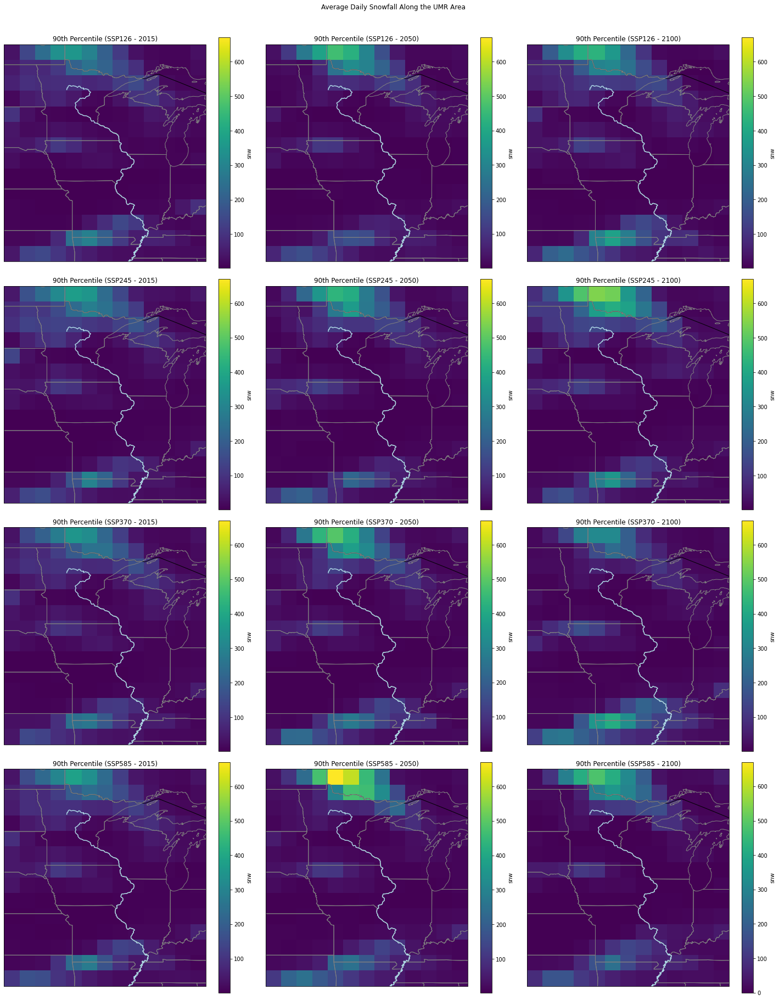

In [30]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, figsize = (20, 25), subplot_kw = {'projection': ccrs.PlateCarree()}, sharex = True, sharey = True)
snw_ssp126['snw'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax1, transform = ccrs.PlateCarree())
snw_ssp126['snw'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax2, transform = ccrs.PlateCarree())
snw_ssp126['snw'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax3, transform = ccrs.PlateCarree())
snw_ssp245['snw'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax4, transform = ccrs.PlateCarree())
snw_ssp245['snw'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax5, transform = ccrs.PlateCarree())
snw_ssp245['snw'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax6, transform = ccrs.PlateCarree())
snw_ssp370['snw'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax7, transform = ccrs.PlateCarree())
snw_ssp370['snw'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax8, transform = ccrs.PlateCarree())
snw_ssp370['snw'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax9, transform = ccrs.PlateCarree())
snw_ssp585['snw'].sel(time = slice('2015-01-01', '2015-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax10, transform = ccrs.PlateCarree())
snw_ssp585['snw'].sel(time = slice('2050-01-01', '2050-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax11, transform = ccrs.PlateCarree())
snw_ssp585['snw'].sel(time = slice('2100-01-01', '2100-12-31')).quantile(0.9, dim = 'time').plot.pcolormesh(vmax = 670, ax = ax12, transform = ccrs.PlateCarree())
plt.suptitle('Average Daily Snowfall Along the UMR Area', y = 1.01)
ax1.set_title('90th Percentile (SSP126 - 2015)')
ax2.set_title('90th Percentile (SSP126 - 2050)')
ax3.set_title('90th Percentile (SSP126 - 2100)')
ax4.set_title('90th Percentile (SSP245 - 2015)')
ax5.set_title('90th Percentile (SSP245 - 2050)')
ax6.set_title('90th Percentile (SSP245 - 2100)')
ax7.set_title('90th Percentile (SSP370 - 2015)')
ax8.set_title('90th Percentile (SSP370 - 2050)')
ax9.set_title('90th Percentile (SSP370 - 2100)')
ax10.set_title('90th Percentile (SSP585 - 2015)')
ax11.set_title('90th Percentile (SSP585 - 2050)')
ax12.set_title('90th Percentile (SSP585 - 2100)')
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(cfeature.BORDERS)
ax1.add_feature(cfeature.STATES, edgecolor = 'grey')
ax1.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax2.add_feature(cfeature.COASTLINE)
ax2.add_feature(cfeature.BORDERS)
ax2.add_feature(cfeature.STATES, edgecolor = 'grey')
ax2.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax3.add_feature(cfeature.COASTLINE)
ax3.add_feature(cfeature.BORDERS)
ax3.add_feature(cfeature.STATES, edgecolor = 'grey')
ax3.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax4.add_feature(cfeature.COASTLINE)
ax4.add_feature(cfeature.BORDERS)
ax4.add_feature(cfeature.STATES, edgecolor = 'grey')
ax4.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax5.add_feature(cfeature.COASTLINE)
ax5.add_feature(cfeature.BORDERS)
ax5.add_feature(cfeature.STATES, edgecolor = 'grey')
ax5.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS)
ax6.add_feature(cfeature.STATES, edgecolor = 'grey')
ax6.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax7.add_feature(cfeature.COASTLINE)
ax7.add_feature(cfeature.BORDERS)
ax7.add_feature(cfeature.STATES, edgecolor = 'grey')
ax7.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax8.add_feature(cfeature.COASTLINE)
ax8.add_feature(cfeature.BORDERS)
ax8.add_feature(cfeature.STATES, edgecolor = 'grey')
ax8.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax9.add_feature(cfeature.COASTLINE)
ax9.add_feature(cfeature.BORDERS)
ax9.add_feature(cfeature.STATES, edgecolor = 'grey')
ax9.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax10.add_feature(cfeature.COASTLINE)
ax10.add_feature(cfeature.BORDERS)
ax10.add_feature(cfeature.STATES, edgecolor = 'grey')
ax10.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax11.add_feature(cfeature.COASTLINE)
ax11.add_feature(cfeature.BORDERS)
ax11.add_feature(cfeature.STATES, edgecolor = 'grey')
ax11.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax12.add_feature(cfeature.COASTLINE)
ax12.add_feature(cfeature.BORDERS)
ax12.add_feature(cfeature.STATES, edgecolor = 'grey')
ax12.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
plt.tight_layout()
plt.draw()

In [31]:
baseline_data_s_pr_126 = average_yearly_pr_126_s.sel(year = baseline_year)
other_data_s_pr_126 = average_yearly_pr_126_s.sel(year = slice(baseline_year + 1, None))

baseline_data_s_pr_245 = average_yearly_pr_245_s.sel(year = baseline_year)
other_data_s_pr_245 = average_yearly_pr_245_s.sel(year = slice(baseline_year + 1, None))

baseline_data_s_pr_370 = average_yearly_pr_370_s.sel(year = baseline_year)
other_data_s_pr_370 = average_yearly_pr_370_s.sel(year = slice(baseline_year + 1, None))

baseline_data_s_pr_585 = average_yearly_pr_585_s.sel(year = baseline_year)
other_data_s_pr_585 = average_yearly_pr_585_s.sel(year = slice(baseline_year + 1, None))

In [32]:
baseline_data_s_snw_126 = average_yearly_snw_126_s.sel(year = baseline_year)
other_data_s_snw_126 = average_yearly_snw_126_s.sel(year = slice(baseline_year + 1, None))

baseline_data_s_snw_245 = average_yearly_snw_245_s.sel(year = baseline_year)
other_data_s_snw_245 = average_yearly_snw_245_s.sel(year = slice(baseline_year + 1, None))

baseline_data_s_snw_370 = average_yearly_snw_370_s.sel(year = baseline_year)
other_data_s_snw_370 = average_yearly_snw_370_s.sel(year = slice(baseline_year + 1, None))

baseline_data_s_snw_585 = average_yearly_snw_585_s.sel(year = baseline_year)
other_data_s_snw_585 = average_yearly_snw_585_s.sel(year = slice(baseline_year + 1, None))

In [33]:
differences_s_pr_126 = [other_data_s_pr_126.sel(year = year) - baseline_data_s_pr_126 for year in years]
differences_s_pr_126 = xr.concat(differences_s_pr_126, dim = 'time')

differences_s_pr_245 = [other_data_s_pr_245.sel(year = year) - baseline_data_s_pr_245 for year in years]
differences_s_pr_245 = xr.concat(differences_s_pr_245, dim = 'time')

differences_s_pr_370 = [other_data_s_pr_370.sel(year = year) - baseline_data_s_pr_370 for year in years]
differences_s_pr_370 = xr.concat(differences_s_pr_370, dim = 'time')

differences_s_pr_585 = [other_data_s_pr_585.sel(year = year) - baseline_data_s_pr_585 for year in years]
differences_s_pr_585 = xr.concat(differences_s_pr_585, dim = 'time')

In [34]:
differences_s_snw_126 = [other_data_s_snw_126.sel(year = year) - baseline_data_s_snw_126 for year in years]
differences_s_snw_126 = xr.concat(differences_s_snw_126, dim = 'time')

differences_s_snw_245 = [other_data_s_snw_245.sel(year = year) - baseline_data_s_snw_245 for year in years]
differences_s_snw_245 = xr.concat(differences_s_snw_245, dim = 'time')

differences_s_snw_370 = [other_data_s_snw_370.sel(year = year) - baseline_data_s_snw_370 for year in years]
differences_s_snw_370 = xr.concat(differences_s_snw_370, dim = 'time')

differences_s_snw_585 = [other_data_s_snw_585.sel(year = year) - baseline_data_s_snw_585 for year in years]
differences_s_snw_585 = xr.concat(differences_s_snw_585, dim = 'time')

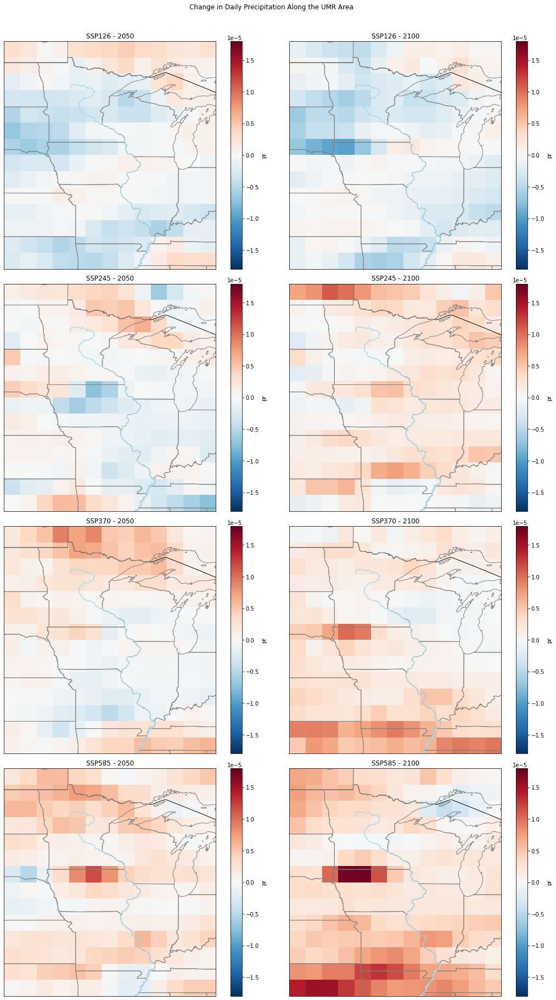

In [35]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize = (15, 25), subplot_kw = {'projection': ccrs.PlateCarree()}, sharex = True, sharey = True)
differences_s_pr_126['pr'].isel(time = 34).plot.pcolormesh(vmax = 1.8E-5, ax = ax1, transform = ccrs.PlateCarree())
differences_s_pr_126['pr'].isel(time = 84).plot.pcolormesh(vmax = 1.8E-5, ax = ax2, transform = ccrs.PlateCarree())
differences_s_pr_245['pr'].isel(time = 34).plot.pcolormesh(vmax = 1.8E-5, ax = ax3, transform = ccrs.PlateCarree())
differences_s_pr_245['pr'].isel(time = 84).plot.pcolormesh(vmax = 1.8E-5, ax = ax4, transform = ccrs.PlateCarree())
differences_s_pr_370['pr'].isel(time = 34).plot.pcolormesh(vmax = 1.8E-5, ax = ax5, transform = ccrs.PlateCarree())
differences_s_pr_370['pr'].isel(time = 84).plot.pcolormesh(vmax = 1.8E-5, ax = ax6, transform = ccrs.PlateCarree())
differences_s_pr_585['pr'].isel(time = 34).plot.pcolormesh(vmax = 1.8E-5, ax = ax7, transform = ccrs.PlateCarree())
differences_s_pr_585['pr'].isel(time = 84).plot.pcolormesh(vmax = 1.8E-5, ax = ax8, transform = ccrs.PlateCarree())
plt.suptitle('Change in Daily Precipitation Along the UMR Area', y = 1.01)
ax1.set_title('SSP126 - 2050')
ax2.set_title('SSP126 - 2100')
ax3.set_title('SSP245 - 2050')
ax4.set_title('SSP245 - 2100')
ax5.set_title('SSP370 - 2050')
ax6.set_title('SSP370 - 2100')
ax7.set_title('SSP585 - 2050')
ax8.set_title('SSP585 - 2100')
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(cfeature.BORDERS)
ax1.add_feature(cfeature.STATES, edgecolor = 'grey')
ax1.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax2.add_feature(cfeature.COASTLINE)
ax2.add_feature(cfeature.BORDERS)
ax2.add_feature(cfeature.STATES, edgecolor = 'grey')
ax2.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax3.add_feature(cfeature.COASTLINE)
ax3.add_feature(cfeature.BORDERS)
ax3.add_feature(cfeature.STATES, edgecolor = 'grey')
ax3.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax4.add_feature(cfeature.COASTLINE)
ax4.add_feature(cfeature.BORDERS)
ax4.add_feature(cfeature.STATES, edgecolor = 'grey')
ax4.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax5.add_feature(cfeature.COASTLINE)
ax5.add_feature(cfeature.BORDERS)
ax5.add_feature(cfeature.STATES, edgecolor = 'grey')
ax5.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS)
ax6.add_feature(cfeature.STATES, edgecolor = 'grey')
ax6.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax7.add_feature(cfeature.COASTLINE)
ax7.add_feature(cfeature.BORDERS)
ax7.add_feature(cfeature.STATES, edgecolor = 'grey')
ax7.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax8.add_feature(cfeature.COASTLINE)
ax8.add_feature(cfeature.BORDERS)
ax8.add_feature(cfeature.STATES, edgecolor = 'grey')
ax8.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
plt.tight_layout()
plt.draw()


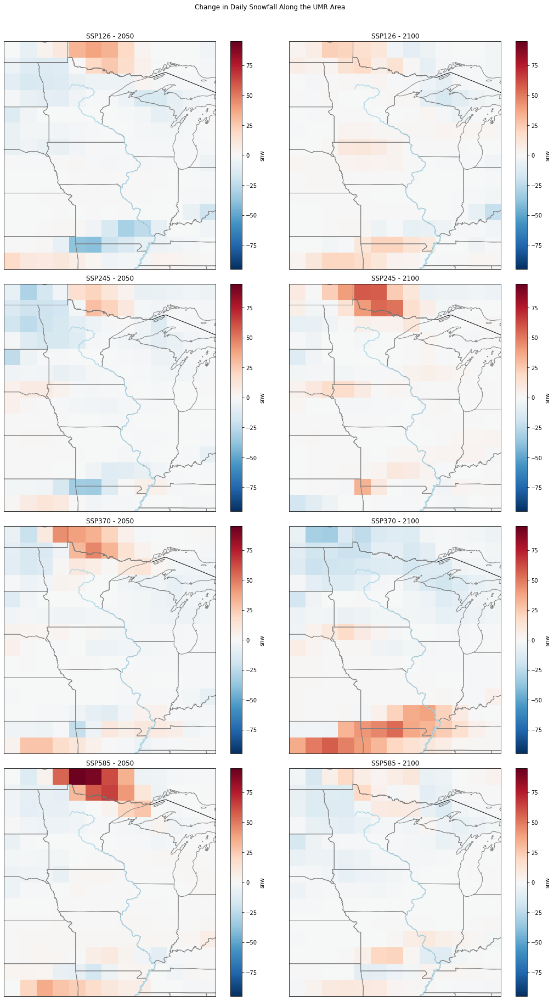

In [36]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize = (15, 25), subplot_kw = {'projection': ccrs.PlateCarree()}, sharex = True, sharey = True)
differences_s_snw_126['snw'].isel(time = 34).plot.pcolormesh(vmax = 95, ax = ax1, transform = ccrs.PlateCarree())
differences_s_snw_126['snw'].isel(time = 84).plot.pcolormesh(vmax = 95, ax = ax2, transform = ccrs.PlateCarree())
differences_s_snw_245['snw'].isel(time = 34).plot.pcolormesh(vmax = 95, ax = ax3, transform = ccrs.PlateCarree())
differences_s_snw_245['snw'].isel(time = 84).plot.pcolormesh(vmax = 95, ax = ax4, transform = ccrs.PlateCarree())
differences_s_snw_370['snw'].isel(time = 34).plot.pcolormesh(vmax = 95, ax = ax5, transform = ccrs.PlateCarree())
differences_s_snw_370['snw'].isel(time = 84).plot.pcolormesh(vmax = 95, ax = ax6, transform = ccrs.PlateCarree())
differences_s_snw_585['snw'].isel(time = 34).plot.pcolormesh(vmax = 95, ax = ax7, transform = ccrs.PlateCarree())
differences_s_snw_585['snw'].isel(time = 84).plot.pcolormesh(vmax = 95, ax = ax8, transform = ccrs.PlateCarree())
plt.suptitle('Change in Daily Snowfall Along the UMR Area', y = 1.01)
ax1.set_title('SSP126 - 2050')
ax2.set_title('SSP126 - 2100')
ax3.set_title('SSP245 - 2050')
ax4.set_title('SSP245 - 2100')
ax5.set_title('SSP370 - 2050')
ax6.set_title('SSP370 - 2100')
ax7.set_title('SSP585 - 2050')
ax8.set_title('SSP585 - 2100')
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(cfeature.BORDERS)
ax1.add_feature(cfeature.STATES, edgecolor = 'grey')
ax1.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax2.add_feature(cfeature.COASTLINE)
ax2.add_feature(cfeature.BORDERS)
ax2.add_feature(cfeature.STATES, edgecolor = 'grey')
ax2.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax3.add_feature(cfeature.COASTLINE)
ax3.add_feature(cfeature.BORDERS)
ax3.add_feature(cfeature.STATES, edgecolor = 'grey')
ax3.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax4.add_feature(cfeature.COASTLINE)
ax4.add_feature(cfeature.BORDERS)
ax4.add_feature(cfeature.STATES, edgecolor = 'grey')
ax4.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax5.add_feature(cfeature.COASTLINE)
ax5.add_feature(cfeature.BORDERS)
ax5.add_feature(cfeature.STATES, edgecolor = 'grey')
ax5.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS)
ax6.add_feature(cfeature.STATES, edgecolor = 'grey')
ax6.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax7.add_feature(cfeature.COASTLINE)
ax7.add_feature(cfeature.BORDERS)
ax7.add_feature(cfeature.STATES, edgecolor = 'grey')
ax7.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
ax8.add_feature(cfeature.COASTLINE)
ax8.add_feature(cfeature.BORDERS)
ax8.add_feature(cfeature.STATES, edgecolor = 'grey')
ax8.add_geometries(rivers, crs = ccrs.PlateCarree(), linewidth = 1.5, edgecolor = 'lightblue', facecolor = 'none')
plt.tight_layout()
plt.draw()

In [37]:
average_seasonal_pr_126 = pr_ssp126.groupby('time.season').mean()
average_seasonal_pr_245 = pr_ssp245.groupby('time.season').mean()
average_seasonal_pr_370 = pr_ssp370.groupby('time.season').mean()
average_seasonal_pr_585 = pr_ssp585.groupby('time.season').mean()

In [38]:
average_seasonal_snw_126 = snw_ssp126.groupby('time.season').mean()
average_seasonal_snw_245 = snw_ssp245.groupby('time.season').mean()
average_seasonal_snw_370 = snw_ssp370.groupby('time.season').mean()
average_seasonal_snw_585 = snw_ssp585.groupby('time.season').mean()

Text(-0.85, 1.11, 'Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP585')

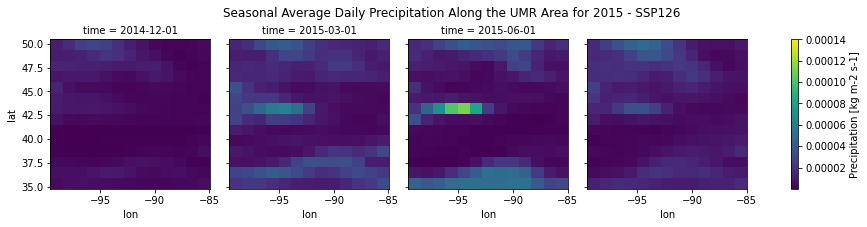

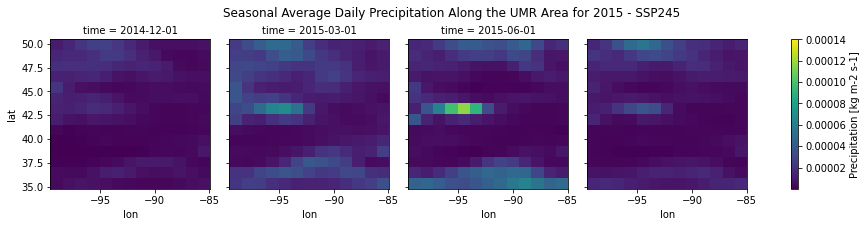

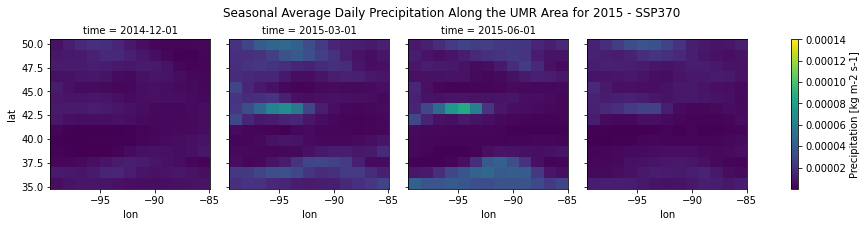

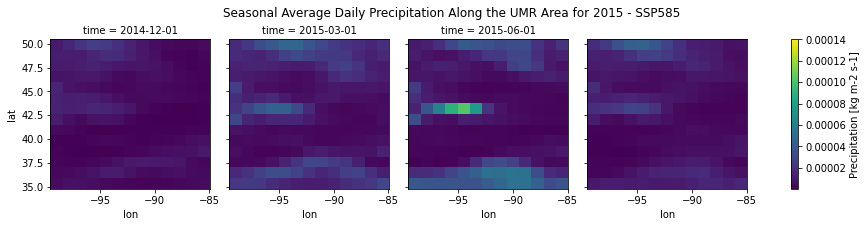

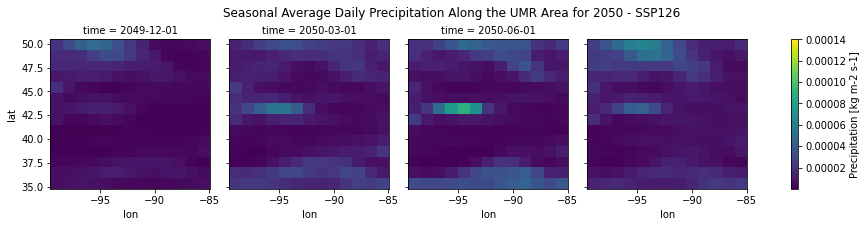

...

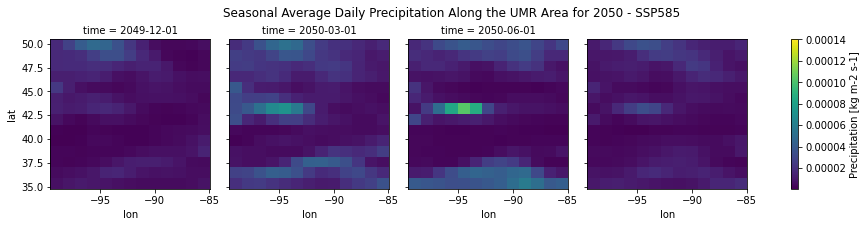

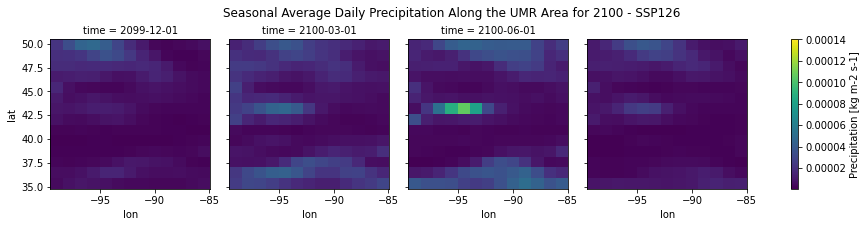

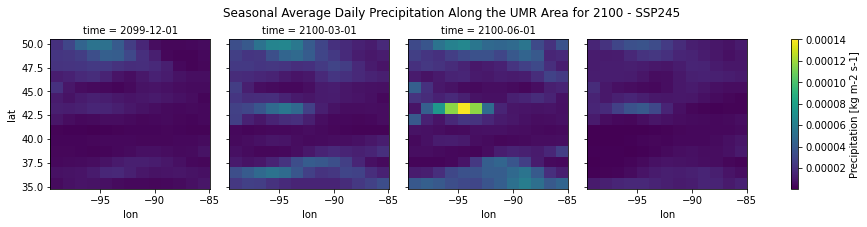

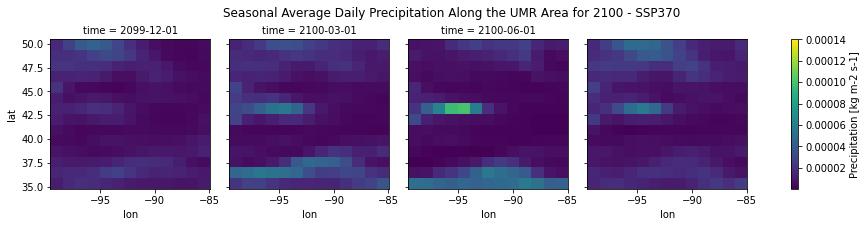

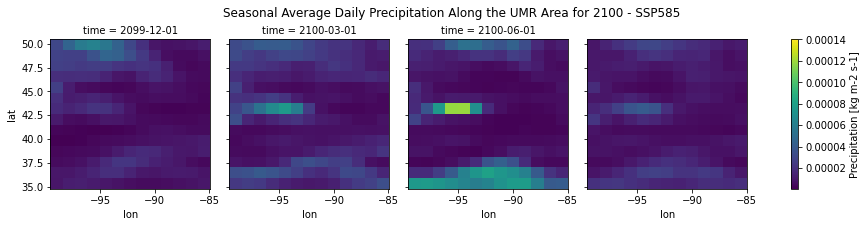

In [39]:
pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP126', x = -0.85, y = 1.11)
pr_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP245', x = -0.85, y = 1.11)
pr_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP370', x = -0.85, y = 1.11)
pr_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP585', x = -0.85, y = 1.11)

pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP126', x = -0.85, y = 1.11)
pr_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP245', x = -0.85, y = 1.11)
pr_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP370', x = -0.85, y = 1.11)
pr_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP585', x = -0.85, y = 1.11)

pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP126', x = -0.85, y = 1.11)
pr_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP245', x = -0.85, y = 1.11)
pr_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP370', x = -0.85, y = 1.11)
pr_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['pr'].plot(col = 'time', vmax = 0.00014)
plt.title('Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP585', x = -0.85, y = 1.11)

Text(-0.85, 1.11, 'Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP585')

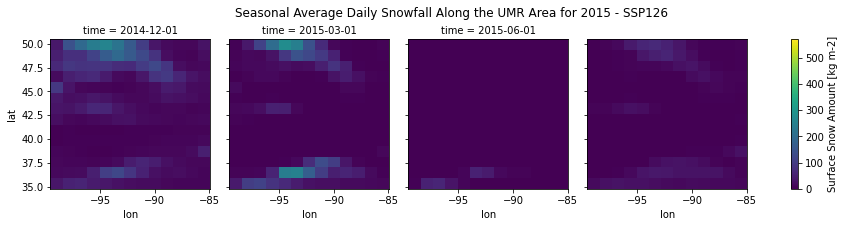

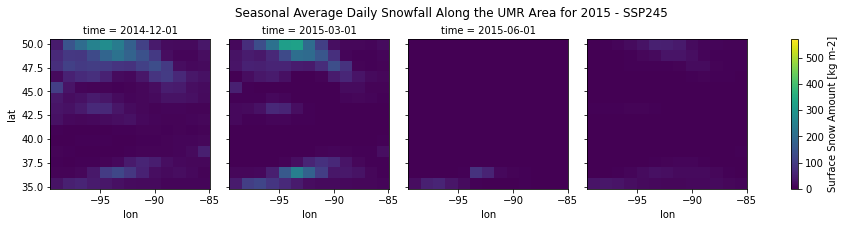

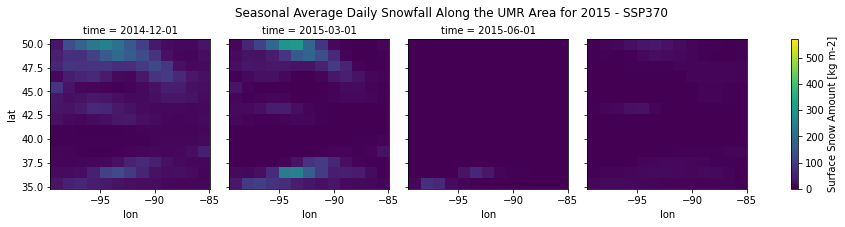

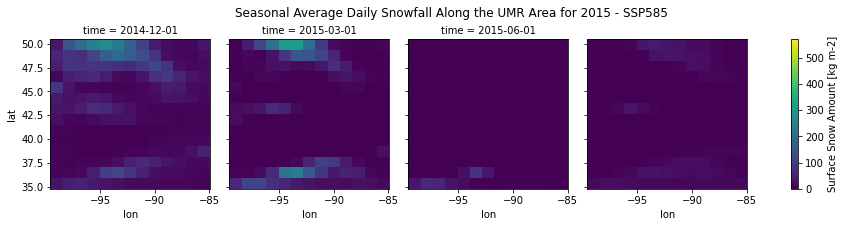

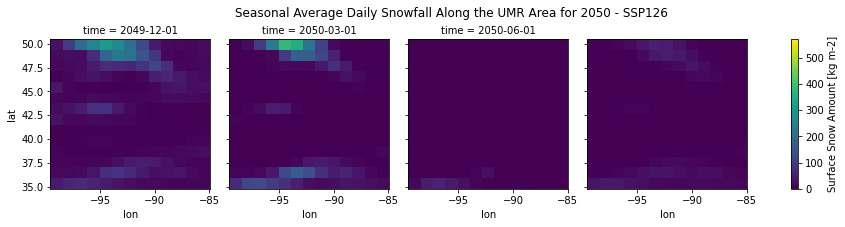

...

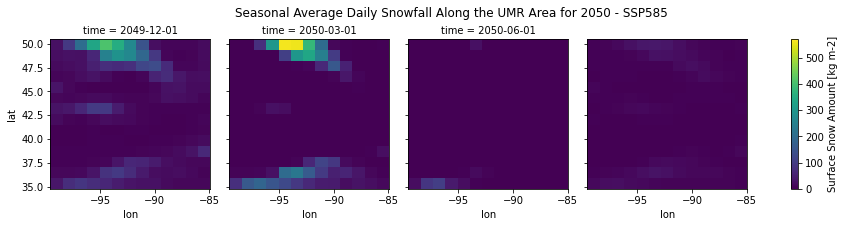

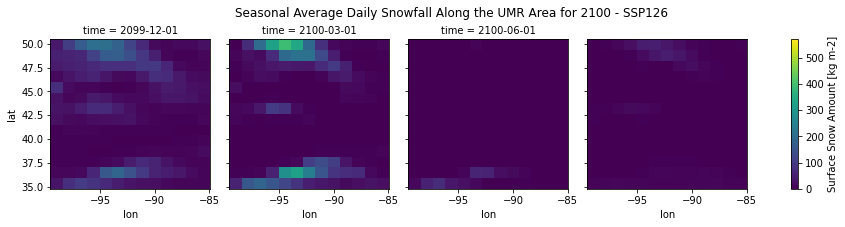

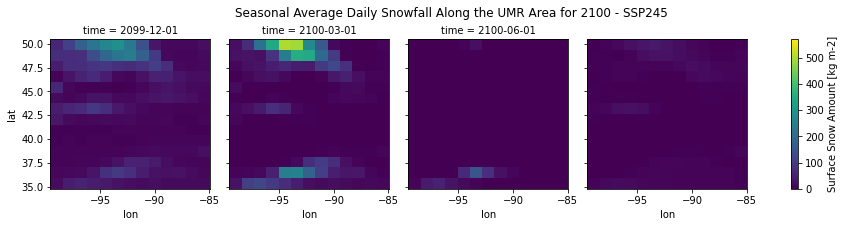

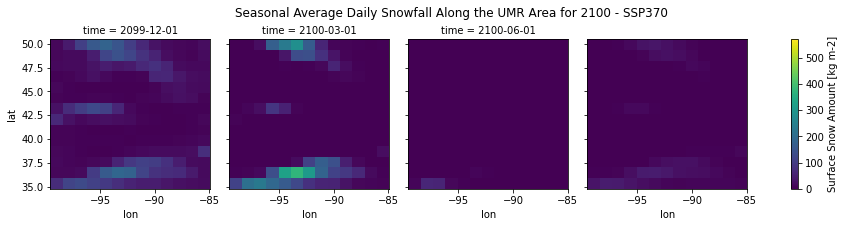

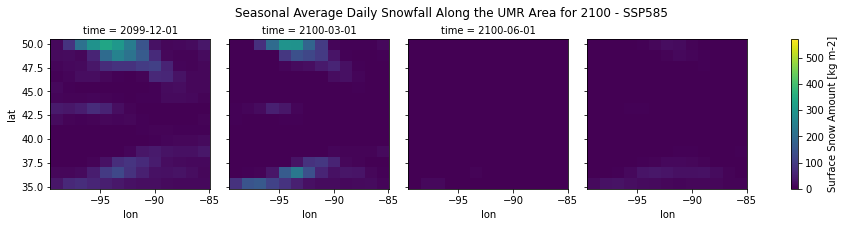

In [40]:
snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP126', x = -0.85, y = 1.11)
snw_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP245', x = -0.85, y = 1.11)
snw_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP370', x = -0.85, y = 1.11)
snw_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP585', x = -0.85, y = 1.11)

snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP126', x = -0.85, y = 1.11)
snw_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP245', x = -0.85, y = 1.11)
snw_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP370', x = -0.85, y = 1.11)
snw_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP585', x = -0.85, y = 1.11)

snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP126', x = -0.85, y = 1.11)
snw_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP245', x = -0.85, y = 1.11)
snw_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP370', x = -0.85, y = 1.11)
snw_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01'))['snw'].plot(col = 'time', vmax = 570)
plt.title('Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP585', x = -0.85, y = 1.11)

Text(-0.85, 1.11, '90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP585')

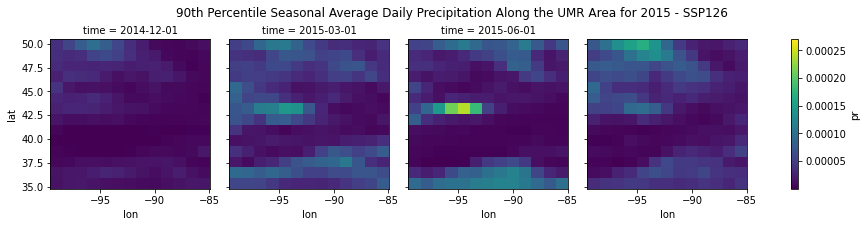

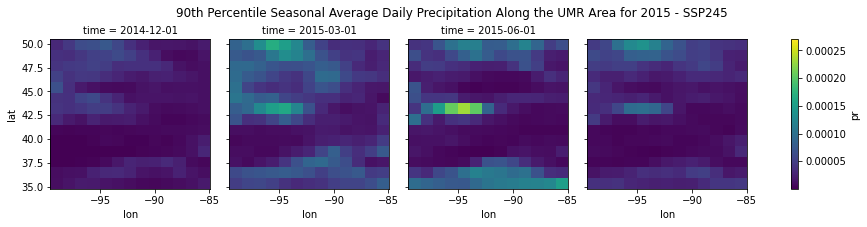

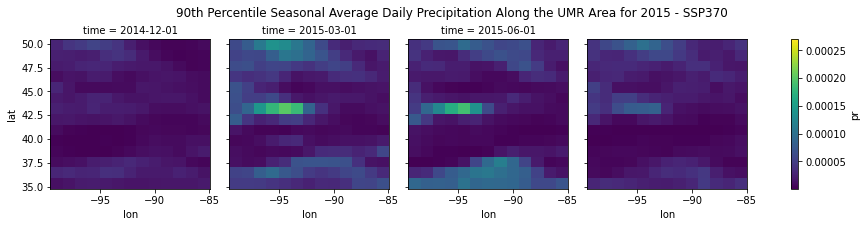

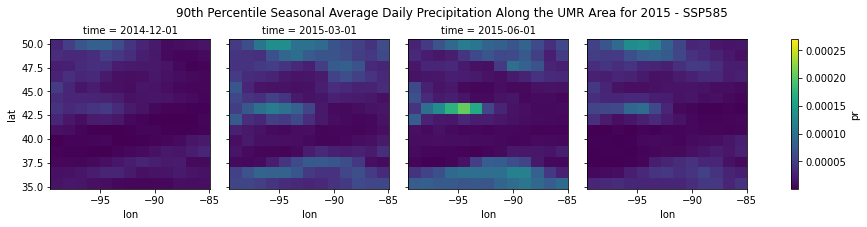

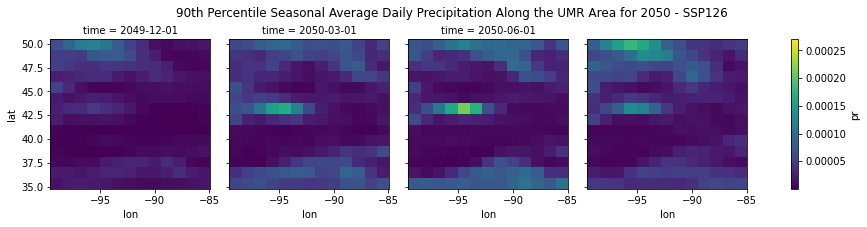

...

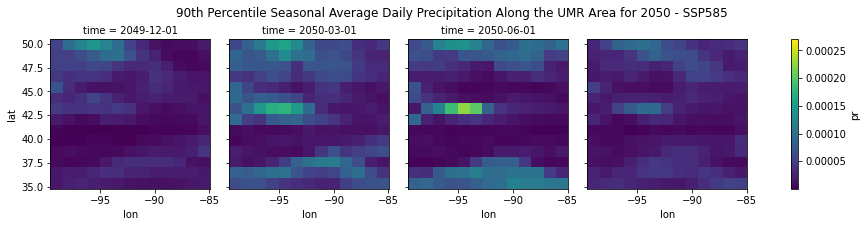

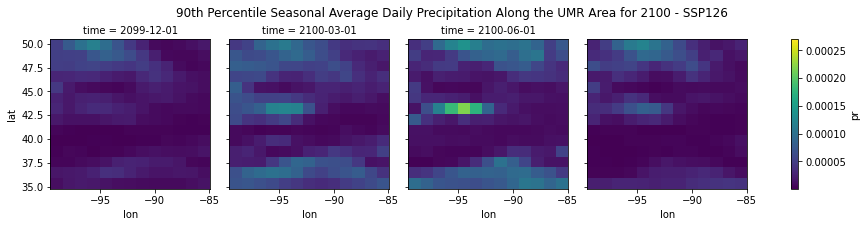

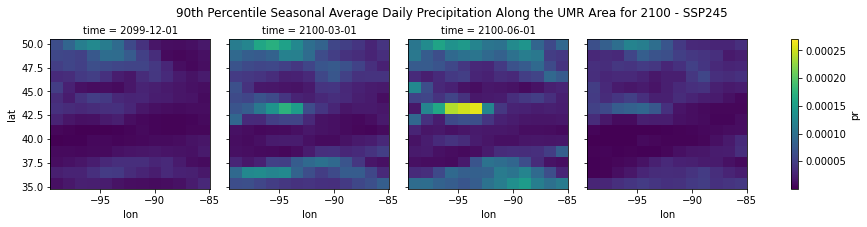

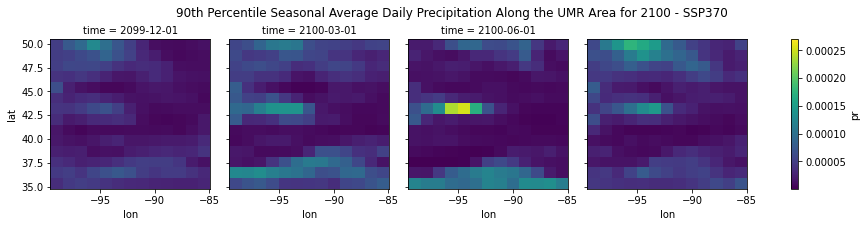

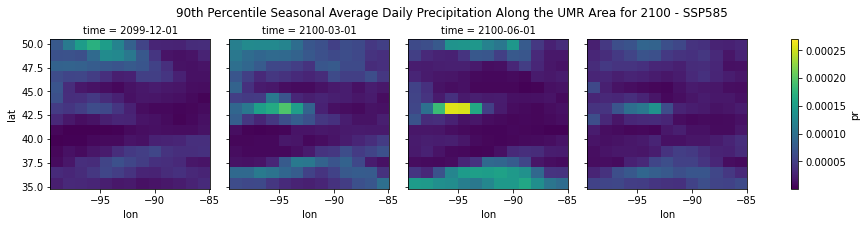

In [41]:
pr_ssp126['pr'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP126', x = -0.85, y = 1.11)
pr_ssp245['pr'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP245', x = -0.85, y = 1.11)
pr_ssp370['pr'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP370', x = -0.85, y = 1.11)
pr_ssp585['pr'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2015 - SSP585', x = -0.85, y = 1.11)

pr_ssp126['pr'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP126', x = -0.85, y = 1.11)
pr_ssp245['pr'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP245', x = -0.85, y = 1.11)
pr_ssp370['pr'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP370', x = -0.85, y = 1.11)
pr_ssp585['pr'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2050 - SSP585', x = -0.85, y = 1.11)

pr_ssp126['pr'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP126', x = -0.85, y = 1.11)
pr_ssp245['pr'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP245', x = -0.85, y = 1.11)
pr_ssp370['pr'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP370', x = -0.85, y = 1.11)
pr_ssp585['pr'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 0.00027)
plt.title('90th Percentile Seasonal Average Daily Precipitation Along the UMR Area for 2100 - SSP585', x = -0.85, y = 1.11)

Text(-0.85, 1.11, '90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP585')

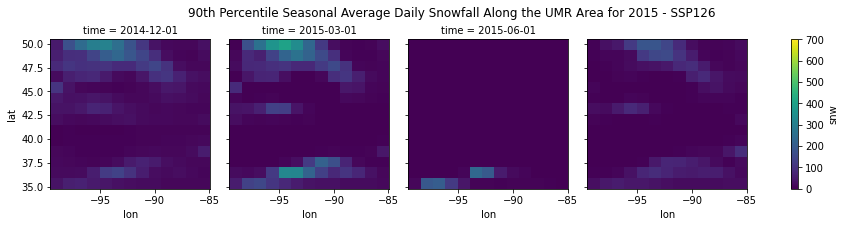

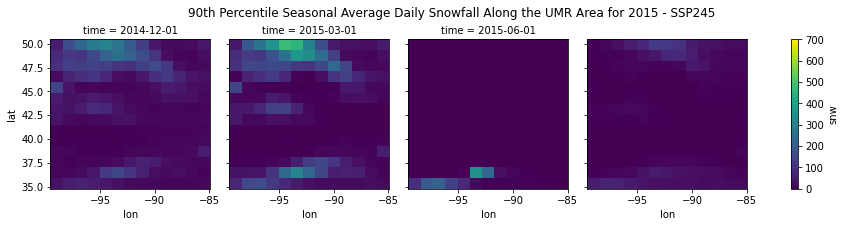

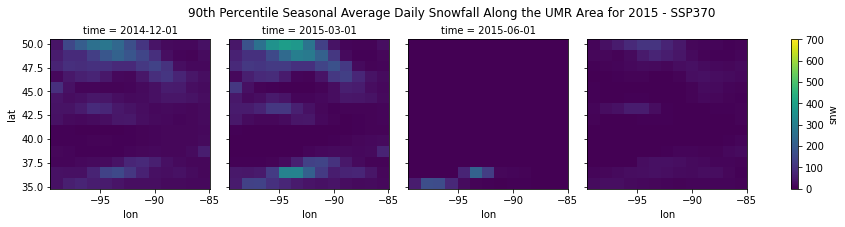

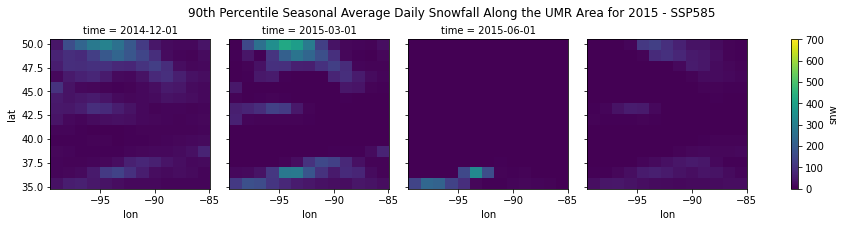

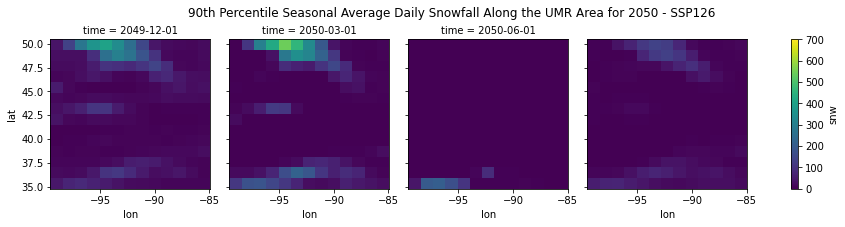

...

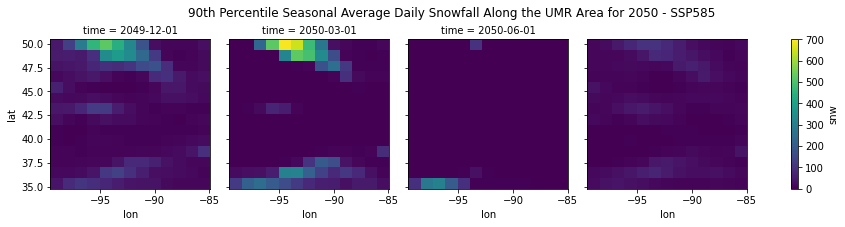

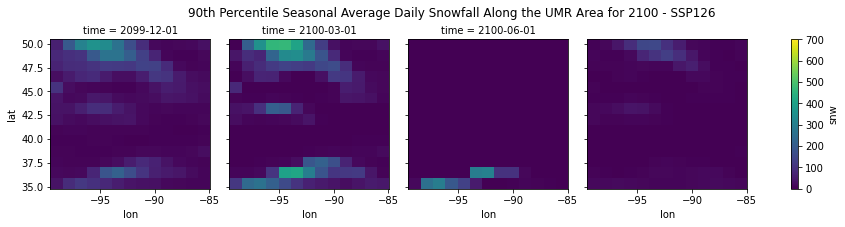

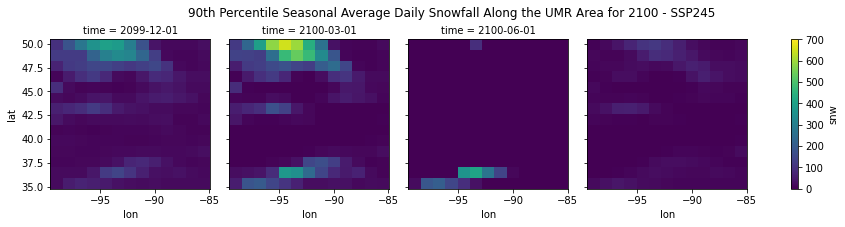

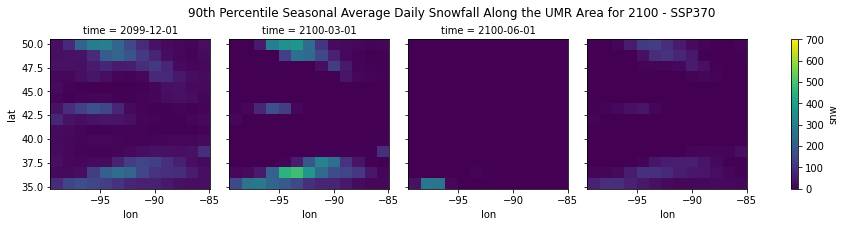

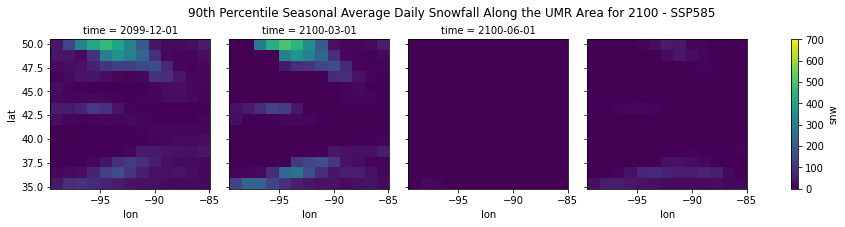

In [42]:
snw_ssp126['snw'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP126', x = -0.85, y = 1.11)
snw_ssp245['snw'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP245', x = -0.85, y = 1.11)
snw_ssp370['snw'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP370', x = -0.85, y = 1.11)
snw_ssp585['snw'].sel(time = slice('2015-01-01', '2015-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2015 - SSP585', x = -0.85, y = 1.11)

snw_ssp126['snw'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP126', x = -0.85, y = 1.11)
snw_ssp245['snw'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP245', x = -0.85, y = 1.11)
snw_ssp370['snw'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP370', x = -0.85, y = 1.11)
snw_ssp585['snw'].sel(time = slice('2049-12-01', '2050-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2050 - SSP585', x = -0.85, y = 1.11)

snw_ssp126['snw'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP126', x = -0.85, y = 1.11)
snw_ssp245['snw'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP245', x = -0.85, y = 1.11)
snw_ssp370['snw'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP370', x = -0.85, y = 1.11)
snw_ssp585['snw'].sel(time = slice('2099-12-01', '2100-11-30')).resample(time = 'QS-DEC').quantile(0.9, dim = 'time').plot(col = 'time', vmax = 700)
plt.title('90th Percentile Seasonal Average Daily Snowfall Along the UMR Area for 2100 - SSP585', x = -0.85, y = 1.11)

In [43]:
a, b = xr.align(pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp126_2050 = a['pr'] - b['pr']
a, b = xr.align(pr_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp245_2050 = a['pr'] - b['pr']
a, b = xr.align(pr_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp370_2050 = a['pr'] - b['pr']
a, b = xr.align(pr_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp585_2050 = a['pr'] - b['pr']

a, b = xr.align(pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp126_2100 = a['pr'] - b['pr']
a, b = xr.align(pr_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp245_2100 = a['pr'] - b['pr']
a, b = xr.align(pr_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp370_2100 = a['pr'] - b['pr']
a, b = xr.align(pr_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), pr_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_pr_ssp585_2100 = a['pr'] - b['pr']

In [44]:
a, b = xr.align(snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp126_2050 = a['snw'] - b['snw']
a, b = xr.align(snw_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp245_2050 = a['snw'] - b['snw']
a, b = xr.align(snw_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp370_2050 = a['snw'] - b['snw']
a, b = xr.align(snw_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2049-12-01', '2050-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp585_2050 = a['snw'] - b['snw']

a, b = xr.align(snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp126_2100 = a['snw'] - b['snw']
a, b = xr.align(snw_ssp245.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp245_2100 = a['snw'] - b['snw']
a, b = xr.align(snw_ssp370.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp370_2100 = a['snw'] - b['snw']
a, b = xr.align(snw_ssp585.resample(time = 'QS-DEC').mean().sel(time = slice('2099-12-01', '2100-11-01')), snw_ssp126.resample(time = 'QS-DEC').mean().sel(time = slice('2014-12-01', '2015-11-01')), join = 'override')
anomaly_s_snw_ssp585_2100 = a['snw'] - b['snw']

Text(-0.85, 1.11, 'Change in Seasonal Daily Precipitation Along the UMR Area for 2100 - SSP585')

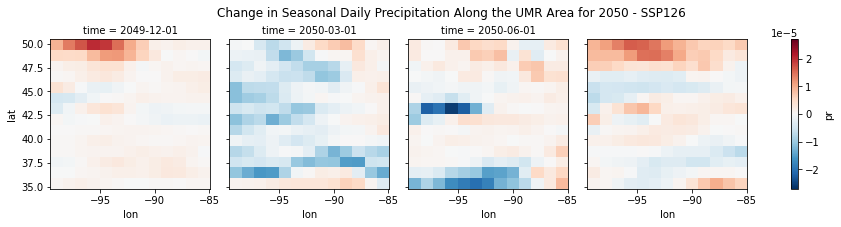

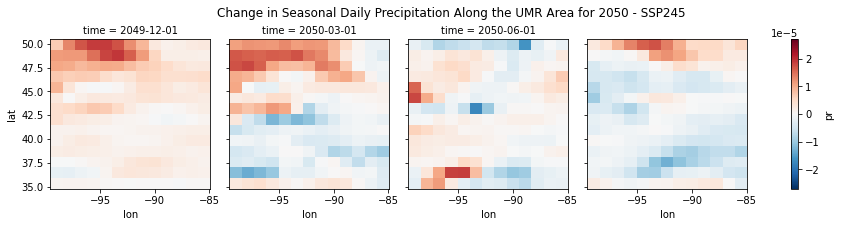

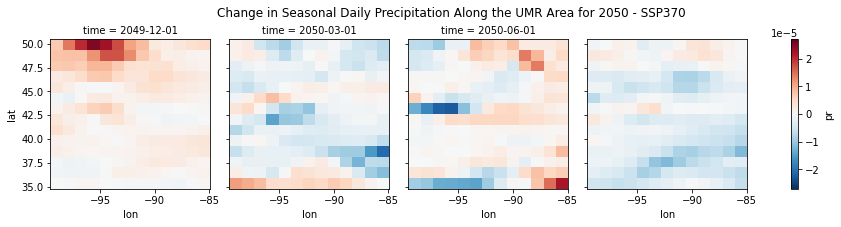

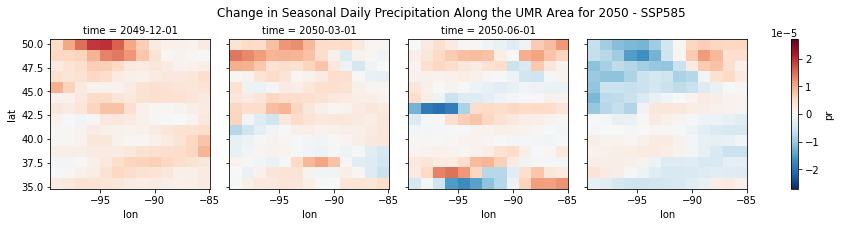

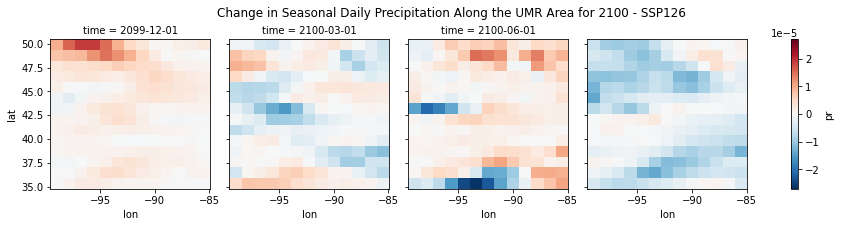

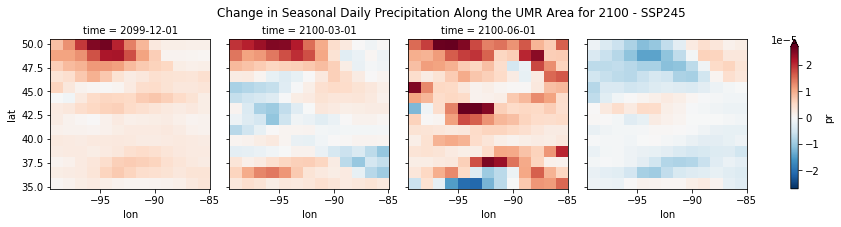

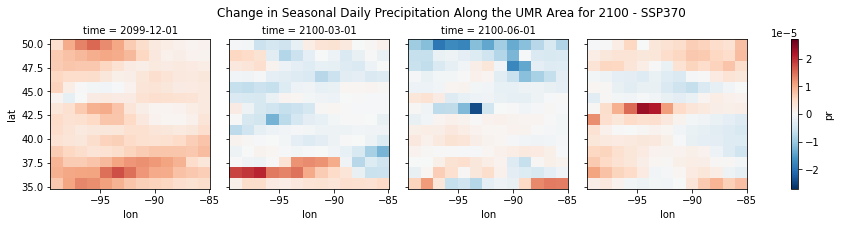

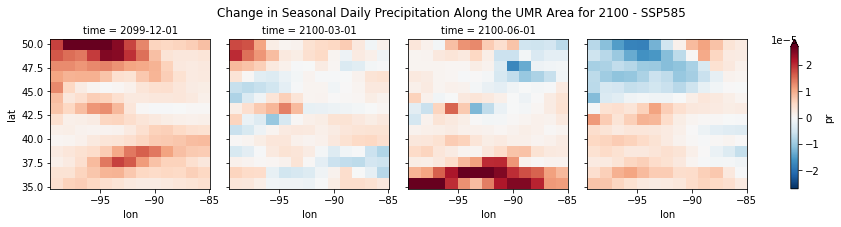

In [45]:
anomaly_s_pr_ssp126_2050.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2050 - SSP126', x = -0.85, y = 1.11)
anomaly_s_pr_ssp245_2050.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2050 - SSP245', x = -0.85, y = 1.11)
anomaly_s_pr_ssp370_2050.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2050 - SSP370', x = -0.85, y = 1.11)
anomaly_s_pr_ssp585_2050.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2050 - SSP585', x = -0.85, y = 1.11)

anomaly_s_pr_ssp126_2100.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2100 - SSP126', x = -0.85, y = 1.11)
anomaly_s_pr_ssp245_2100.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2100 - SSP245', x = -0.85, y = 1.11)
anomaly_s_pr_ssp370_2100.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2100 - SSP370', x = -0.85, y = 1.11)
anomaly_s_pr_ssp585_2100.plot(col = 'time', vmax = 2.7E-05)
plt.title('Change in Seasonal Daily Precipitation Along the UMR Area for 2100 - SSP585', x = -0.85, y = 1.11)

Text(-0.85, 1.11, 'Change in Seasonal Daily Snowfall Along the UMR Area for 2100 - SSP585')

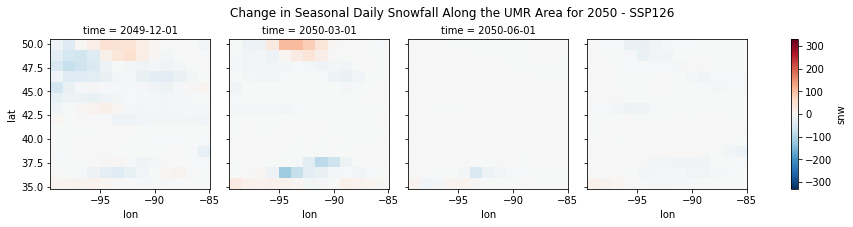

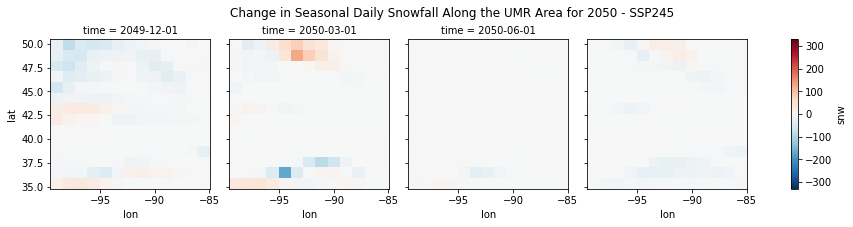

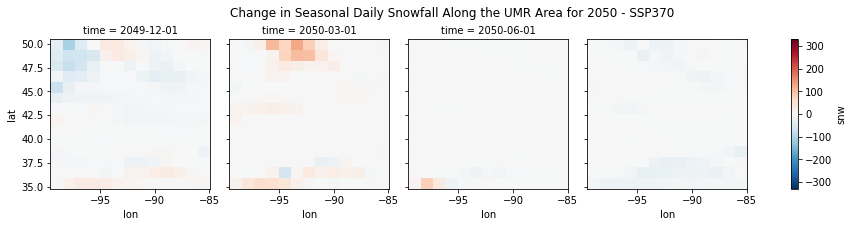

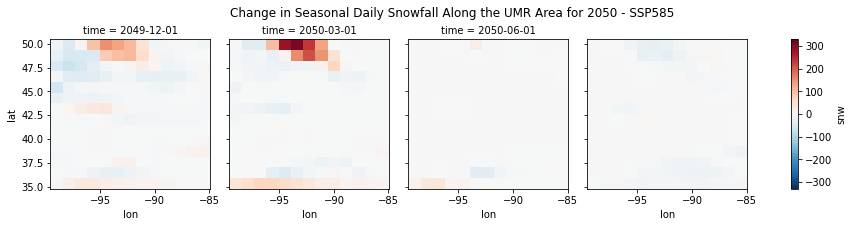

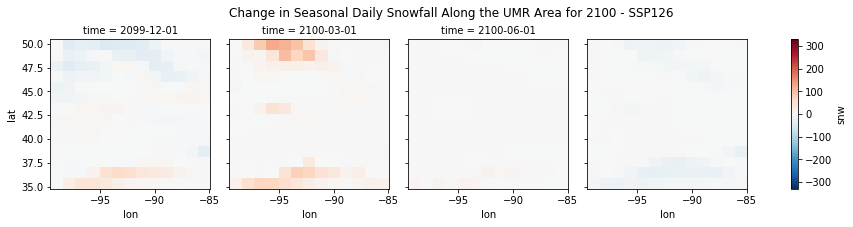

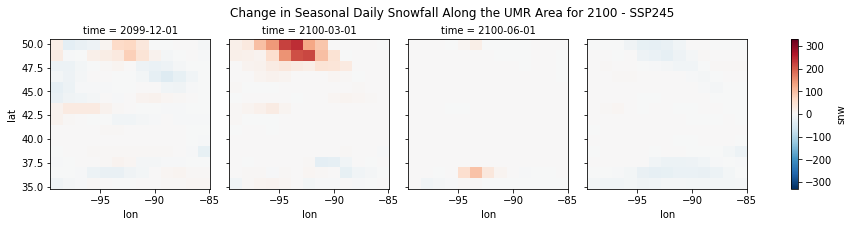

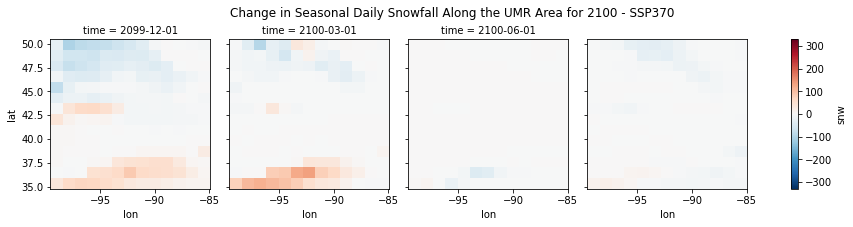

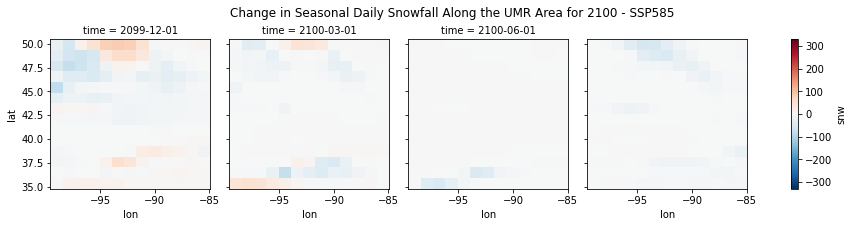

In [46]:
anomaly_s_snw_ssp126_2050.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2050 - SSP126', x = -0.85, y = 1.11)
anomaly_s_snw_ssp245_2050.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2050 - SSP245', x = -0.85, y = 1.11)
anomaly_s_snw_ssp370_2050.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2050 - SSP370', x = -0.85, y = 1.11)
anomaly_s_snw_ssp585_2050.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2050 - SSP585', x = -0.85, y = 1.11)

anomaly_s_snw_ssp126_2100.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2100 - SSP126', x = -0.85, y = 1.11)
anomaly_s_snw_ssp245_2100.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2100 - SSP245', x = -0.85, y = 1.11)
anomaly_s_snw_ssp370_2100.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2100 - SSP370', x = -0.85, y = 1.11)
anomaly_s_snw_ssp585_2100.plot(col = 'time', vmax = 330)
plt.title('Change in Seasonal Daily Snowfall Along the UMR Area for 2100 - SSP585', x = -0.85, y = 1.11)

In [47]:
yearly_seasonal_pr_126 = pr_ssp126.resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
yearly_seasonal_pr_245 = pr_ssp245.resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
yearly_seasonal_pr_370 = pr_ssp370.resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
yearly_seasonal_pr_585 = pr_ssp585.resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])

In [48]:
yearly_seasonal_snw_126 = snw_ssp126.resample(time = 'QS-DEC').mean().mean(['lat', 'lon'])
yearly_seasonal_snw_245 = snw_ssp245.resample(time = 'QS-DEC').mean().mean(['lat', 'lon'])
yearly_seasonal_snw_370 = snw_ssp370.resample(time = 'QS-DEC').mean().mean(['lat', 'lon'])
yearly_seasonal_snw_585 = snw_ssp585.resample(time = 'QS-DEC').mean().mean(['lat', 'lon'])

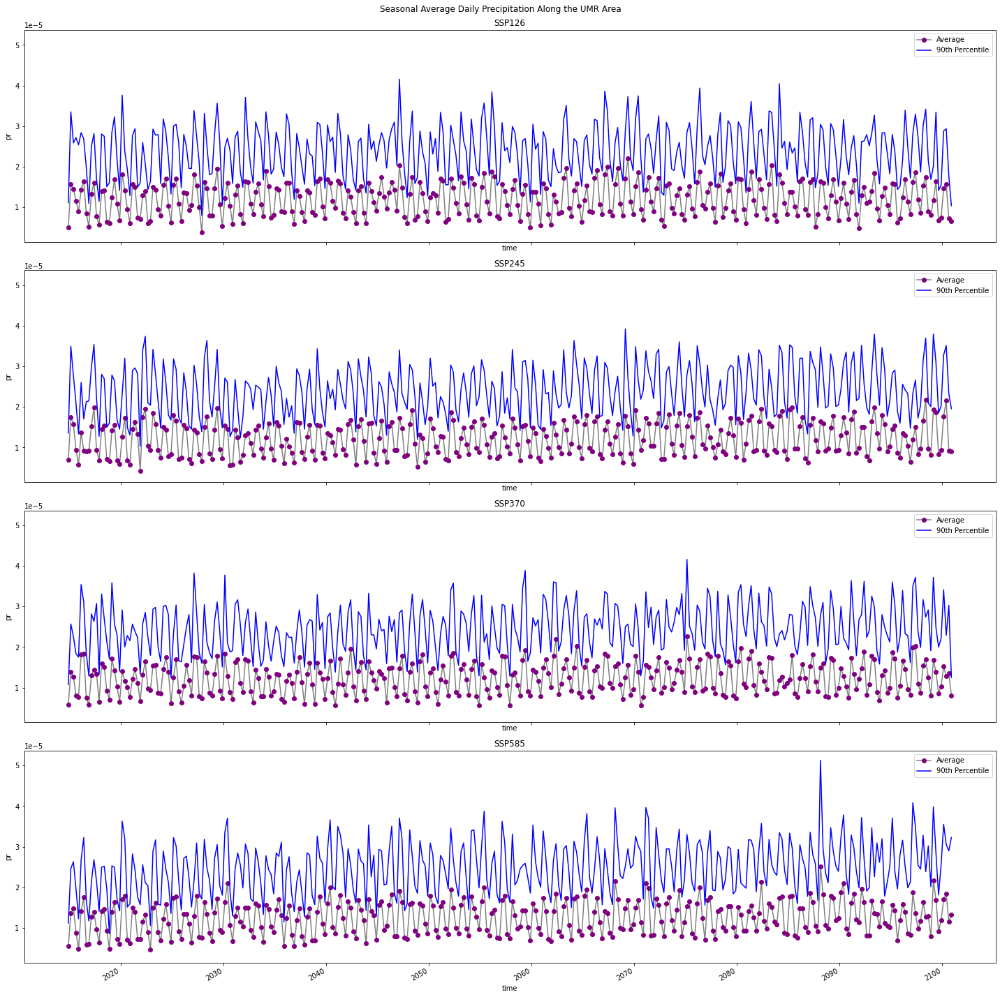

In [49]:
fig, ((ax1, ax2, ax3, ax4)) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)
yearly_seasonal_pr_126['pr'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax1, label = 'Average')
pr_ssp126.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax1, color = 'blue', label = '90th Percentile')
yearly_seasonal_pr_245['pr'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax2, label = 'Average')
pr_ssp245.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax2, color = 'blue', label = '90th Percentile')
yearly_seasonal_pr_370['pr'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax3, label = 'Average')
pr_ssp370.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax3, color = 'blue', label = '90th Percentile')
yearly_seasonal_pr_585['pr'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax4, label = 'Average')
pr_ssp585.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['pr'].plot(ax = ax4, color = 'blue', label = '90th Percentile')
plt.suptitle('Seasonal Average Daily Precipitation Along the UMR Area', y = 0.99)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.tight_layout()
plt.draw()

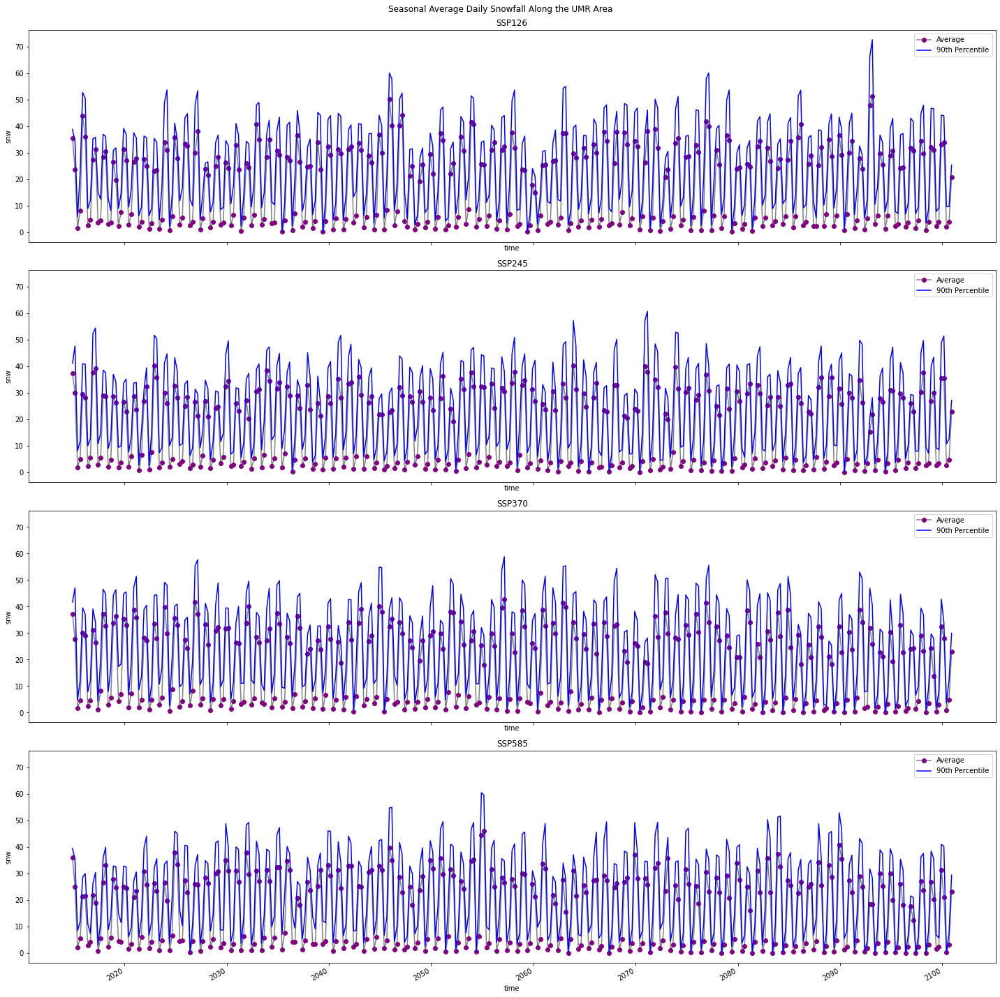

In [50]:
fig, ((ax1, ax2, ax3, ax4)) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)
yearly_seasonal_snw_126['snw'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax1, label = 'Average')
snw_ssp126.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax1, color = 'blue', label = '90th Percentile')
yearly_seasonal_snw_245['snw'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax2, label = 'Average')
snw_ssp245.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax2, color = 'blue', label = '90th Percentile')
yearly_seasonal_snw_370['snw'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax3, label = 'Average')
snw_ssp370.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax3, color = 'blue', label = '90th Percentile')
yearly_seasonal_snw_585['snw'].plot(marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple', ax = ax4, label = 'Average')
snw_ssp585.mean(['lat', 'lon']).resample(time = 'QS-DEC').reduce(np.percentile, dim = 'time', q = 90)['snw'].plot(ax = ax4, color = 'blue', label = '90th Percentile')
plt.suptitle('Seasonal Average Daily Snowfall Along the UMR Area', y = 0.99)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.tight_layout()
plt.draw()

In [51]:
baseline_seasonal_mean_pr_126 = pr_ssp126.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_pr_126 = pr_ssp126.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_pr_ssp126 = []
for i in range(0, len(other_seasonal_mean_pr_126['pr'][:-1]), 4):
    season_group = other_seasonal_mean_pr_126['pr'][i:i+4]
    season_group = [season - baseline_seasonal_mean_pr_126['pr'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_pr_ssp126[i:i+4] = season_group
anomaly_pr_ssp126 = np.array(anomaly_pr_ssp126)

baseline_seasonal_mean_pr_245 = pr_ssp245.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_pr_245 = pr_ssp245.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_pr_ssp245 = []
for i in range(0, len(other_seasonal_mean_pr_245['pr'][:-1]), 4):
    season_group = other_seasonal_mean_pr_245['pr'][i:i+4]
    season_group = [season - baseline_seasonal_mean_pr_245['pr'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_pr_ssp245[i:i+4] = season_group
anomaly_pr_ssp245 = np.array(anomaly_pr_ssp245)

baseline_seasonal_mean_pr_370 = pr_ssp370.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_pr_370 = pr_ssp370.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_pr_ssp370 = []
for i in range(0, len(other_seasonal_mean_pr_370['pr'][:-1]), 4):
    season_group = other_seasonal_mean_pr_370['pr'][i:i+4]
    season_group = [season - baseline_seasonal_mean_pr_370['pr'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_pr_ssp370[i:i+4] = season_group
anomaly_pr_ssp370 = np.array(anomaly_pr_ssp370)

baseline_seasonal_mean_pr_585 = pr_ssp585.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_pr_585 = pr_ssp585.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_pr_ssp585 = []
for i in range(0, len(other_seasonal_mean_pr_585['pr'][:-1]), 4):
    season_group = other_seasonal_mean_pr_585['pr'][i:i+4]
    season_group = [season - baseline_seasonal_mean_pr_585['pr'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_pr_ssp585[i:i+4] = season_group
anomaly_pr_ssp585 = np.array(anomaly_pr_ssp585)

In [52]:
baseline_seasonal_mean_snw_126 = snw_ssp126.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_snw_126 = snw_ssp126.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_snw_ssp126 = []
for i in range(0, len(other_seasonal_mean_snw_126['snw'][:-1]), 4):
    season_group = other_seasonal_mean_snw_126['snw'][i:i+4]
    season_group = [season - baseline_seasonal_mean_snw_126['snw'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_snw_ssp126[i:i+4] = season_group
anomaly_snw_ssp126 = np.array(anomaly_snw_ssp126)

baseline_seasonal_mean_snw_245 = snw_ssp245.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_snw_245 = snw_ssp245.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_snw_ssp245 = []
for i in range(0, len(other_seasonal_mean_snw_245['snw'][:-1]), 4):
    season_group = other_seasonal_mean_snw_245['snw'][i:i+4]
    season_group = [season - baseline_seasonal_mean_snw_245['snw'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_snw_ssp245[i:i+4] = season_group
anomaly_snw_ssp245 = np.array(anomaly_snw_ssp245)

baseline_seasonal_mean_snw_370 = snw_ssp370.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_snw_370 = snw_ssp370.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_snw_ssp370 = []
for i in range(0, len(other_seasonal_mean_snw_370['snw'][:-1]), 4):
    season_group = other_seasonal_mean_snw_370['snw'][i:i+4]
    season_group = [season - baseline_seasonal_mean_snw_370['snw'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_snw_ssp370[i:i+4] = season_group
anomaly_snw_ssp370 = np.array(anomaly_snw_ssp370)

baseline_seasonal_mean_snw_585 = snw_ssp585.sel(time = slice(str(baseline_year) + '-01-01', str(baseline_year) + '-12-31')).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
other_seasonal_mean_snw_585 = snw_ssp585.sel(time = slice(str(baseline_year + 1) + '-01-01', None)).resample(time = 'QS-DEC').mean(dim = 'time').mean(['lat', 'lon'])
anomaly_snw_ssp585 = []
for i in range(0, len(other_seasonal_mean_snw_585['snw'][:-1]), 4):
    season_group = other_seasonal_mean_snw_585['snw'][i:i+4]
    season_group = [season - baseline_seasonal_mean_snw_585['snw'][:-1][j] for j, season in enumerate(season_group)]
    anomaly_snw_ssp585[i:i+4] = season_group
anomaly_snw_ssp585 = np.array(anomaly_snw_ssp585)

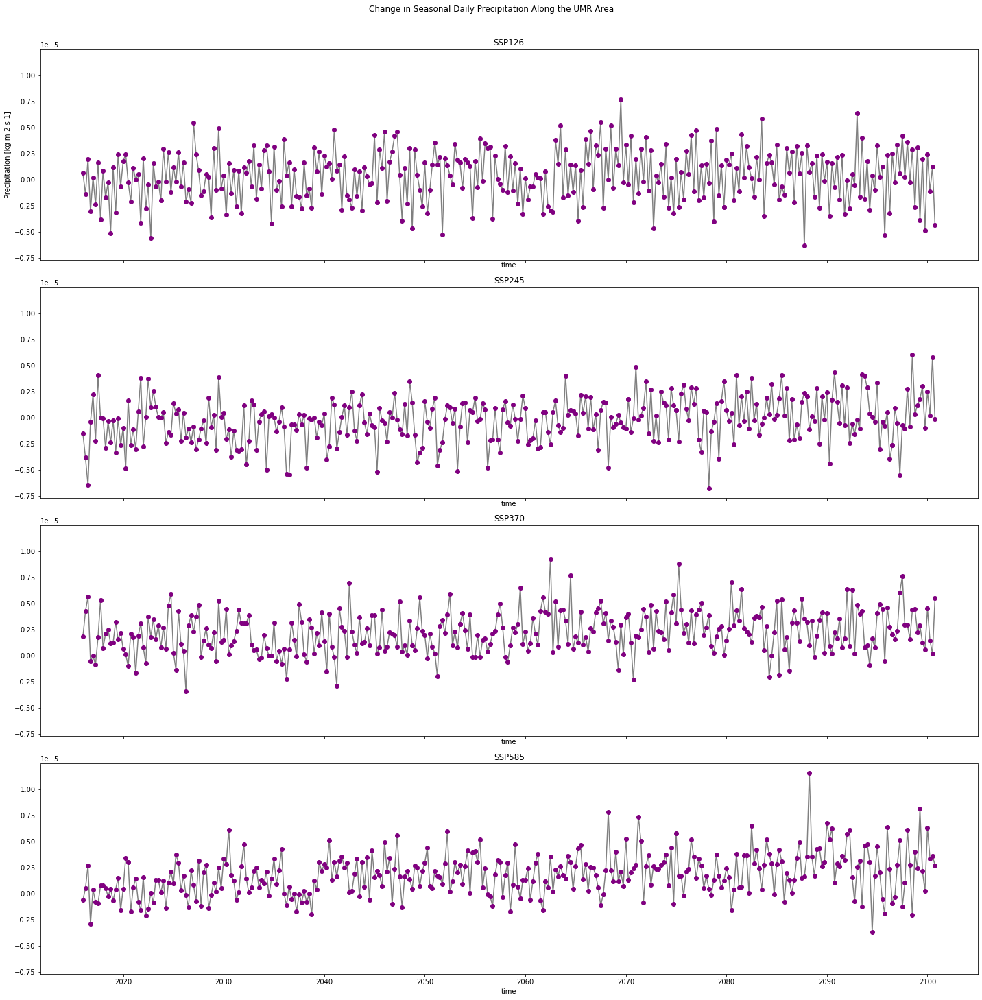

In [53]:
fig, ((ax1, ax2, ax3, ax4)) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)
ax1.plot(anomaly_pr_ssp126, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
ax2.plot(anomaly_pr_ssp245, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
ax3.plot(anomaly_pr_ssp370, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
ax4.plot(anomaly_pr_ssp585, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
plt.suptitle('Change in Seasonal Daily Precipitation Along the UMR Area', y = 1.01)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.set_xlabel('time')
ax2.set_xlabel('time')
ax3.set_xlabel('time')
ax4.set_xlabel('time')
ax1.set_ylabel('Precipitation [kg m-2 s-1]')
ax1.set_ylabel('Precipitation [kg m-2 s-1]')
ax1.set_ylabel('Precipitation [kg m-2 s-1]')
ax1.set_ylabel('Precipitation [kg m-2 s-1]')
ax1.set_xticks([16, 56, 96, 136, 176, 216, 256, 296, 336], [2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090, 2100], rotation = 30)
plt.tight_layout()
plt.draw()

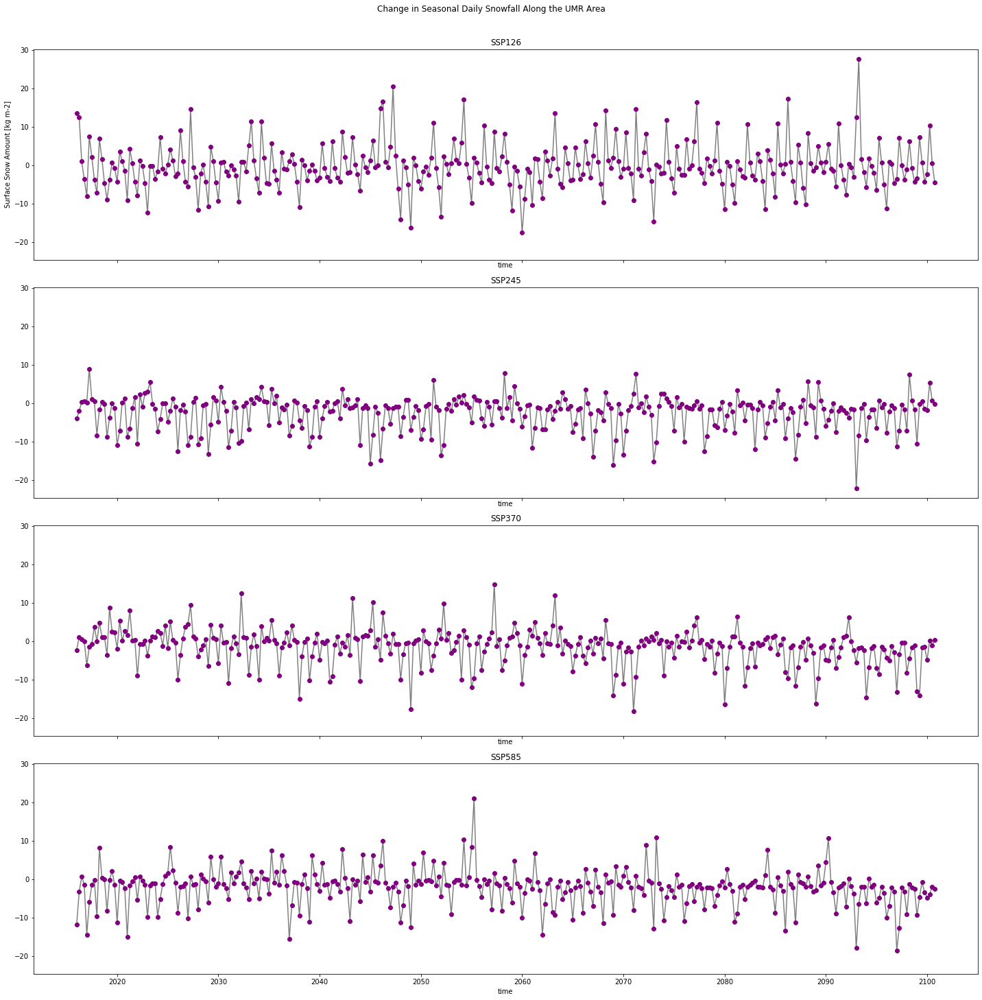

In [54]:
fig, ((ax1, ax2, ax3, ax4)) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)
ax1.plot(anomaly_snw_ssp126, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
ax2.plot(anomaly_snw_ssp245, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
ax3.plot(anomaly_snw_ssp370, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
ax4.plot(anomaly_snw_ssp585, marker = 'o', color = 'grey', markerfacecolor = 'purple', markeredgecolor = 'purple')
plt.suptitle('Change in Seasonal Daily Snowfall Along the UMR Area', y = 1.01)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.set_xlabel('time')
ax2.set_xlabel('time')
ax3.set_xlabel('time')
ax4.set_xlabel('time')
ax1.set_ylabel('Surface Snow Amount [kg m-2]')
ax1.set_ylabel('Surface Snow Amount [kg m-2]')
ax1.set_ylabel('Surface Snow Amount [kg m-2]')
ax1.set_ylabel('Surface Snow Amount [kg m-2]')
ax1.set_xticks([16, 56, 96, 136, 176, 216, 256, 296, 336], [2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090, 2100], rotation = 30)
plt.tight_layout()
plt.draw()

In [55]:
colors = {3: 'pink', 6: 'yellow', 9: 'brown', 12: 'grey'}
seasons = {3: 'spring', 6: 'summer', 9: 'fall', 12: 'winter'}

In [56]:
array_pr_ssp126 = []
array_pr_ssp245 = []
array_pr_ssp370 = []
array_pr_ssp585 = []

for month, arr_pr_ssp126 in pr_ssp126.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_pr_ssp126.append(np.array(arr_pr_ssp126.reduce(np.percentile, dim = 'time', q = 90)['pr']))
subarrays_pr_ssp126 = {'12': array_pr_ssp126[::4], '3': array_pr_ssp126[1::4], '6': array_pr_ssp126[2::4], '9': array_pr_ssp126[3::4]}
pr_ssp126_12 = np.array(subarrays_pr_ssp126['12'])
pr_ssp126_3 = np.array(subarrays_pr_ssp126['3'])
pr_ssp126_6 = np.array(subarrays_pr_ssp126['6'])
pr_ssp126_9 = np.array(subarrays_pr_ssp126['9'])

for month, arr_pr_ssp245 in pr_ssp245.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_pr_ssp245.append(np.array(arr_pr_ssp245.reduce(np.percentile, dim = 'time', q = 90)['pr']))
subarrays_pr_ssp245 = {'12': array_pr_ssp245[::4], '3': array_pr_ssp245[1::4], '6': array_pr_ssp245[2::4], '9': array_pr_ssp245[3::4]}
pr_ssp245_12 = np.array(subarrays_pr_ssp245['12'])
pr_ssp245_3 = np.array(subarrays_pr_ssp245['3'])
pr_ssp245_6 = np.array(subarrays_pr_ssp245['6'])
pr_ssp245_9 = np.array(subarrays_pr_ssp245['9'])

for month, arr_pr_ssp370 in pr_ssp370.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_pr_ssp370.append(np.array(arr_pr_ssp370.reduce(np.percentile, dim = 'time', q = 90)['pr']))
subarrays_pr_ssp370 = {'12': array_pr_ssp370[::4], '3': array_pr_ssp370[1::4], '6': array_pr_ssp370[2::4], '9': array_pr_ssp370[3::4]}
pr_ssp370_12 = np.array(subarrays_pr_ssp370['12'])
pr_ssp370_3 = np.array(subarrays_pr_ssp370['3'])
pr_ssp370_6 = np.array(subarrays_pr_ssp370['6'])
pr_ssp370_9 = np.array(subarrays_pr_ssp370['9'])

for month, arr_pr_ssp585 in pr_ssp585.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_pr_ssp585.append(np.array(arr_pr_ssp585.reduce(np.percentile, dim = 'time', q = 90)['pr']))
subarrays_pr_ssp585 = {'12': array_pr_ssp585[::4], '3': array_pr_ssp585[1::4], '6': array_pr_ssp585[2::4], '9': array_pr_ssp585[3::4]}
pr_ssp585_12 = np.array(subarrays_pr_ssp585['12'])
pr_ssp585_3 = np.array(subarrays_pr_ssp585['3'])
pr_ssp585_6 = np.array(subarrays_pr_ssp585['6'])
pr_ssp585_9 = np.array(subarrays_pr_ssp585['9'])

In [57]:
array_snw_ssp126 = []
array_snw_ssp245 = []
array_snw_ssp370 = []
array_snw_ssp585 = []

for month, arr_snw_ssp126 in snw_ssp126.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_snw_ssp126.append(np.array(arr_snw_ssp126.reduce(np.percentile, dim = 'time', q = 90)['snw']))
subarrays_snw_ssp126 = {'12': array_snw_ssp126[::4], '3': array_snw_ssp126[1::4], '6': array_snw_ssp126[2::4], '9': array_snw_ssp126[3::4]}
snw_ssp126_12 = np.array(subarrays_snw_ssp126['12'])
snw_ssp126_3 = np.array(subarrays_snw_ssp126['3'])
snw_ssp126_6 = np.array(subarrays_snw_ssp126['6'])
snw_ssp126_9 = np.array(subarrays_snw_ssp126['9'])

for month, arr_snw_ssp245 in snw_ssp245.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_snw_ssp245.append(np.array(arr_snw_ssp245.reduce(np.percentile, dim = 'time', q = 90)['snw']))
subarrays_snw_ssp245 = {'12': array_snw_ssp245[::4], '3': array_snw_ssp245[1::4], '6': array_snw_ssp245[2::4], '9': array_snw_ssp245[3::4]}
snw_ssp245_12 = np.array(subarrays_snw_ssp245['12'])
snw_ssp245_3 = np.array(subarrays_snw_ssp245['3'])
snw_ssp245_6 = np.array(subarrays_snw_ssp245['6'])
snw_ssp245_9 = np.array(subarrays_snw_ssp245['9'])

for month, arr_snw_ssp370 in snw_ssp370.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_snw_ssp370.append(np.array(arr_snw_ssp370.reduce(np.percentile, dim = 'time', q = 90)['snw']))
subarrays_snw_ssp370 = {'12': array_snw_ssp370[::4], '3': array_snw_ssp370[1::4], '6': array_snw_ssp370[2::4], '9': array_snw_ssp370[3::4]}
snw_ssp370_12 = np.array(subarrays_snw_ssp370['12'])
snw_ssp370_3 = np.array(subarrays_snw_ssp370['3'])
snw_ssp370_6 = np.array(subarrays_snw_ssp370['6'])
snw_ssp370_9 = np.array(subarrays_snw_ssp370['9'])

for month, arr_snw_ssp585 in snw_ssp585.mean(['lat', 'lon']).resample(time = 'QS-DEC'):
    array_snw_ssp585.append(np.array(arr_snw_ssp585.reduce(np.percentile, dim = 'time', q = 90)['snw']))
subarrays_snw_ssp585 = {'12': array_snw_ssp585[::4], '3': array_snw_ssp585[1::4], '6': array_snw_ssp585[2::4], '9': array_snw_ssp585[3::4]}
snw_ssp585_12 = np.array(subarrays_snw_ssp585['12'])
snw_ssp585_3 = np.array(subarrays_snw_ssp585['3'])
snw_ssp585_6 = np.array(subarrays_snw_ssp585['6'])
snw_ssp585_9 = np.array(subarrays_snw_ssp585['9'])

In [58]:
time = np.array(['2014-12-01T00:00:00.000000000', '2015-12-01T00:00:00.000000000',
       '2016-12-01T00:00:00.000000000', '2017-12-01T00:00:00.000000000',
       '2018-12-01T00:00:00.000000000', '2019-12-01T00:00:00.000000000',
       '2020-12-01T00:00:00.000000000', '2021-12-01T00:00:00.000000000',
       '2022-12-01T00:00:00.000000000', '2023-12-01T00:00:00.000000000',
       '2024-12-01T00:00:00.000000000', '2025-12-01T00:00:00.000000000',
       '2026-12-01T00:00:00.000000000', '2027-12-01T00:00:00.000000000',
       '2028-12-01T00:00:00.000000000', '2029-12-01T00:00:00.000000000',
       '2030-12-01T00:00:00.000000000', '2031-12-01T00:00:00.000000000',
       '2032-12-01T00:00:00.000000000', '2033-12-01T00:00:00.000000000',
       '2034-12-01T00:00:00.000000000', '2035-12-01T00:00:00.000000000',
       '2036-12-01T00:00:00.000000000', '2037-12-01T00:00:00.000000000',
       '2038-12-01T00:00:00.000000000', '2039-12-01T00:00:00.000000000',
       '2040-12-01T00:00:00.000000000', '2041-12-01T00:00:00.000000000',
       '2042-12-01T00:00:00.000000000', '2043-12-01T00:00:00.000000000',
       '2044-12-01T00:00:00.000000000', '2045-12-01T00:00:00.000000000',
       '2046-12-01T00:00:00.000000000', '2047-12-01T00:00:00.000000000',
       '2048-12-01T00:00:00.000000000', '2049-12-01T00:00:00.000000000',
       '2050-12-01T00:00:00.000000000', '2051-12-01T00:00:00.000000000',
       '2052-12-01T00:00:00.000000000', '2053-12-01T00:00:00.000000000',
       '2054-12-01T00:00:00.000000000', '2055-12-01T00:00:00.000000000',
       '2056-12-01T00:00:00.000000000', '2057-12-01T00:00:00.000000000',
       '2058-12-01T00:00:00.000000000', '2059-12-01T00:00:00.000000000',
       '2060-12-01T00:00:00.000000000', '2061-12-01T00:00:00.000000000',
       '2062-12-01T00:00:00.000000000', '2063-12-01T00:00:00.000000000',
       '2064-12-01T00:00:00.000000000', '2065-12-01T00:00:00.000000000',
       '2066-12-01T00:00:00.000000000', '2067-12-01T00:00:00.000000000',
       '2068-12-01T00:00:00.000000000', '2069-12-01T00:00:00.000000000',
       '2070-12-01T00:00:00.000000000', '2071-12-01T00:00:00.000000000',
       '2072-12-01T00:00:00.000000000', '2073-12-01T00:00:00.000000000',
       '2074-12-01T00:00:00.000000000', '2075-12-01T00:00:00.000000000',
       '2076-12-01T00:00:00.000000000', '2077-12-01T00:00:00.000000000',
       '2078-12-01T00:00:00.000000000', '2079-12-01T00:00:00.000000000',
       '2080-12-01T00:00:00.000000000', '2081-12-01T00:00:00.000000000',
       '2082-12-01T00:00:00.000000000', '2083-12-01T00:00:00.000000000',
       '2084-12-01T00:00:00.000000000', '2085-12-01T00:00:00.000000000',
       '2086-12-01T00:00:00.000000000', '2087-12-01T00:00:00.000000000',
       '2088-12-01T00:00:00.000000000', '2089-12-01T00:00:00.000000000',
       '2090-12-01T00:00:00.000000000', '2091-12-01T00:00:00.000000000',
       '2092-12-01T00:00:00.000000000', '2093-12-01T00:00:00.000000000',
       '2094-12-01T00:00:00.000000000', '2095-12-01T00:00:00.000000000',
       '2096-12-01T00:00:00.000000000', '2097-12-01T00:00:00.000000000',
       '2098-12-01T00:00:00.000000000', '2099-12-01T00:00:00.000000000'],
      dtype='datetime64[ns]')

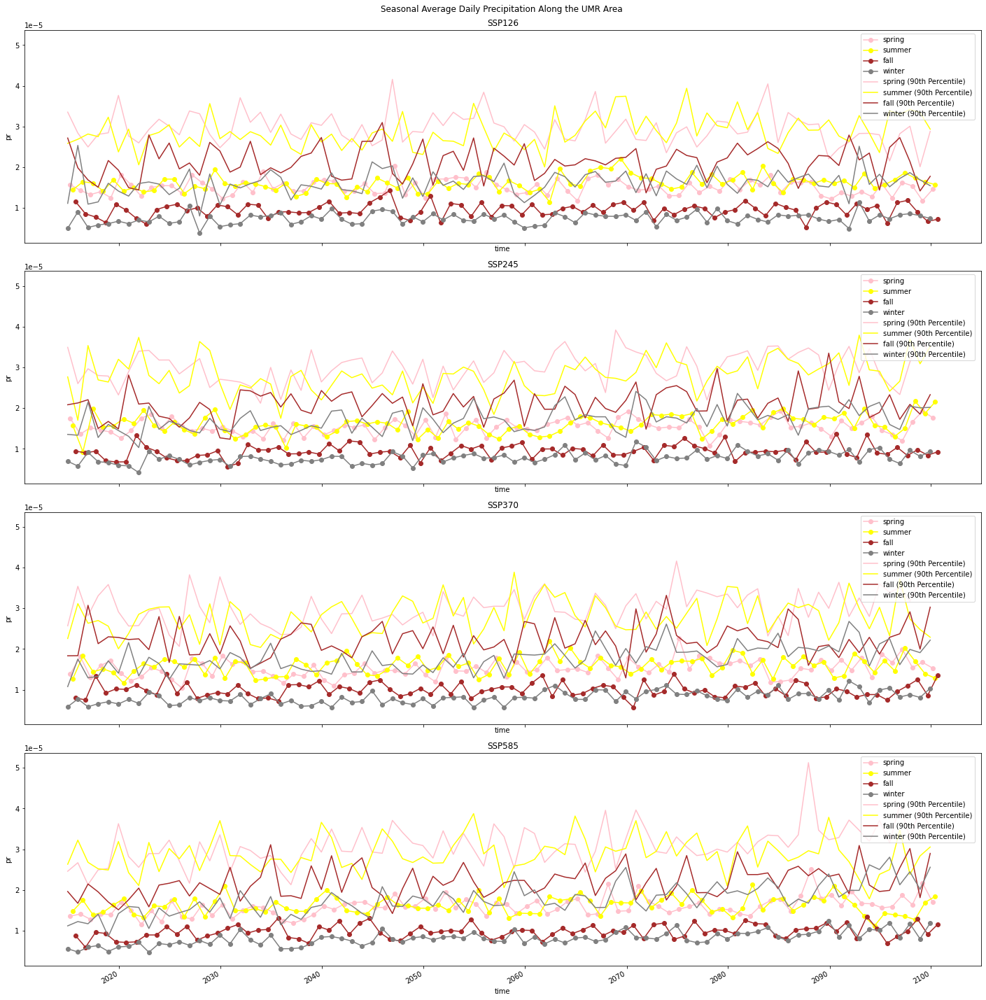

In [59]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)
for month, arr in yearly_seasonal_pr_126['pr'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax1)
ax1.plot(time, pr_ssp126_3, color = 'pink', label = 'spring (90th Percentile)')
ax1.plot(time, pr_ssp126_6, color = 'yellow', label = 'summer (90th Percentile)')
ax1.plot(time, pr_ssp126_9, color = 'brown', label = 'fall (90th Percentile)')
ax1.plot(time, pr_ssp126_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
for month, arr in yearly_seasonal_pr_245['pr'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax2)
ax2.plot(time, pr_ssp245_3, color = 'pink', label = 'spring (90th Percentile)')
ax2.plot(time, pr_ssp245_6, color = 'yellow', label = 'summer (90th Percentile)')
ax2.plot(time, pr_ssp245_9, color = 'brown', label = 'fall (90th Percentile)')
ax2.plot(time, pr_ssp245_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
for month, arr in yearly_seasonal_pr_370['pr'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax3)
ax3.plot(time, pr_ssp370_3, color = 'pink', label = 'spring (90th Percentile)')
ax3.plot(time, pr_ssp370_6, color = 'yellow', label = 'summer (90th Percentile)')
ax3.plot(time, pr_ssp370_9, color = 'brown', label = 'fall (90th Percentile)')
ax3.plot(time, pr_ssp370_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
for month, arr in yearly_seasonal_pr_585['pr'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax4)
ax4.plot(time, pr_ssp585_3, color = 'pink', label = 'spring (90th Percentile)')
ax4.plot(time, pr_ssp585_6, color = 'yellow', label = 'summer (90th Percentile)')
ax4.plot(time, pr_ssp585_9, color = 'brown', label = 'fall (90th Percentile)')
ax4.plot(time, pr_ssp585_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
plt.suptitle('Seasonal Average Daily Precipitation Along the UMR Area', y = 0.99)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
ax2.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
ax3.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
ax4.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
plt.tight_layout()
plt.draw()

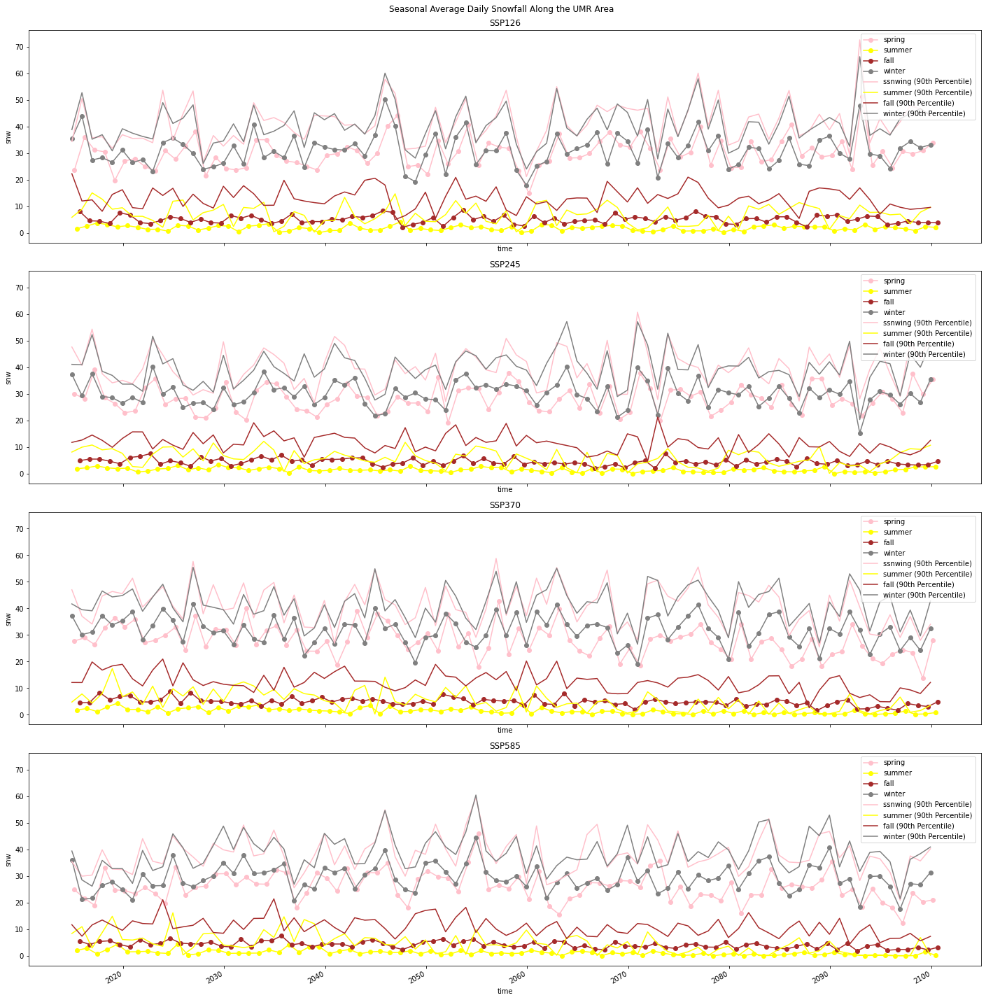

In [60]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)
for month, arr in yearly_seasonal_snw_126['snw'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax1)
ax1.plot(time, snw_ssp126_3, color = 'pink', label = 'ssnwing (90th Percentile)')
ax1.plot(time, snw_ssp126_6, color = 'yellow', label = 'summer (90th Percentile)')
ax1.plot(time, snw_ssp126_9, color = 'brown', label = 'fall (90th Percentile)')
ax1.plot(time, snw_ssp126_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
for month, arr in yearly_seasonal_snw_245['snw'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax2)
ax2.plot(time, snw_ssp245_3, color = 'pink', label = 'ssnwing (90th Percentile)')
ax2.plot(time, snw_ssp245_6, color = 'yellow', label = 'summer (90th Percentile)')
ax2.plot(time, snw_ssp245_9, color = 'brown', label = 'fall (90th Percentile)')
ax2.plot(time, snw_ssp245_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
for month, arr in yearly_seasonal_snw_370['snw'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax3)
ax3.plot(time, snw_ssp370_3, color = 'pink', label = 'ssnwing (90th Percentile)')
ax3.plot(time, snw_ssp370_6, color = 'yellow', label = 'summer (90th Percentile)')
ax3.plot(time, snw_ssp370_9, color = 'brown', label = 'fall (90th Percentile)')
ax3.plot(time, snw_ssp370_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
for month, arr in yearly_seasonal_snw_585['snw'][:-1].groupby('time.month'):
    arr.plot(color = colors[month], marker = 'o', markerfacecolor = colors[month], markeredgecolor = colors[month], label = seasons[month], ax = ax4)
ax4.plot(time, snw_ssp585_3, color = 'pink', label = 'ssnwing (90th Percentile)')
ax4.plot(time, snw_ssp585_6, color = 'yellow', label = 'summer (90th Percentile)')
ax4.plot(time, snw_ssp585_9, color = 'brown', label = 'fall (90th Percentile)')
ax4.plot(time, snw_ssp585_12[:-1], color = 'grey', label = 'winter (90th Percentile)')
plt.suptitle('Seasonal Average Daily Snowfall Along the UMR Area', y = 0.99)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
ax2.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
ax3.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
ax4.legend(bbox_to_anchor = (0.87, 1), loc = 'upper left')
plt.tight_layout()
plt.draw()

In [61]:
subarrays_pr_ssp126 = {'DJF': anomaly_pr_ssp126[::4], 'MAM': anomaly_pr_ssp126[1::4], 'JJA': anomaly_pr_ssp126[2::4], 'SON': anomaly_pr_ssp126[3::4]}
subarrays_pr_ssp245 = {'DJF': anomaly_pr_ssp245[::4], 'MAM': anomaly_pr_ssp245[1::4], 'JJA': anomaly_pr_ssp245[2::4], 'SON': anomaly_pr_ssp245[3::4]}
subarrays_pr_ssp370 = {'DJF': anomaly_pr_ssp370[::4], 'MAM': anomaly_pr_ssp370[1::4], 'JJA': anomaly_pr_ssp370[2::4], 'SON': anomaly_pr_ssp370[3::4]}
subarrays_pr_ssp585 = {'DJF': anomaly_pr_ssp585[::4], 'MAM': anomaly_pr_ssp585[1::4], 'JJA': anomaly_pr_ssp585[2::4], 'SON': anomaly_pr_ssp585[3::4]}

pr_ssp126_DJF = subarrays_pr_ssp126['DJF']
pr_ssp126_MAM = subarrays_pr_ssp126['MAM']
pr_ssp126_JJA = subarrays_pr_ssp126['JJA']
pr_ssp126_SON = subarrays_pr_ssp126['SON']

pr_ssp245_DJF = subarrays_pr_ssp245['DJF']
pr_ssp245_MAM = subarrays_pr_ssp245['MAM']
pr_ssp245_JJA = subarrays_pr_ssp245['JJA']
pr_ssp245_SON = subarrays_pr_ssp245['SON']

pr_ssp370_DJF = subarrays_pr_ssp370['DJF']
pr_ssp370_MAM = subarrays_pr_ssp370['MAM']
pr_ssp370_JJA = subarrays_pr_ssp370['JJA']
pr_ssp370_SON = subarrays_pr_ssp370['SON']

pr_ssp585_DJF = subarrays_pr_ssp585['DJF']
pr_ssp585_MAM = subarrays_pr_ssp585['MAM']
pr_ssp585_JJA = subarrays_pr_ssp585['JJA']
pr_ssp585_SON = subarrays_pr_ssp585['SON']

In [62]:
subarrays_snw_ssp126 = {'DJF': anomaly_snw_ssp126[::4], 'MAM': anomaly_snw_ssp126[1::4], 'JJA': anomaly_snw_ssp126[2::4], 'SON': anomaly_snw_ssp126[3::4]}
subarrays_snw_ssp245 = {'DJF': anomaly_snw_ssp245[::4], 'MAM': anomaly_snw_ssp245[1::4], 'JJA': anomaly_snw_ssp245[2::4], 'SON': anomaly_snw_ssp245[3::4]}
subarrays_snw_ssp370 = {'DJF': anomaly_snw_ssp370[::4], 'MAM': anomaly_snw_ssp370[1::4], 'JJA': anomaly_snw_ssp370[2::4], 'SON': anomaly_snw_ssp370[3::4]}
subarrays_snw_ssp585 = {'DJF': anomaly_snw_ssp585[::4], 'MAM': anomaly_snw_ssp585[1::4], 'JJA': anomaly_snw_ssp585[2::4], 'SON': anomaly_snw_ssp585[3::4]}

snw_ssp126_DJF = subarrays_snw_ssp126['DJF']
snw_ssp126_MAM = subarrays_snw_ssp126['MAM']
snw_ssp126_JJA = subarrays_snw_ssp126['JJA']
snw_ssp126_SON = subarrays_snw_ssp126['SON']

snw_ssp245_DJF = subarrays_snw_ssp245['DJF']
snw_ssp245_MAM = subarrays_snw_ssp245['MAM']
snw_ssp245_JJA = subarrays_snw_ssp245['JJA']
snw_ssp245_SON = subarrays_snw_ssp245['SON']

snw_ssp370_DJF = subarrays_snw_ssp370['DJF']
snw_ssp370_MAM = subarrays_snw_ssp370['MAM']
snw_ssp370_JJA = subarrays_snw_ssp370['JJA']
snw_ssp370_SON = subarrays_snw_ssp370['SON']

snw_ssp585_DJF = subarrays_snw_ssp585['DJF']
snw_ssp585_MAM = subarrays_snw_ssp585['MAM']
snw_ssp585_JJA = subarrays_snw_ssp585['JJA']
snw_ssp585_SON = subarrays_snw_ssp585['SON']

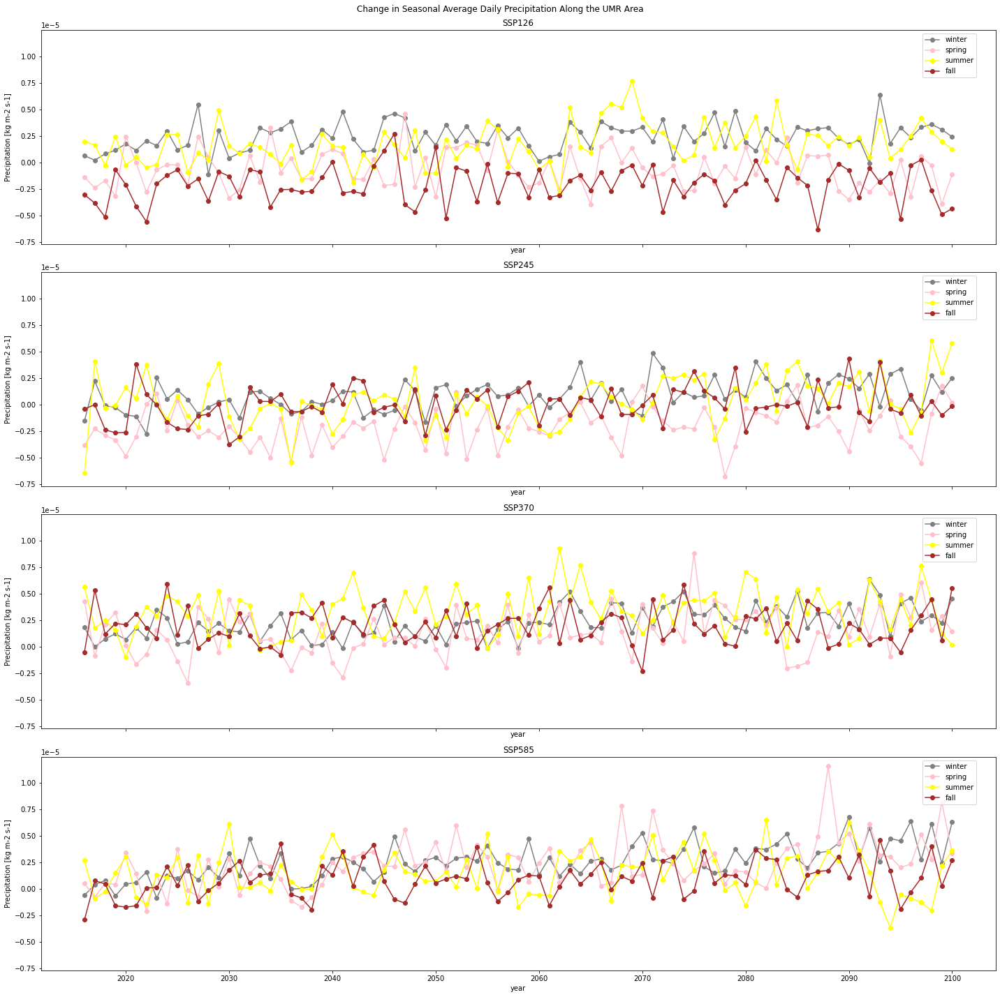

In [63]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)

ax1.plot(pr_ssp126_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax1.plot(pr_ssp126_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'spring')
ax1.plot(pr_ssp126_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax1.plot(pr_ssp126_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
ax2.plot(pr_ssp245_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax2.plot(pr_ssp245_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'spring')
ax2.plot(pr_ssp245_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax2.plot(pr_ssp245_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
ax3.plot(pr_ssp370_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax3.plot(pr_ssp370_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'spring')
ax3.plot(pr_ssp370_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax3.plot(pr_ssp370_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
ax4.plot(pr_ssp585_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax4.plot(pr_ssp585_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'spring')
ax4.plot(pr_ssp585_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax4.plot(pr_ssp585_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
plt.suptitle('Change in Seasonal Average Daily Precipitation Along the UMR Area', y = 0.99)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.set_xticks([4, 14, 24, 34, 44, 54, 64, 74, 84], [2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090, 2100], rotation = 30)
ax1.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax2.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax3.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax4.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax1.set_xlabel('year')
ax2.set_xlabel('year')
ax3.set_xlabel('year')
ax4.set_xlabel('year')
ax1.set_ylabel('Precipitation [kg m-2 s-1]')
ax2.set_ylabel('Precipitation [kg m-2 s-1]')
ax3.set_ylabel('Precipitation [kg m-2 s-1]')
ax4.set_ylabel('Precipitation [kg m-2 s-1]')
plt.tight_layout()
plt.draw()

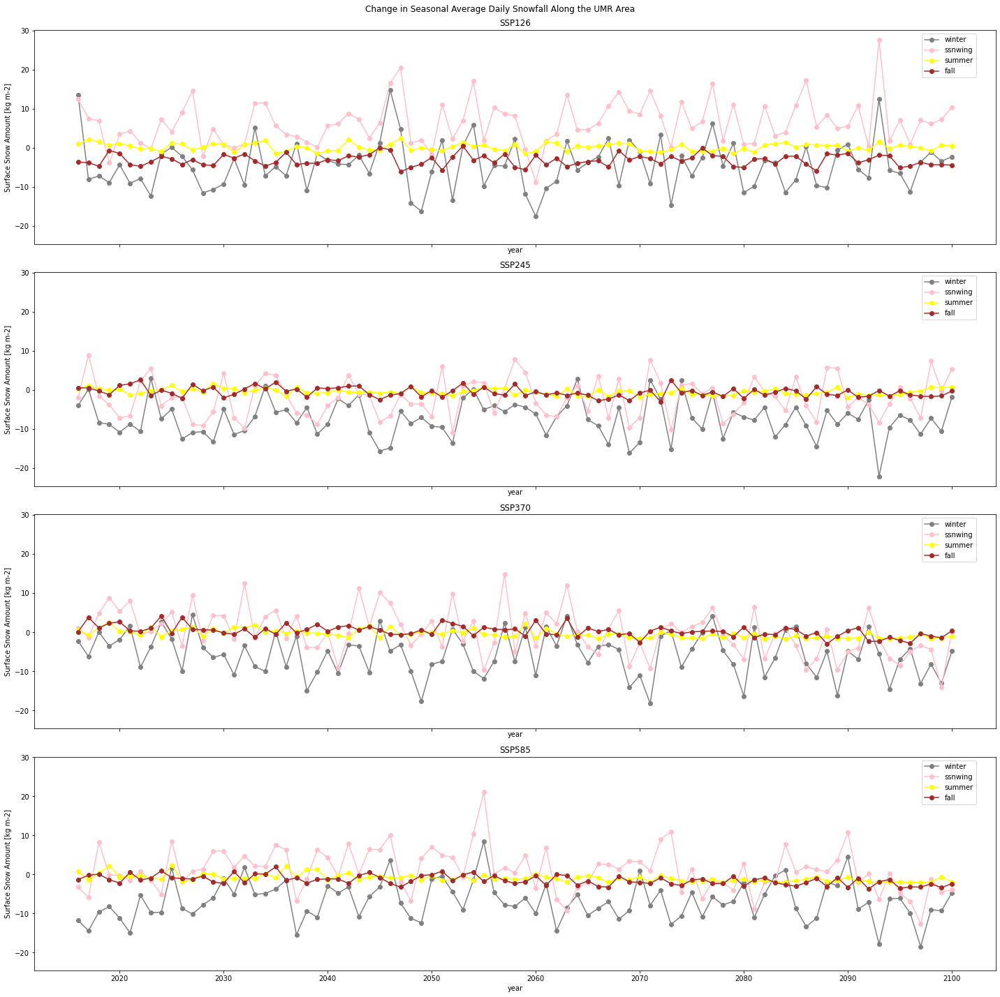

In [64]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (20, 20), sharex = True, sharey = True)

ax1.plot(snw_ssp126_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax1.plot(snw_ssp126_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'ssnwing')
ax1.plot(snw_ssp126_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax1.plot(snw_ssp126_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
ax2.plot(snw_ssp245_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax2.plot(snw_ssp245_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'ssnwing')
ax2.plot(snw_ssp245_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax2.plot(snw_ssp245_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
ax3.plot(snw_ssp370_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax3.plot(snw_ssp370_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'ssnwing')
ax3.plot(snw_ssp370_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax3.plot(snw_ssp370_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
ax4.plot(snw_ssp585_DJF, marker = 'o', color = 'grey', markerfacecolor = 'grey', markeredgecolor = 'grey', label = 'winter')
ax4.plot(snw_ssp585_MAM, marker = 'o', color = 'pink', markerfacecolor = 'pink', markeredgecolor = 'pink', label = 'ssnwing')
ax4.plot(snw_ssp585_JJA, marker = 'o', color = 'yellow', markerfacecolor = 'yellow', markeredgecolor = 'yellow', label = 'summer')
ax4.plot(snw_ssp585_SON, marker = 'o', color = 'brown', markerfacecolor = 'brown', markeredgecolor = 'brown', label = 'fall')
plt.suptitle('Change in Seasonal Average Daily Snowfall Along the UMR Area', y = 0.99)
ax1.set_title('SSP126')
ax2.set_title('SSP245')
ax3.set_title('SSP370')
ax4.set_title('SSP585')
ax1.set_xticks([4, 14, 24, 34, 44, 54, 64, 74, 84], [2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090, 2100], rotation = 30)
ax1.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax2.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax3.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax4.legend(bbox_to_anchor = (0.92, 1), loc = 'upper left')
ax1.set_xlabel('year')
ax2.set_xlabel('year')
ax3.set_xlabel('year')
ax4.set_xlabel('year')
ax1.set_ylabel('Surface Snow Amount [kg m-2]')
ax2.set_ylabel('Surface Snow Amount [kg m-2]')
ax3.set_ylabel('Surface Snow Amount [kg m-2]')
ax4.set_ylabel('Surface Snow Amount [kg m-2]')
plt.tight_layout()
plt.draw()

In [65]:
monthly_average_pr_ssp126 = pr_ssp126.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])
monthly_average_pr_ssp245 = pr_ssp245.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])
monthly_average_pr_ssp370 = pr_ssp370.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])
monthly_average_pr_ssp585 = pr_ssp585.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])

In [66]:
monthly_average_snw_ssp126 = snw_ssp126.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])
monthly_average_snw_ssp245 = snw_ssp245.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])
monthly_average_snw_ssp370 = snw_ssp370.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])
monthly_average_snw_ssp585 = snw_ssp585.resample(time = '1MS').mean(dim = 'time').mean(['lat', 'lon'])

In [67]:
bins_pr = np.linspace(0, max(monthly_average_pr_ssp126['pr'].max(), monthly_average_pr_ssp245['pr'].max(), monthly_average_pr_ssp370['pr'].max(), monthly_average_pr_ssp585['pr'].max()), 50)
bins_snw = np.linspace(0, max(monthly_average_snw_ssp126['snw'].max(), monthly_average_snw_ssp245['snw'].max(), monthly_average_snw_ssp370['snw'].max(), monthly_average_snw_ssp585['snw'].max()), 50)

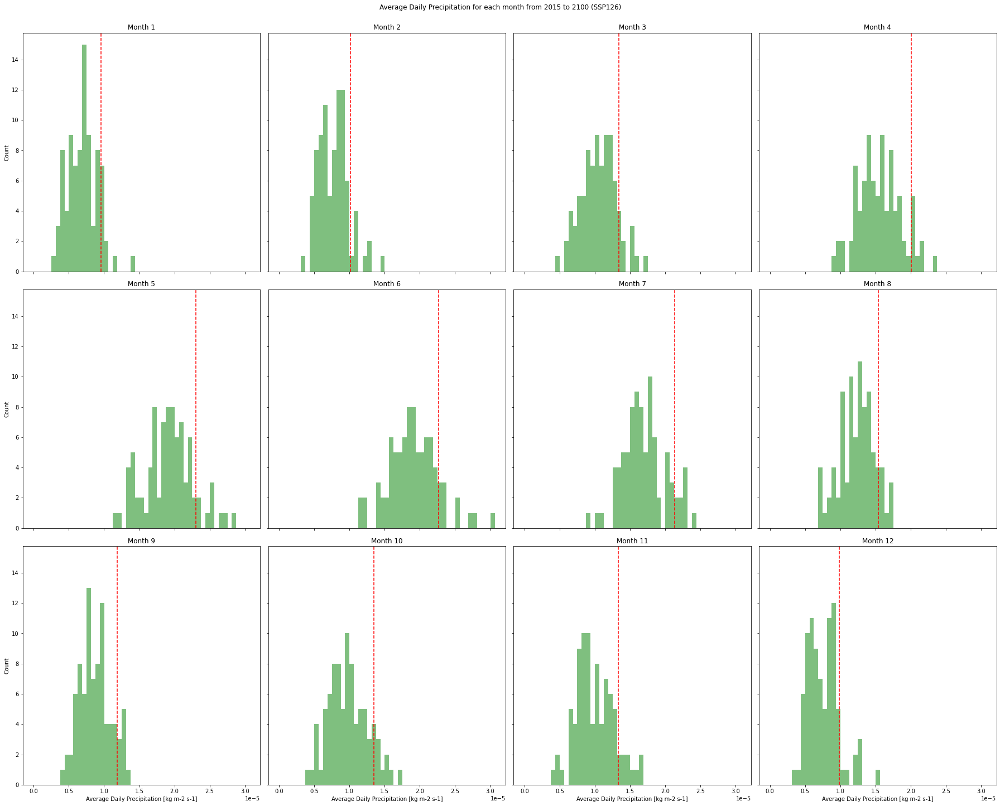

In [68]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_pr_ssp126 = monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == month, drop = True)
    ax.hist(precip_month_pr_ssp126['pr'].values.flatten(), color = 'green', bins = bins_pr, alpha = 0.5, label = 'SSP126')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_pr_ssp126['pr'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Precipitation [kg m-2 s-1]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Precipitation for each month from 2015 to 2100 (SSP126)', y = 1.001)
plt.tight_layout()
plt.draw()

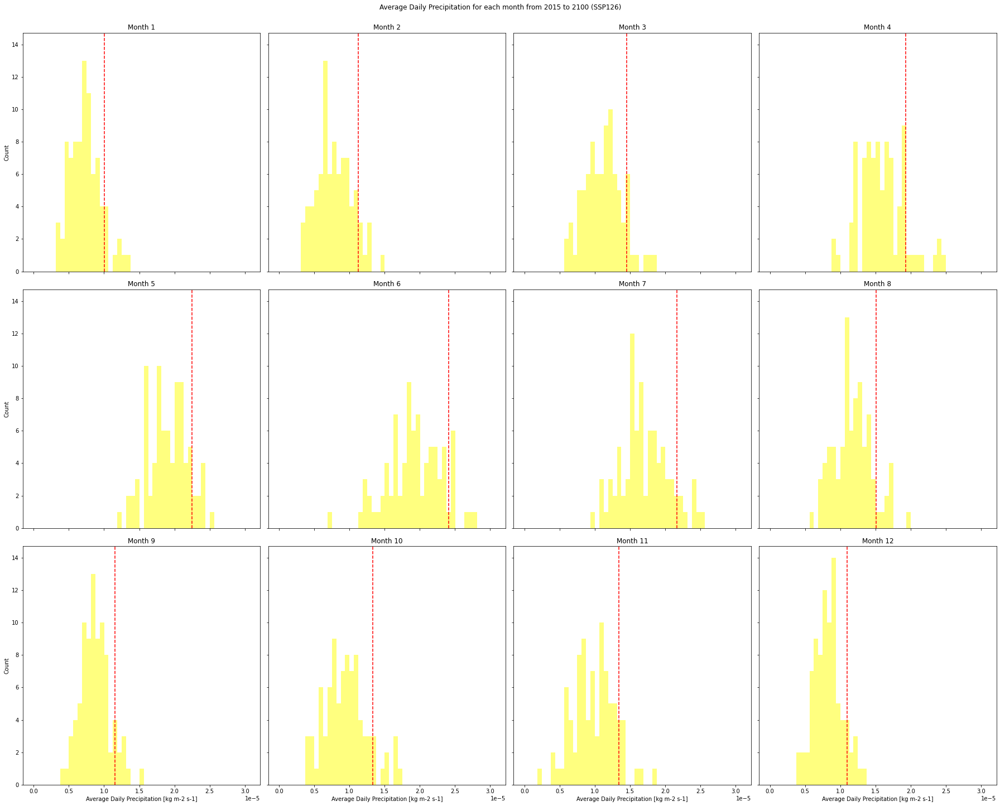

In [69]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_pr_ssp245 = monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == month, drop = True)
    ax.hist(precip_month_pr_ssp245['pr'].values.flatten(), color = 'yellow', bins = bins_pr, alpha = 0.5, label = 'SSP245')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_pr_ssp245['pr'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Precipitation [kg m-2 s-1]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Precipitation for each month from 2015 to 2100 (SSP126)', y = 1.001)
plt.tight_layout()
plt.draw()

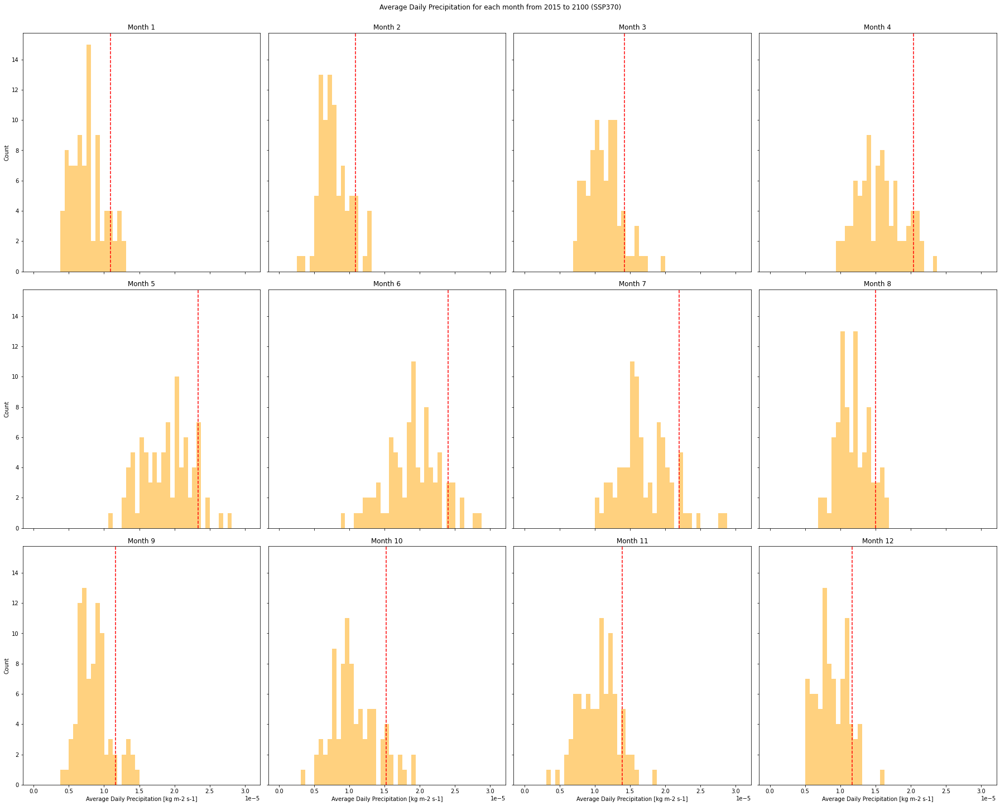

In [70]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_pr_ssp370 = monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == month, drop = True)
    ax.hist(precip_month_pr_ssp370['pr'].values.flatten(), color = 'orange', bins = bins_pr, alpha = 0.5, label = 'SSP370')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_pr_ssp370['pr'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Precipitation [kg m-2 s-1]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Precipitation for each month from 2015 to 2100 (SSP370)', y = 1.001)
plt.tight_layout()
plt.draw()

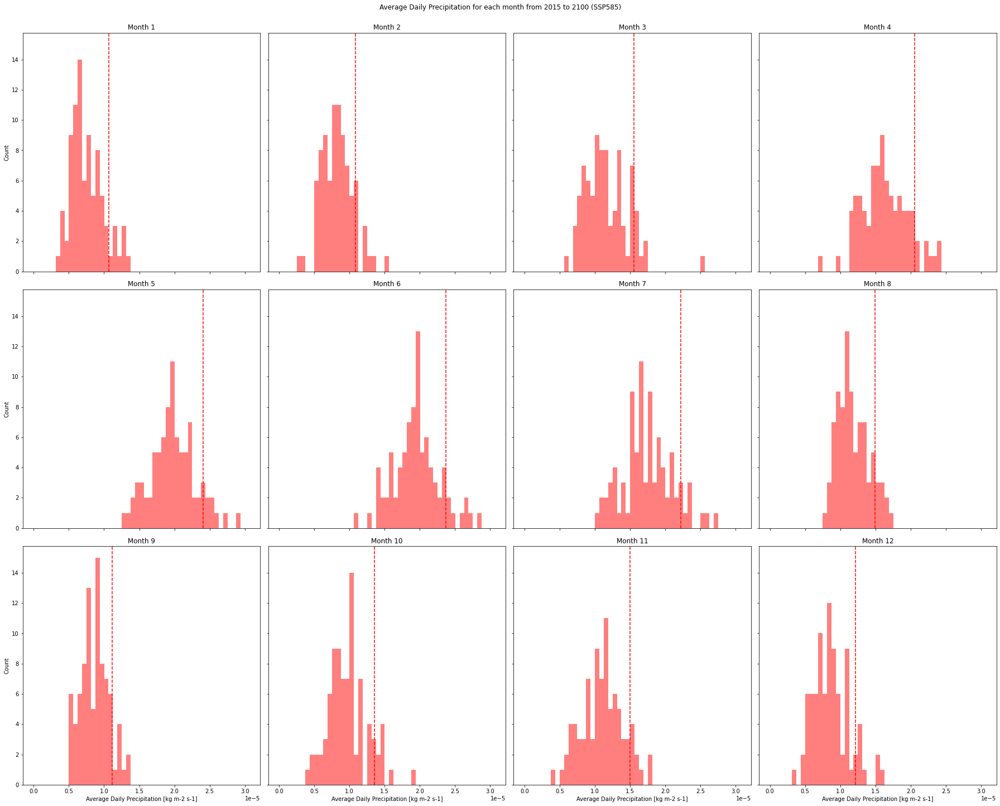

In [71]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_pr_ssp585 = monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == month, drop = True)
    ax.hist(precip_month_pr_ssp585['pr'].values.flatten(), color = 'red', bins = bins_pr, alpha = 0.5, label = 'SSP585')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_pr_ssp585['pr'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Precipitation [kg m-2 s-1]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Precipitation for each month from 2015 to 2100 (SSP585)', y = 1.001)
plt.tight_layout()
plt.draw()

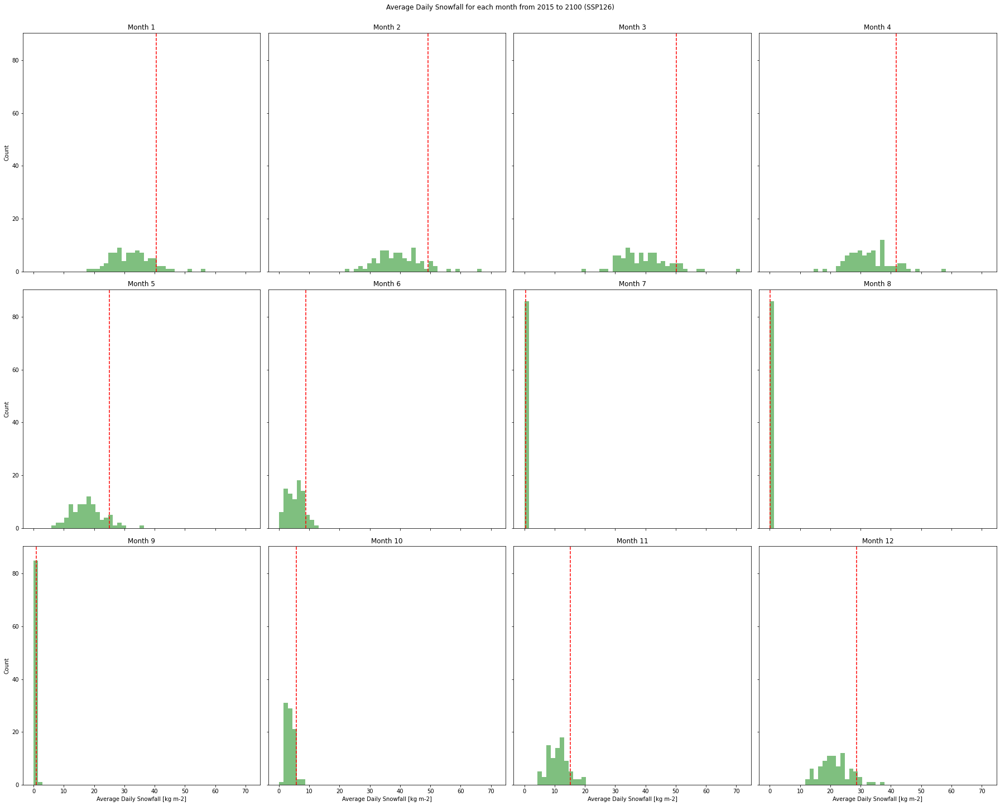

In [72]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_snw_ssp126 = monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == month, drop = True)
    ax.hist(precip_month_snw_ssp126['snw'].values.flatten(), color = 'green', bins = bins_snw, alpha = 0.5, label = 'SSP126')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_snw_ssp126['snw'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Snowfall [kg m-2]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Snowfall for each month from 2015 to 2100 (SSP126)', y = 1.001)
plt.tight_layout()
plt.draw()

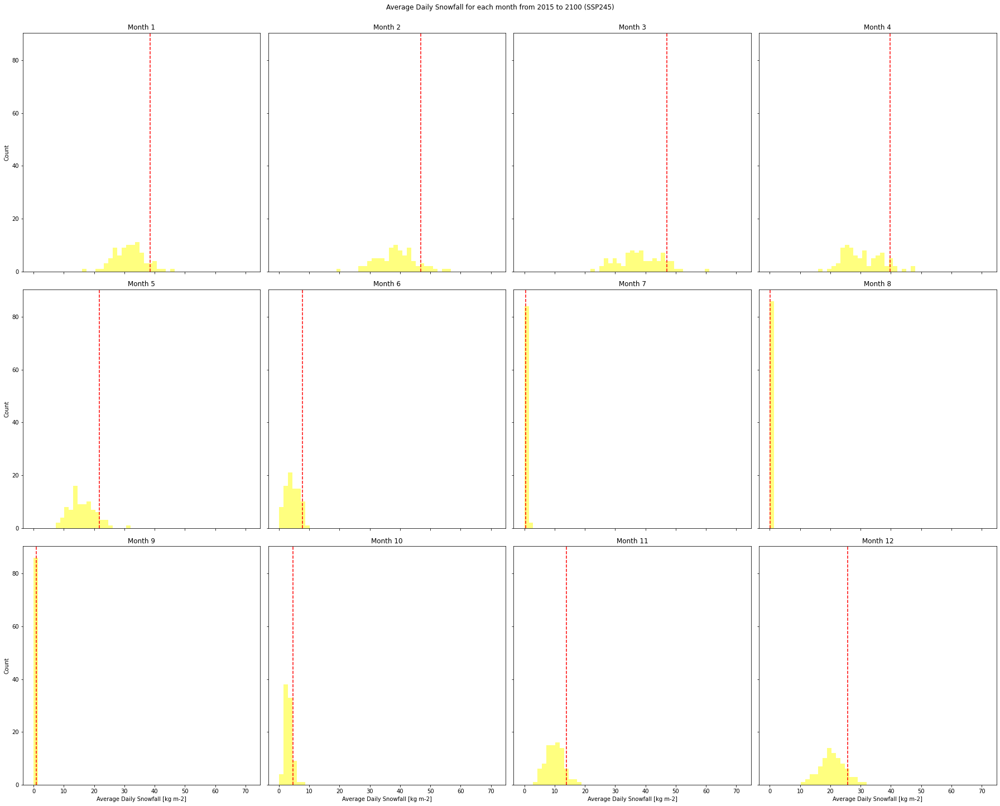

In [73]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_snw_ssp245 = monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == month, drop = True)
    ax.hist(precip_month_snw_ssp245['snw'].values.flatten(), color = 'yellow', bins = bins_snw, alpha = 0.5, label = 'SSP245')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_snw_ssp245['snw'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Snowfall [kg m-2]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Snowfall for each month from 2015 to 2100 (SSP245)', y = 1.001)
plt.tight_layout()
plt.draw()

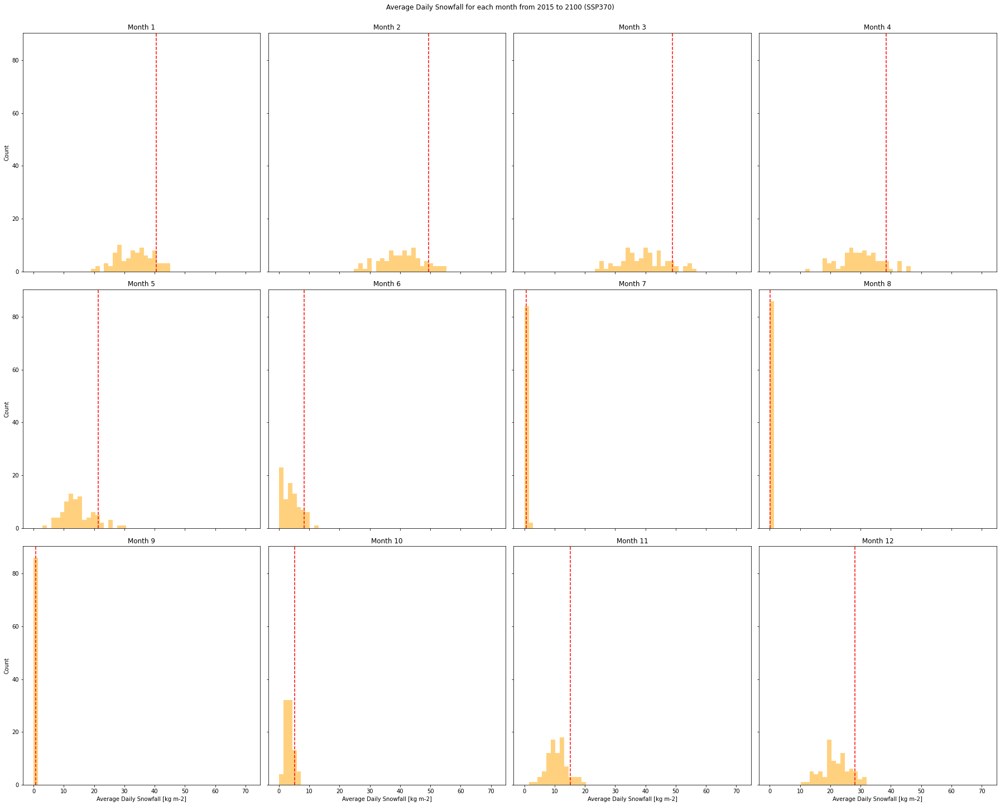

In [74]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_snw_ssp370 = monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == month, drop = True)
    ax.hist(precip_month_snw_ssp370['snw'].values.flatten(), color = 'orange', bins = bins_snw, alpha = 0.5, label = 'SSP370')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_snw_ssp370['snw'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Snowfall [kg m-2]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Snowfall for each month from 2015 to 2100 (SSP370)', y = 1.001)
plt.tight_layout()
plt.draw()

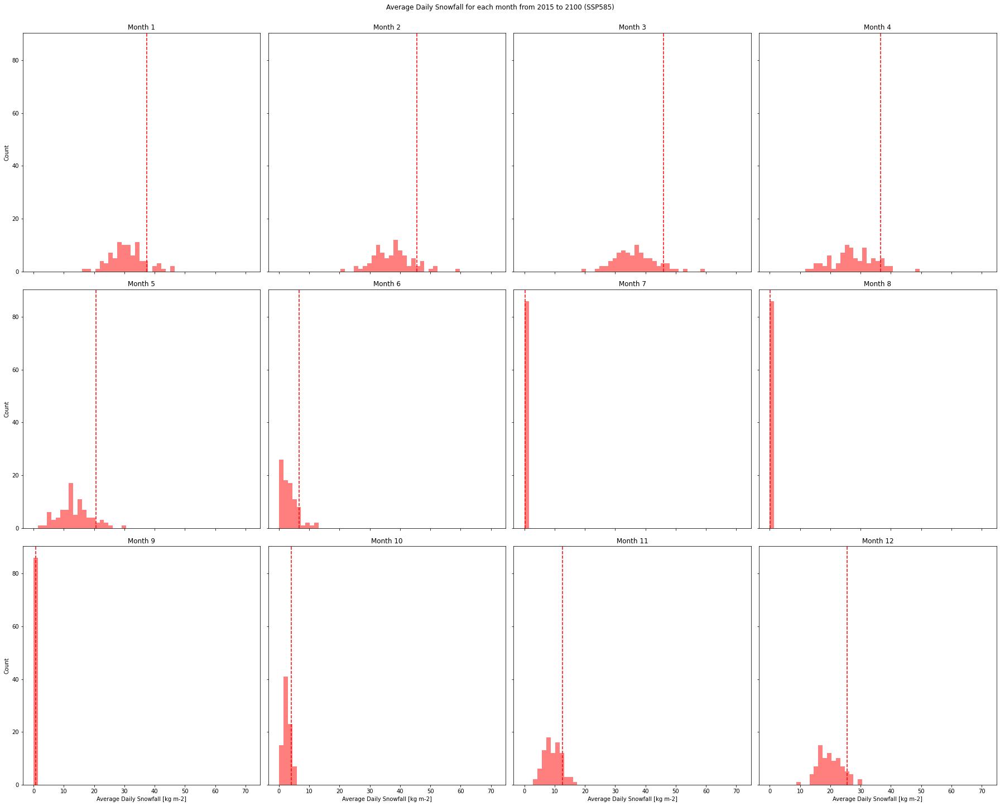

In [75]:
fig, axs = plt.subplots(3, 4, figsize = (25, 20), sharex = True, sharey = True)

for month, ax in zip(range(1, 13), axs.flat):
    precip_month_snw_ssp585 = monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == month, drop = True)
    ax.hist(precip_month_snw_ssp585['snw'].values.flatten(), color = 'red', bins = bins_snw, alpha = 0.5, label = 'SSP585')
    ax.set_title(f'Month {month}')
    p90 = np.percentile(precip_month_snw_ssp585['snw'], 90, axis = 0)
    ax.axvline(x = p90, color = 'r', linestyle = '--', label = '90th percentile')

for ax in axs[-1]:
    ax.set_xlabel('Average Daily Snowfall [kg m-2]')

for ax in axs[:, 0]:
    ax.set_ylabel('Count')

plt.suptitle('Average Daily Snowfall for each month from 2015 to 2100 (SSP585)', y = 1.001)
plt.tight_layout()
plt.draw()

In [76]:
p90_pr_ssp126 = []
p90_pr_ssp245 = []
p90_pr_ssp370 = []
p90_pr_ssp585 = []
for month in range(1, 13):
    precip_month_pr_ssp126 = monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == month, drop = True)
    p90_pr_ssp126.append(np.percentile(precip_month_pr_ssp126['pr'], 90, axis = 0))
    precip_month_pr_ssp245 = monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == month, drop = True)
    p90_pr_ssp245.append(np.percentile(precip_month_pr_ssp245['pr'], 90, axis = 0))
    precip_month_pr_ssp370 = monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == month, drop = True)
    p90_pr_ssp370.append(np.percentile(precip_month_pr_ssp370['pr'], 90, axis = 0))
    precip_month_pr_ssp585 = monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == month, drop = True)
    p90_pr_ssp585.append(np.percentile(precip_month_pr_ssp585['pr'], 90, axis = 0))

In [77]:
p90_snw_ssp126 = []
p90_snw_ssp245 = []
p90_snw_ssp370 = []
p90_snw_ssp585 = []
for month in range(1, 13):
    snwecip_month_snw_ssp126 = monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == month, drop = True)
    p90_snw_ssp126.append(np.percentile(snwecip_month_snw_ssp126['snw'], 90, axis = 0))
    snwecip_month_snw_ssp245 = monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == month, drop = True)
    p90_snw_ssp245.append(np.percentile(snwecip_month_snw_ssp245['snw'], 90, axis = 0))
    snwecip_month_snw_ssp370 = monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == month, drop = True)
    p90_snw_ssp370.append(np.percentile(snwecip_month_snw_ssp370['snw'], 90, axis = 0))
    snwecip_month_snw_ssp585 = monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == month, drop = True)
    p90_snw_ssp585.append(np.percentile(snwecip_month_snw_ssp585['snw'], 90, axis = 0))

In [78]:
pr_ssp126_1 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 1, drop = True)['pr'])
pr_ssp126_2 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 2, drop = True)['pr'])
pr_ssp126_3 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 3, drop = True)['pr'])
pr_ssp126_4 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 4, drop = True)['pr'])
pr_ssp126_5 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 5, drop = True)['pr'])
pr_ssp126_6 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 6, drop = True)['pr'])
pr_ssp126_7 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 7, drop = True)['pr'])
pr_ssp126_8 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 8, drop = True)['pr'])
pr_ssp126_9 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 9, drop = True)['pr'])
pr_ssp126_10 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 10, drop = True)['pr'])
pr_ssp126_11 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 11, drop = True)['pr'])
pr_ssp126_12 = np.array(monthly_average_pr_ssp126.where(monthly_average_pr_ssp126.time.dt.month == 12, drop = True)['pr'])

pr_ssp245_1 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 1, drop = True)['pr'])
pr_ssp245_2 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 2, drop = True)['pr'])
pr_ssp245_3 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 3, drop = True)['pr'])
pr_ssp245_4 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 4, drop = True)['pr'])
pr_ssp245_5 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 5, drop = True)['pr'])
pr_ssp245_6 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 6, drop = True)['pr'])
pr_ssp245_7 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 7, drop = True)['pr'])
pr_ssp245_8 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 8, drop = True)['pr'])
pr_ssp245_9 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 9, drop = True)['pr'])
pr_ssp245_10 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 10, drop = True)['pr'])
pr_ssp245_11 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 11, drop = True)['pr'])
pr_ssp245_12 = np.array(monthly_average_pr_ssp245.where(monthly_average_pr_ssp245.time.dt.month == 12, drop = True)['pr'])

pr_ssp370_1 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 1, drop = True)['pr'])
pr_ssp370_2 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 2, drop = True)['pr'])
pr_ssp370_3 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 3, drop = True)['pr'])
pr_ssp370_4 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 4, drop = True)['pr'])
pr_ssp370_5 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 5, drop = True)['pr'])
pr_ssp370_6 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 6, drop = True)['pr'])
pr_ssp370_7 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 7, drop = True)['pr'])
pr_ssp370_8 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 8, drop = True)['pr'])
pr_ssp370_9 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 9, drop = True)['pr'])
pr_ssp370_10 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 10, drop = True)['pr'])
pr_ssp370_11 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 11, drop = True)['pr'])
pr_ssp370_12 = np.array(monthly_average_pr_ssp370.where(monthly_average_pr_ssp370.time.dt.month == 12, drop = True)['pr'])

pr_ssp585_1 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 1, drop = True)['pr'])
pr_ssp585_2 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 2, drop = True)['pr'])
pr_ssp585_3 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 3, drop = True)['pr'])
pr_ssp585_4 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 4, drop = True)['pr'])
pr_ssp585_5 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 5, drop = True)['pr'])
pr_ssp585_6 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 6, drop = True)['pr'])
pr_ssp585_7 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 7, drop = True)['pr'])
pr_ssp585_8 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 8, drop = True)['pr'])
pr_ssp585_9 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 9, drop = True)['pr'])
pr_ssp585_10 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 10, drop = True)['pr'])
pr_ssp585_11 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 11, drop = True)['pr'])
pr_ssp585_12 = np.array(monthly_average_pr_ssp585.where(monthly_average_pr_ssp585.time.dt.month == 12, drop = True)['pr'])

In [79]:
snw_ssp126_1 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 1, drop = True)['snw'])
snw_ssp126_2 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 2, drop = True)['snw'])
snw_ssp126_3 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 3, drop = True)['snw'])
snw_ssp126_4 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 4, drop = True)['snw'])
snw_ssp126_5 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 5, drop = True)['snw'])
snw_ssp126_6 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 6, drop = True)['snw'])
snw_ssp126_7 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 7, drop = True)['snw'])
snw_ssp126_8 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 8, drop = True)['snw'])
snw_ssp126_9 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 9, drop = True)['snw'])
snw_ssp126_10 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 10, drop = True)['snw'])
snw_ssp126_11 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 11, drop = True)['snw'])
snw_ssp126_12 = np.array(monthly_average_snw_ssp126.where(monthly_average_snw_ssp126.time.dt.month == 12, drop = True)['snw'])

snw_ssp245_1 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 1, drop = True)['snw'])
snw_ssp245_2 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 2, drop = True)['snw'])
snw_ssp245_3 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 3, drop = True)['snw'])
snw_ssp245_4 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 4, drop = True)['snw'])
snw_ssp245_5 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 5, drop = True)['snw'])
snw_ssp245_6 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 6, drop = True)['snw'])
snw_ssp245_7 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 7, drop = True)['snw'])
snw_ssp245_8 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 8, drop = True)['snw'])
snw_ssp245_9 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 9, drop = True)['snw'])
snw_ssp245_10 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 10, drop = True)['snw'])
snw_ssp245_11 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 11, drop = True)['snw'])
snw_ssp245_12 = np.array(monthly_average_snw_ssp245.where(monthly_average_snw_ssp245.time.dt.month == 12, drop = True)['snw'])

snw_ssp370_1 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 1, drop = True)['snw'])
snw_ssp370_2 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 2, drop = True)['snw'])
snw_ssp370_3 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 3, drop = True)['snw'])
snw_ssp370_4 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 4, drop = True)['snw'])
snw_ssp370_5 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 5, drop = True)['snw'])
snw_ssp370_6 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 6, drop = True)['snw'])
snw_ssp370_7 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 7, drop = True)['snw'])
snw_ssp370_8 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 8, drop = True)['snw'])
snw_ssp370_9 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 9, drop = True)['snw'])
snw_ssp370_10 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 10, drop = True)['snw'])
snw_ssp370_11 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 11, drop = True)['snw'])
snw_ssp370_12 = np.array(monthly_average_snw_ssp370.where(monthly_average_snw_ssp370.time.dt.month == 12, drop = True)['snw'])

snw_ssp585_1 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 1, drop = True)['snw'])
snw_ssp585_2 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 2, drop = True)['snw'])
snw_ssp585_3 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 3, drop = True)['snw'])
snw_ssp585_4 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 4, drop = True)['snw'])
snw_ssp585_5 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 5, drop = True)['snw'])
snw_ssp585_6 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 6, drop = True)['snw'])
snw_ssp585_7 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 7, drop = True)['snw'])
snw_ssp585_8 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 8, drop = True)['snw'])
snw_ssp585_9 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 9, drop = True)['snw'])
snw_ssp585_10 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 10, drop = True)['snw'])
snw_ssp585_11 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 11, drop = True)['snw'])
snw_ssp585_12 = np.array(monthly_average_snw_ssp585.where(monthly_average_snw_ssp585.time.dt.month == 12, drop = True)['snw'])

In [80]:
E_pr_ssp126_1 = np.average(pr_ssp126_1[pr_ssp126_1 > p90_pr_ssp126[0]])
E_pr_ssp126_2 = np.average(pr_ssp126_2[pr_ssp126_2 > p90_pr_ssp126[1]])
E_pr_ssp126_3 = np.average(pr_ssp126_3[pr_ssp126_3 > p90_pr_ssp126[2]])
E_pr_ssp126_4 = np.average(pr_ssp126_4[pr_ssp126_4 > p90_pr_ssp126[3]])
E_pr_ssp126_5 = np.average(pr_ssp126_5[pr_ssp126_5 > p90_pr_ssp126[4]])
E_pr_ssp126_6 = np.average(pr_ssp126_6[pr_ssp126_6 > p90_pr_ssp126[5]])
E_pr_ssp126_7 = np.average(pr_ssp126_7[pr_ssp126_7 > p90_pr_ssp126[6]])
E_pr_ssp126_8 = np.average(pr_ssp126_8[pr_ssp126_8 > p90_pr_ssp126[7]])
E_pr_ssp126_9 = np.average(pr_ssp126_9[pr_ssp126_9 > p90_pr_ssp126[8]])
E_pr_ssp126_10 = np.average(pr_ssp126_10[pr_ssp126_10 > p90_pr_ssp126[9]])
E_pr_ssp126_11 = np.average(pr_ssp126_11[pr_ssp126_11 > p90_pr_ssp126[10]])
E_pr_ssp126_12 = np.average(pr_ssp126_12[pr_ssp126_12 > p90_pr_ssp126[11]])

E_pr_ssp245_1 = np.average(pr_ssp245_1[pr_ssp245_1 > p90_pr_ssp245[0]])
E_pr_ssp245_2 = np.average(pr_ssp245_2[pr_ssp245_2 > p90_pr_ssp245[1]])
E_pr_ssp245_3 = np.average(pr_ssp245_3[pr_ssp245_3 > p90_pr_ssp245[2]])
E_pr_ssp245_4 = np.average(pr_ssp245_4[pr_ssp245_4 > p90_pr_ssp245[3]])
E_pr_ssp245_5 = np.average(pr_ssp245_5[pr_ssp245_5 > p90_pr_ssp245[4]])
E_pr_ssp245_6 = np.average(pr_ssp245_6[pr_ssp245_6 > p90_pr_ssp245[5]])
E_pr_ssp245_7 = np.average(pr_ssp245_7[pr_ssp245_7 > p90_pr_ssp245[6]])
E_pr_ssp245_8 = np.average(pr_ssp245_8[pr_ssp245_8 > p90_pr_ssp245[7]])
E_pr_ssp245_9 = np.average(pr_ssp245_9[pr_ssp245_9 > p90_pr_ssp245[8]])
E_pr_ssp245_10 = np.average(pr_ssp245_10[pr_ssp245_10 > p90_pr_ssp245[9]])
E_pr_ssp245_11 = np.average(pr_ssp245_11[pr_ssp245_11 > p90_pr_ssp245[10]])
E_pr_ssp245_12 = np.average(pr_ssp245_12[pr_ssp245_12 > p90_pr_ssp245[11]])

E_pr_ssp370_1 = np.average(pr_ssp370_1[pr_ssp370_1 > p90_pr_ssp370[0]])
E_pr_ssp370_2 = np.average(pr_ssp370_2[pr_ssp370_2 > p90_pr_ssp370[1]])
E_pr_ssp370_3 = np.average(pr_ssp370_3[pr_ssp370_3 > p90_pr_ssp370[2]])
E_pr_ssp370_4 = np.average(pr_ssp370_4[pr_ssp370_4 > p90_pr_ssp370[3]])
E_pr_ssp370_5 = np.average(pr_ssp370_5[pr_ssp370_5 > p90_pr_ssp370[4]])
E_pr_ssp370_6 = np.average(pr_ssp370_6[pr_ssp370_6 > p90_pr_ssp370[5]])
E_pr_ssp370_7 = np.average(pr_ssp370_7[pr_ssp370_7 > p90_pr_ssp370[6]])
E_pr_ssp370_8 = np.average(pr_ssp370_8[pr_ssp370_8 > p90_pr_ssp370[7]])
E_pr_ssp370_9 = np.average(pr_ssp370_9[pr_ssp370_9 > p90_pr_ssp370[8]])
E_pr_ssp370_10 = np.average(pr_ssp370_10[pr_ssp370_10 > p90_pr_ssp370[9]])
E_pr_ssp370_11 = np.average(pr_ssp370_11[pr_ssp370_11 > p90_pr_ssp370[10]])
E_pr_ssp370_12 = np.average(pr_ssp370_12[pr_ssp370_12 > p90_pr_ssp370[11]])

E_pr_ssp585_1 = np.average(pr_ssp585_1[pr_ssp585_1 > p90_pr_ssp585[0]])
E_pr_ssp585_2 = np.average(pr_ssp585_2[pr_ssp585_2 > p90_pr_ssp585[1]])
E_pr_ssp585_3 = np.average(pr_ssp585_3[pr_ssp585_3 > p90_pr_ssp585[2]])
E_pr_ssp585_4 = np.average(pr_ssp585_4[pr_ssp585_4 > p90_pr_ssp585[3]])
E_pr_ssp585_5 = np.average(pr_ssp585_5[pr_ssp585_5 > p90_pr_ssp585[4]])
E_pr_ssp585_6 = np.average(pr_ssp585_6[pr_ssp585_6 > p90_pr_ssp585[5]])
E_pr_ssp585_7 = np.average(pr_ssp585_7[pr_ssp585_7 > p90_pr_ssp585[6]])
E_pr_ssp585_8 = np.average(pr_ssp585_8[pr_ssp585_8 > p90_pr_ssp585[7]])
E_pr_ssp585_9 = np.average(pr_ssp585_9[pr_ssp585_9 > p90_pr_ssp585[8]])
E_pr_ssp585_10 = np.average(pr_ssp585_10[pr_ssp585_10 > p90_pr_ssp585[9]])
E_pr_ssp585_11 = np.average(pr_ssp585_11[pr_ssp585_11 > p90_pr_ssp585[10]])
E_pr_ssp585_12 = np.average(pr_ssp585_12[pr_ssp585_12 > p90_pr_ssp585[11]])

In [81]:
E_snw_ssp126_1 = np.average(snw_ssp126_1[snw_ssp126_1 > p90_snw_ssp126[0]])
E_snw_ssp126_2 = np.average(snw_ssp126_2[snw_ssp126_2 > p90_snw_ssp126[1]])
E_snw_ssp126_3 = np.average(snw_ssp126_3[snw_ssp126_3 > p90_snw_ssp126[2]])
E_snw_ssp126_4 = np.average(snw_ssp126_4[snw_ssp126_4 > p90_snw_ssp126[3]])
E_snw_ssp126_5 = np.average(snw_ssp126_5[snw_ssp126_5 > p90_snw_ssp126[4]])
E_snw_ssp126_6 = np.average(snw_ssp126_6[snw_ssp126_6 > p90_snw_ssp126[5]])
E_snw_ssp126_7 = np.average(snw_ssp126_7[snw_ssp126_7 > p90_snw_ssp126[6]])
E_snw_ssp126_8 = np.average(snw_ssp126_8[snw_ssp126_8 > p90_snw_ssp126[7]])
E_snw_ssp126_9 = np.average(snw_ssp126_9[snw_ssp126_9 > p90_snw_ssp126[8]])
E_snw_ssp126_10 = np.average(snw_ssp126_10[snw_ssp126_10 > p90_snw_ssp126[9]])
E_snw_ssp126_11 = np.average(snw_ssp126_11[snw_ssp126_11 > p90_snw_ssp126[10]])
E_snw_ssp126_12 = np.average(snw_ssp126_12[snw_ssp126_12 > p90_snw_ssp126[11]])

E_snw_ssp245_1 = np.average(snw_ssp245_1[snw_ssp245_1 > p90_snw_ssp245[0]])
E_snw_ssp245_2 = np.average(snw_ssp245_2[snw_ssp245_2 > p90_snw_ssp245[1]])
E_snw_ssp245_3 = np.average(snw_ssp245_3[snw_ssp245_3 > p90_snw_ssp245[2]])
E_snw_ssp245_4 = np.average(snw_ssp245_4[snw_ssp245_4 > p90_snw_ssp245[3]])
E_snw_ssp245_5 = np.average(snw_ssp245_5[snw_ssp245_5 > p90_snw_ssp245[4]])
E_snw_ssp245_6 = np.average(snw_ssp245_6[snw_ssp245_6 > p90_snw_ssp245[5]])
E_snw_ssp245_7 = np.average(snw_ssp245_7[snw_ssp245_7 > p90_snw_ssp245[6]])
E_snw_ssp245_8 = np.average(snw_ssp245_8[snw_ssp245_8 > p90_snw_ssp245[7]])
E_snw_ssp245_9 = np.average(snw_ssp245_9[snw_ssp245_9 > p90_snw_ssp245[8]])
E_snw_ssp245_10 = np.average(snw_ssp245_10[snw_ssp245_10 > p90_snw_ssp245[9]])
E_snw_ssp245_11 = np.average(snw_ssp245_11[snw_ssp245_11 > p90_snw_ssp245[10]])
E_snw_ssp245_12 = np.average(snw_ssp245_12[snw_ssp245_12 > p90_snw_ssp245[11]])

E_snw_ssp370_1 = np.average(snw_ssp370_1[snw_ssp370_1 > p90_snw_ssp370[0]])
E_snw_ssp370_2 = np.average(snw_ssp370_2[snw_ssp370_2 > p90_snw_ssp370[1]])
E_snw_ssp370_3 = np.average(snw_ssp370_3[snw_ssp370_3 > p90_snw_ssp370[2]])
E_snw_ssp370_4 = np.average(snw_ssp370_4[snw_ssp370_4 > p90_snw_ssp370[3]])
E_snw_ssp370_5 = np.average(snw_ssp370_5[snw_ssp370_5 > p90_snw_ssp370[4]])
E_snw_ssp370_6 = np.average(snw_ssp370_6[snw_ssp370_6 > p90_snw_ssp370[5]])
E_snw_ssp370_7 = np.average(snw_ssp370_7[snw_ssp370_7 > p90_snw_ssp370[6]])
E_snw_ssp370_8 = np.average(snw_ssp370_8[snw_ssp370_8 > p90_snw_ssp370[7]])
E_snw_ssp370_9 = np.average(snw_ssp370_9[snw_ssp370_9 > p90_snw_ssp370[8]])
E_snw_ssp370_10 = np.average(snw_ssp370_10[snw_ssp370_10 > p90_snw_ssp370[9]])
E_snw_ssp370_11 = np.average(snw_ssp370_11[snw_ssp370_11 > p90_snw_ssp370[10]])
E_snw_ssp370_12 = np.average(snw_ssp370_12[snw_ssp370_12 > p90_snw_ssp370[11]])

E_snw_ssp585_1 = np.average(snw_ssp585_1[snw_ssp585_1 > p90_snw_ssp585[0]])
E_snw_ssp585_2 = np.average(snw_ssp585_2[snw_ssp585_2 > p90_snw_ssp585[1]])
E_snw_ssp585_3 = np.average(snw_ssp585_3[snw_ssp585_3 > p90_snw_ssp585[2]])
E_snw_ssp585_4 = np.average(snw_ssp585_4[snw_ssp585_4 > p90_snw_ssp585[3]])
E_snw_ssp585_5 = np.average(snw_ssp585_5[snw_ssp585_5 > p90_snw_ssp585[4]])
E_snw_ssp585_6 = np.average(snw_ssp585_6[snw_ssp585_6 > p90_snw_ssp585[5]])
E_snw_ssp585_7 = np.average(snw_ssp585_7[snw_ssp585_7 > p90_snw_ssp585[6]])
E_snw_ssp585_8 = np.average(snw_ssp585_8[snw_ssp585_8 > p90_snw_ssp585[7]])
E_snw_ssp585_9 = np.average(snw_ssp585_9[snw_ssp585_9 > p90_snw_ssp585[8]])
E_snw_ssp585_10 = np.average(snw_ssp585_10[snw_ssp585_10 > p90_snw_ssp585[9]])
E_snw_ssp585_11 = np.average(snw_ssp585_11[snw_ssp585_11 > p90_snw_ssp585[10]])
E_snw_ssp585_12 = np.average(snw_ssp585_12[snw_ssp585_12 > p90_snw_ssp585[11]])

In [82]:
pd.DataFrame([[E_pr_ssp126_1, E_pr_ssp126_2, E_pr_ssp126_3, E_pr_ssp126_4, E_pr_ssp126_5, E_pr_ssp126_6, E_pr_ssp126_7, E_pr_ssp126_8, E_pr_ssp126_9, E_pr_ssp126_10, E_pr_ssp126_11, E_pr_ssp126_12],[E_pr_ssp245_1, E_pr_ssp245_2, E_pr_ssp245_3, E_pr_ssp245_4, E_pr_ssp245_5, E_pr_ssp245_6, E_pr_ssp245_7, E_pr_ssp245_8, E_pr_ssp245_9, E_pr_ssp245_10, E_pr_ssp245_11, E_pr_ssp245_12], [E_pr_ssp370_1, E_pr_ssp370_2, E_pr_ssp370_3, E_pr_ssp370_4, E_pr_ssp370_5, E_pr_ssp370_6, E_pr_ssp370_7, E_pr_ssp370_8, E_pr_ssp370_9, E_pr_ssp370_10, E_pr_ssp370_11, E_pr_ssp370_12], [E_pr_ssp585_1, E_pr_ssp585_2, E_pr_ssp585_3, E_pr_ssp585_4, E_pr_ssp585_5, E_pr_ssp585_6, E_pr_ssp585_7, E_pr_ssp585_8, E_pr_ssp585_9, E_pr_ssp585_10, E_pr_ssp585_11, E_pr_ssp585_12]], columns = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], index = ['SSP126', 'SSP245', 'SSP370', 'SSP585'])

,January,February,March,April,May,June,July,August,September,October,November,December
SSP126,0.000011,0.000012,0.000015,0.000021,0.000025,0.000025,0.000023,0.000016,0.000013,0.000015,0.000015,0.000012
SSP245,0.000011,0.000012,0.000016,0.000022,0.000024,0.000025,0.000023,0.000017,0.000013,0.000015,0.000015,0.000012
SSP370,0.000012,0.000012,0.000016,0.000021,0.000025,0.000026,0.000024,0.000016,0.000013,0.000017,0.000015,0.000013
SSP585,0.000012,0.000012,0.000017,0.000022,0.000026,0.000026,0.000024,0.000016,0.000012,0.000015,0.000016,0.000014


In [83]:
pd.DataFrame([[E_snw_ssp126_1, E_snw_ssp126_2, E_snw_ssp126_3, E_snw_ssp126_4, E_snw_ssp126_5, E_snw_ssp126_6, E_snw_ssp126_7, E_snw_ssp126_8, E_snw_ssp126_9, E_snw_ssp126_10, E_snw_ssp126_11, E_snw_ssp126_12],[E_snw_ssp245_1, E_snw_ssp245_2, E_snw_ssp245_3, E_snw_ssp245_4, E_snw_ssp245_5, E_snw_ssp245_6, E_snw_ssp245_7, E_snw_ssp245_8, E_snw_ssp245_9, E_snw_ssp245_10, E_snw_ssp245_11, E_snw_ssp245_12], [E_snw_ssp370_1, E_snw_ssp370_2, E_snw_ssp370_3, E_snw_ssp370_4, E_snw_ssp370_5, E_snw_ssp370_6, E_snw_ssp370_7, E_snw_ssp370_8, E_snw_ssp370_9, E_snw_ssp370_10, E_snw_ssp370_11, E_snw_ssp370_12], [E_snw_ssp585_1, E_snw_ssp585_2, E_snw_ssp585_3, E_snw_ssp585_4, E_snw_ssp585_5, E_snw_ssp585_6, E_snw_ssp585_7, E_snw_ssp585_8, E_snw_ssp585_9, E_snw_ssp585_10, E_snw_ssp585_11, E_snw_ssp585_12]], columns = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], index = ['SSP126', 'SSP245', 'SSP370', 'SSP585'])

,January,February,March,April,May,June,July,August,September,October,November,December
SSP126,45.266224,53.693733,55.009342,45.921551,27.908058,10.027053,0.657492,0.131425,1.196948,6.548281,17.458189,31.140463
SSP245,40.692318,50.436069,50.138596,42.534363,24.103935,8.250854,0.861856,0.121712,0.984252,5.348285,15.151740,27.986797
SSP370,42.783569,51.929962,52.807964,42.298752,24.905693,9.688860,1.194584,0.098143,0.803217,5.898466,17.427443,29.490000
SSP585,41.467339,49.667961,49.433765,39.409065,23.648001,9.508833,0.539168,0.121909,0.881172,4.874594,14.438939,27.321539
